# Bank of England Sentiment Analysis
## Employer Project - Team 8 AnalytIQ, June 2nd, 2025
**Team Members**: Lalitha Vemuri, Christina Tsoulfa, Reka Bodo, Yann Hirsig, Louis Pang, Dr. Karin Agius Ferrante

## <span style="color:blue"> Full Analysis using Weighted Sentiment Score based on BoE Wordlist</span>

## Content
1. Approach
2. Load the Data
3. Sentiment Analysis using BoE Wordlist
4. Exploratory Analysis for Correlation with Economic Indicators
5. Non-linear Correlation Analysis
6. Insights & Recommendations

## 1. Approach

The **Bank of England (BoE)**, the UK’s central bank and one of the world’s leading financial institutions, plays a pivotal role in maintaining economic and financial stability, and supporting the UK government’s economic policies. One of its key communication channels with the public and markets is through formal speeches delivered by its representatives. These speeches aim to offer guidance, manage expectations, and provide clarity in times of uncertainty.

However, the effectiveness and impact of these speeches on economic indicators and market behaviour are not fully understood. 

This project seeks to explore whether the sentiment and timing of BoE speeches hold analytical or predictive value, when compared with economic performance and key events.

### Main Business Questions
**Has the tone or sentiment of the BoE’s speeches evolved over time? If so, how?**<br>
**How do sentiments align with events like interest rate changes, policy reports, or major economic releases?**

**Sub-questions**

1.	Are there measurable correlations between speech sentiment and UK economic indicators such as inflation, GDP, employment rates and bond yields?
2. Does the change in sentiment change economic indicators or is the speech sentiment reactive to economic indicators?
3. Can speech sentiment trends be used to predict market reactions or economic outcomes?
4. What broader insights can be drawn to support data-informed communication strategies?

## 2. Load the Data

### 2.1. Import libraries

In [13]:
# Install the necessary libraries.
# !pip install nltk
# !pip install vaderSentiment
# !pip install textblob
# !pip install pandas openpyxl
# !pip install transformers torch
# !pip install textstat

In [14]:
# import nltk
# nltk.download('punkt')
# nltk.download('stopwords')
# nltk.download('words')
# nltk.download('omw-1.4')

In [15]:
# General libraries
import numpy as np                             # Numerical operations and array handling.
import pandas as pd                            # Data manipulation and analysis.
import contractions                            # Expanding/contracting text contractions.
import re                                      # Regular expression operations on strings.
import os                                      # Interacting with the operating system and file handling.
import matplotlib.pyplot as plt                # Create visualisations.
from matplotlib.colors import rgb2hex          # Colour conversion in plots.
import seaborn as sns                          # Enhanced statistical data visualisations.
import math                                    # Mathematical functions and constants.
from IPython.display import display, Markdown  # Rich output in Jupyter.
from functools import reduce
from sklearn.feature_extraction.text import CountVectorizer
from collections import  Counter
import plotly.express as px
from statsmodels.tsa.seasonal import seasonal_decompose   # Seasonality
import matplotlib.dates as mdates
import matplotlib.cm as cm

In [485]:
# Text and Sentiment Analysis 
from wordcloud import WordCloud                                       # Generating visual word frequency clouds from text.
import nltk                                                           # Natural language processing tasks.
from nltk import word_tokenize, pos_tag                               # Splitting text into words and tags with part of speech
from nltk import defaultdict                                          # Providing default values for nonexistent keys.
from nltk.probability import FreqDist                                 # Calculating frequency distribution of tokens.
from nltk.corpus import stopwords                                     # Providing list of common words to exclude from analysis.
from nltk.corpus import words
from nltk.corpus import wordnet as wn                                 # Lexical database for retrieving word relationships & meanings.
from nltk.stem import WordNetLemmatizer, PorterStemmer                # Reducing words to base or root form.
from nltk.probability import FreqDist
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer  # Assessing sentiment intensity in text.
from textblob import TextBlob                                         # API for text processing tasks including sentiment analysis.
import contractions                                                   # Expanding/contracting text contractions.
import re                                                             # Regular expression operations on strings.
import ast                                                            # If column contains string representations of lists
from collections import defaultdict  # Creating dictionaries that return default value for nonexistent keys.
from collections import Counter  # Importing Counter for counting hashable objects and efficiently tallying occurrences in an iterable.
stop_words = set(stopwords.words('english'))

In [17]:
# Correlation
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.nonparametric.smoothers_lowess import lowess
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import grangercausalitytests
import scipy.stats as stats
from scipy.stats import t

In [18]:
# Import warnings
import warnings
# Settings for the notebook.
warnings.filterwarnings("ignore")

In [19]:
# Set figure style for seaborn.
sns.set_theme(style='darkgrid')

### 2.2. Define functions

**2.2.a. Charts**

In [22]:
def clean_label(label):
    # If label is a Series, return its name.
    if isinstance(label, pd.Series):
        return label.name.replace('_', ' ').title() if label.name else ' '
    elif isinstance(label, str):
        return label.replace('_', ' ').title()
    return ' '

In [23]:
# Define function for scatterplot.
def generate_scatterplot(df, x_axis, y_axis, title, hue, save_path=None):

    # Set figure size & style for seaborn.
    sns.set_theme(style='darkgrid')
    sns.set(rc={'figure.figsize':(8, 6)})

    # Plot the scatterplot.
    sns.scatterplot(data=df, x=x_axis, y=y_axis, hue=hue, color='#0e1b2c')

    # Customize the plot.
    plt.title(title, fontsize=12, fontweight='bold')
    plt.xlabel(clean_label(x_axis), fontsize=10)
    plt.ylabel(clean_label(y_axis), fontsize=10)

    # Add legend ONLY if hue is not None.
    if hue is not None:
        plt.legend(title='Legend', fontsize=10, bbox_to_anchor=(1.05,1), loc='upper left')
    
    # Save the plot, if save_path is provided.
    if save_path:
        plt.savefig(save_path, dpi=500, bbox_inches='tight')

    # Display the chart.
    plt.tight_layout()
    plt.show()

In [25]:
# Define function to plot a lineplot with various categories.
def generate_multi_lineplot(df, x_axis, y_axis, hue, title, date=None, ylim=None, \
                            save_path=None, errorbar=None, events=None, event_years=None, **kwargs):

    # Set figure size & style for seaborn.
    sns.set_theme(style='darkgrid')
    sns.set(rc={'figure.figsize':(14, 8)})
    
    # Sort DataFrame by the time column.
    df.sort_values(by=x_axis, inplace=True)
    
    # Plot the lineplot.
    sns.lineplot(data=df, x=x_axis, y=y_axis, hue=hue, ci=None, **kwargs)

    # Get current axes
    ax = plt.gca()
    
    # Customize the plot.
    plt.title(title, fontsize=16, fontweight='bold')
    plt.xlabel(clean_label(x_axis), fontsize=14)
    plt.ylabel(clean_label(y_axis), fontsize=14)
    plt.legend(title='Legend', fontsize=12, bbox_to_anchor=(1.05,1), loc='upper left')
    plt.tick_params(axis='both', labelsize=12)
    
    # Add annotation lines, if provided.
    if date:
        plt.axvline(x=date, color='k', linestyle='--')

    # Add shading for each event period
    if events:
        for start_date, end_date in events:
            ax.axvspan(start_date, end_date, color='yellow', alpha=0.3)

    # Add event lines if provided
    if event_years:
        for year, label in event_years:
            ax.axvline(x=year, color='blue', linestyle='--', alpha=0.7)
            # Add a label or annotation
            y_position = plt.ylim()[1] * 0.3  # 30% of max y for label placement
            ax.text(year, y_position, label, rotation=90, verticalalignment='bottom', color='blue')
    
    # Rotate labels on the x-axis.
    plt.xticks(rotation=45)
    
    # Set y-axis limits, if provided.
    if ylim:
        plt.ylim(ylim)

    # Save the plot, if save_path is provided.
    if save_path:
        plt.savefig(save_path, dpi=500, bbox_inches='tight')
    
    # Display the chart.
    plt.tight_layout()
    plt.show()

In [27]:
# Define function to plot a lineplot with a trendline.
def generate_lineplot_with_trendline(df, x_axis, y_axis, title, date=None, ylim=None, \
                                     rotate_xticks=False, save_path=None, errorbar=None):
    
    # Set figure size & style for seaborn.
    sns.set_theme(style='darkgrid')
    sns.set(rc={'figure.figsize':(14, 8)})
    
    # Ensure time column is in datetime format.
    df[x_axis] = pd.to_datetime(df[x_axis])
    
    # Sort DataFrame by the time column.
    df.sort_values(by=x_axis, inplace=True)
    
    # Calculate trendline.
    x = np.arange(len(df))
    y = df[y_axis].values
    z = np.polyfit(x, y, 1)
    p = np.poly1d(z)
    
    # Plot the lineplot.
    sns.lineplot(data=df, x=x_axis, y=y_axis, label=clean_label(y_axis))
    
    # Plot the trendline.
    plt.plot(df[x_axis], p(x), linestyle='--', color='r', label='Trendline')

    # Customize the plot.
    plt.title(title, fontsize=16, fontweight='bold')
    plt.xlabel(clean_label(x_axis), fontsize=14)
    plt.ylabel(clean_label(y_axis), fontsize=14)
    plt.legend(title='Legend', fontsize=12, bbox_to_anchor=(1.05,1), loc='upper left')
    plt.tick_params(axis='both', labelsize=12)
    
    # Add annotation lines, if provided.
    if date:
        plt.axvline(x=date, color='k', linestyle='--')
    
    # Rotate x-tick labels by 45 degrees, if specified.
    if rotate_xticks:
        plt.xticks(rotation=45)
    
    # Set y-axis limits, if provided.
    if ylim:
        plt.ylim(ylim)

    # Save the plot, if save_path is provided.
    if save_path:
        plt.savefig(save_path, dpi=500, bbox_inches='tight')
    
    # Display the chart.
    plt.tight_layout()
    plt.show()

**2.2.b. Natural Language Processing**

In [30]:
# Preprocessing function
def preprocess_text(text):
    text = contractions.fix(text)  # Expand contractions i.e I'm not good goes to I am not good
    text = re.sub(r'http\S+', '', text)  # Remove URLs
    text = re.sub('#', '', text)         # Remove hashtags
    text = re.sub(r'\W', ' ', text)      # Remove special characters
    text = text.lower()                  # Convert to lowercase
    #Below is to create a set of stop words from the NLTK library's predefined list but not is excluded.
    stop_words = set(stopwords.words('english')) - {'not'} 
    text = ' '.join([word for word in text.split() if word not in stop_words])
    return text

In [31]:
# Define the tag map for POS tagging.
tag_map = defaultdict(lambda: wn.NOUN)
tag_map['J'] = wn.ADJ
tag_map['V'] = wn.VERB
tag_map['R'] = wn.ADV

# Lemmatise the tokens with correct POS tags.
lemma_function = WordNetLemmatizer()

# Lemmatisation function.
def lemmatize_tokens(tokens):
    #For each word in the token list, it lemmatizes the word with the correct part-of-speech
    lemmatized_tokens = [lemma_function.lemmatize(token, tag_map[tag[0]]) for token, tag in pos_tag(tokens)]
    return lemmatized_tokens

In [32]:
# Define function to apply the lexicon to the tokens
def lexicon_counts(tokens):
    return pd.Series({
        cat: sum(t in word_sets[cat] for t in tokens)
        for cat in categories
    })

In [33]:
# Define function to apply the lexicon to the text
def lexicon_score_weighted(tokens):
    score = 0
    for cat in categories:
        count = sum(t in word_sets[cat] for t in tokens)
        score += count * category_weights[cat]
    return score

### 2.3. Import and review the data

**2.3.a. Import Bank of England Speeches**

In [37]:
# Load the CSV file as speeches.
speeches_original = pd.read_csv('/Users/kaferrante/Documents/Python/_Course4_Project/all_speeches.csv')

# View the data.
speeches_original.head()

,reference,country,date,title,author,is_gov,text
0,r901128a_BOA,australia,1990-11-28,A Proper Role for Monetary Policy,fraser,0,They would no doubt argue that to have two obj...
1,r911003a_BOA,australia,1991-10-03,,fraser,0,Today I wish to talk about real interest rates...
2,r920314a_BOA,australia,1992-03-14,,fraser,0,I welcome this opportunity to talk about prosp...
3,r920529a_BOA,australia,1992-05-29,,fraser,0,It is a pleasure to have this opportunity to a...
4,r920817a_BOA,australia,1992-08-17,,fraser,0,"As a long-time fan of Don Sanders, I am deligh..."


In [38]:
# Explore data set.
speeches_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7721 entries, 0 to 7720
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   reference  7721 non-null   object
 1   country    7721 non-null   object
 2   date       7721 non-null   object
 3   title      7721 non-null   object
 4   author     7721 non-null   object
 5   is_gov     7721 non-null   int64 
 6   text       7721 non-null   object
dtypes: int64(1), object(6)
memory usage: 422.4+ KB


In [39]:
# Check for missing values.
speeches_original.isnull().sum()

reference    0
country      0
date         0
title        0
author       0
is_gov       0
text         0
dtype: int64

In [40]:
# Check for duplicates.
speeches_original.duplicated().sum()

0

In [41]:
# Review basic descriptive statistics.
speeches_original.describe()

,is_gov
count,7721.000000
mean,0.347235
std,0.476122
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,1.000000


In [42]:
# View the countries.
speeches_original['country'].unique()

array(['australia', 'canada', 'euro area', 'japan', 'sweden',
       'switzerland', 'united kingdom', 'united states'], dtype=object)

In [43]:
# View the author.
speeches_original['author'].unique()

array(['fraser', 'macfarlane', 'lowe', 'stevens', 'no_info', 'ac',
       'thiessen', 'bonin', 'dodge', 'jenkins', 'kennedy', 'macklem',
       'duguay', 'longworth', 'carney', 'murray', 'lane', 'wolf',
       'boivin', 'cote', 'poloz', 'schembri', 'johnson', 'wilkins',
       'chilcott', 'mendes', 'patterson', 'murchison', 'leduc', 'dinis',
       'beaudry', 'gravelle', 'kozicki', 'rogers', 'morrow', 'lamfalussy',
       'duisenberg', 'vienna', 'london', 'tokyo', 'kong', 'bank',
       'schioppa', 'hamalainen', 'main', 'noyer', 'committee', 'solans',
       'francisco', 'istanbul', 'issing', 'hoogduin', 'bankwashington',
       'efma', 'brussels', 'forum', 'workshop', 'quiros', 'papademos',
       'gugerell', 'trichet', 'network', 'delivered', 'paramo',
       'strasbourg', 'rome', 'berlin', 'smaghi', 'sevilla', 'madrid',
       'stark', 'singapore', 'summit', 'washington', 'aires',
       'bratislava', 'ecb', 'constancio', 'posen', 'praet', 'draghi',
       'coeure', 'asmussen', 'mer

In [44]:
# Check the number of unique values.
speeches_original.nunique()

reference    7721
country         8
date         4410
title        6218
author        325
is_gov          2
text         7692
dtype: int64

In [45]:
# Create a normalized version of the 'text' column
speeches_original['text_norm'] = speeches_original['text'].str.strip().str.lower()

# Find duplicate 'text_norm' entries
duplicate_mask = speeches_original['text_norm'].duplicated(keep=False)

# Extract all duplicates based on normalized text
duplicates = speeches_original[duplicate_mask]

In [46]:
# Show the entire row for text duplicates
duplicates

,reference,country,date,title,author,is_gov,text,text_norm
564,r101026a_BOC,canada,2010-10-26,Opening Statement before the House of Commons ...,carney,1,"Governor of the Bank of Canada Good afternoon,...","governor of the bank of canada good afternoon,..."
565,r101027a_BOC,canada,2010-10-27,Opening Statement before the Standing Senate C...,carney,1,"Governor of the Bank of Canada Good afternoon,...","governor of the bank of canada good afternoon,..."
610,r120424a_BOC,canada,2012-04-24,Opening Statement before the House of Commons ...,carney,1,Governor of the Bank of Canada Good afternoon....,governor of the bank of canada good afternoon....
611,r120425a_BOC,canada,2012-04-25,Opening Statement before the Senate Standing C...,carney,1,Governor of the Bank of Canada Good afternoon....,governor of the bank of canada good afternoon....
624,r121030a_BOC,canada,2012-10-30,Opening Statement before the House of Commons ...,carney,1,Governor of the Bank of Canada Good afternoon....,governor of the bank of canada good afternoon....
625,r121031a_BOC,canada,2012-10-31,Opening Statement before the Standing Senate C...,carney,1,Governor of the Bank of Canada Good afternoon....,governor of the bank of canada good afternoon....
668,r140429a_BOC,canada,2014-04-29,Opening Statement before the House of Commons ...,poloz,1,Governor of the Bank of Canada Thank you for t...,governor of the bank of canada thank you for t...
669,r140430a_BOC,canada,2014-04-30,Opening Statement before the Senate Standing C...,poloz,1,Governor of the Bank of Canada Thank you for t...,governor of the bank of canada thank you for t...
1182,r020121a_ECB,euro area,2002-01-21,Securities and banking: bridges and walls,no_info,0,I once again find myself speaking at the Londo...,i once again find myself speaking at the londo...
1186,r020221a_ECB,euro area,2002-02-21,Securities and banking: bridges and walls,schioppa,0,I once again find myself speaking at the Londo...,i once again find myself speaking at the londo...


**Observation**: As speeches were given on different dates and by different people, the entries are not full duplicates. <br>
There are 29 entries in the duplicate list, but each speech is only duplicated a few times. This will not impact the analysis and duplicates will not be removed.

**2.3.b. Import BoE Wordlist**

In [49]:
# Load the Excel file of BoE sentiment labelled wordlist.
sentiment_lexicon = pd.read_excel('/Users/kaferrante/Documents/Python/_Course4_Project/sentiment_labelled_wordlist.xlsx')

# View the data.
sentiment_lexicon.head()

,Word,Negative,Positive,Uncertainty,Litigious,Strong,Weak,Constraining
0,ABANDON,1,0,0,0,0,0,0
1,ABANDONED,1,0,0,0,0,0,0
2,ABANDONING,1,0,0,0,0,0,0
3,ABANDONMENT,1,0,0,0,0,0,0
4,ABANDONMENTS,1,0,0,0,0,0,0


In [50]:
# Explore data set.
sentiment_lexicon.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3880 entries, 0 to 3879
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Word          3880 non-null   object
 1   Negative      3880 non-null   int64 
 2   Positive      3880 non-null   int64 
 3   Uncertainty   3880 non-null   int64 
 4   Litigious     3880 non-null   int64 
 5   Strong        3880 non-null   int64 
 6   Weak          3880 non-null   int64 
 7   Constraining  3880 non-null   int64 
dtypes: int64(7), object(1)
memory usage: 242.6+ KB


In [51]:
# Check for missing values.
sentiment_lexicon.isnull().sum()

Word            0
Negative        0
Positive        0
Uncertainty     0
Litigious       0
Strong          0
Weak            0
Constraining    0
dtype: int64

In [52]:
# Review basic descriptive statistics.
sentiment_lexicon.describe()

,Negative,Positive,Uncertainty,Litigious,Strong,Weak,Constraining
count,3880.000000,3880.000000,3880.000000,3880.000000,3880.000000,3880.000000,3880.000000
mean,0.606959,0.092268,0.076546,0.233247,0.004897,0.006959,0.047423
std,0.488489,0.289441,0.265905,0.422953,0.069815,0.083139,0.212569
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [53]:
# Rename columns
sentiment_lexicon = sentiment_lexicon.rename(columns={
    'Negative': 'negative',
    'Positive': 'positive',
    'Uncertainty': 'uncertainty',
    'Litigious': 'litigious',
    'Strong': 'strong',
    'Weak': 'weak',
    'Constraining': 'constraining',
})

# View the DataFrame
sentiment_lexicon.head()

,Word,negative,positive,uncertainty,litigious,strong,weak,constraining
0,ABANDON,1,0,0,0,0,0,0
1,ABANDONED,1,0,0,0,0,0,0
2,ABANDONING,1,0,0,0,0,0,0
3,ABANDONMENT,1,0,0,0,0,0,0
4,ABANDONMENTS,1,0,0,0,0,0,0


**2.3.c. Import UK Economic Indicators (1998-2025)**

In [55]:
# Load the Excel file for UK Economic Indicators
uk_economic_indicators = pd.read_excel('/Users/kaferrante/Documents/Python/_Course4_Project/Consolidated_Eco_KPI _V3.xlsx')

# View the data.
uk_economic_indicators.head()

,year,month,year_month,uk_inflation_rate_CPIH,uk_unemployment_rate,uk_gdp_growth,uk_interest_rate,uk_consumer_confidence,gbp_usd_fx,ftse_250,gilts_short,gilts_medium,gilts_long,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types
0,1998,4,1998-04,1.815,6.3,0.6,7.25,1.1,1.673270,5554.720972,5.91,5.70,5.71,14.1,24.7,64258
1,1998,5,1998-05,2.039,6.3,0.6,7.25,1.2,1.636589,5799.256322,5.82,5.57,5.55,14.4,24.5,64258
2,1998,6,1998-06,1.675,6.3,0.6,7.50,-1.3,1.650718,5739.277233,6.17,5.64,5.43,13.9,25.5,64258
3,1998,7,1998-07,1.443,6.3,0.3,7.50,-4.3,1.643657,5595.919582,6.06,5.57,5.38,14.6,25.6,67057
4,1998,8,1998-08,1.327,6.2,0.3,7.50,-6.5,1.631950,5173.355054,5.52,5.19,5.11,14.6,26.1,67057


In [56]:
# Explore data set.
uk_economic_indicators.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 321 entries, 0 to 320
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   year                          321 non-null    int64  
 1   month                         321 non-null    int64  
 2   year_month                    321 non-null    object 
 3   uk_inflation_rate_CPIH        321 non-null    float64
 4   uk_unemployment_rate          321 non-null    float64
 5   uk_gdp_growth                 321 non-null    float64
 6   uk_interest_rate              321 non-null    float64
 7   uk_consumer_confidence        321 non-null    float64
 8   gbp_usd_fx                    321 non-null    float64
 9   ftse_250                      321 non-null    float64
 10  gilts_short                   321 non-null    float64
 11  gilts_medium                  321 non-null    float64
 12  gilts_long                    321 non-null    float64
 13  uk_cr

In [57]:
# Check for missing values.
uk_economic_indicators.isnull().sum()

year                            0
month                           0
year_month                      0
uk_inflation_rate_CPIH          0
uk_unemployment_rate            0
uk_gdp_growth                   0
uk_interest_rate                0
uk_consumer_confidence          0
gbp_usd_fx                      0
ftse_250                        0
gilts_short                     0
gilts_medium                    0
gilts_long                      0
uk_credit_growth_no_cc          0
uk_credit_growth_only_cc        0
avg_price_all_property_types    0
dtype: int64

In [58]:
# View column types.
uk_economic_indicators.dtypes

year                              int64
month                             int64
year_month                       object
uk_inflation_rate_CPIH          float64
uk_unemployment_rate            float64
uk_gdp_growth                   float64
uk_interest_rate                float64
uk_consumer_confidence          float64
gbp_usd_fx                      float64
ftse_250                        float64
gilts_short                     float64
gilts_medium                    float64
gilts_long                      float64
uk_credit_growth_no_cc          float64
uk_credit_growth_only_cc        float64
avg_price_all_property_types      int64
dtype: object

### 2.4. Date Transformation

**Speeches**

In [61]:
# Determine the date format for speeches.
speeches_original.date.head()

0    1990-11-28
1    1991-10-03
2    1992-03-14
3    1992-05-29
4    1992-08-17
Name: date, dtype: object

In [62]:
# Change date format from 'object' to 'datetime64' and display in a new column
speeches_original['date_format'] = speeches_original['date'].astype('datetime64[ns]')

In [63]:
# Add a new column for year and month
speeches_original['year_month'] = pd.to_datetime(speeches_original['date_format']).dt.to_period('M')

In [64]:
# Add a new column for year only
speeches_original['year'] = pd.to_datetime(speeches_original.date).dt.year

In [65]:
# Add a column for year_month in date format
speeches_original['year_month_dt'] = speeches_original['year_month'].dt.to_timestamp()

In [66]:
# View the DataFrame.
speeches_original.head()

,reference,country,date,title,author,is_gov,text,text_norm,date_format,year_month,year,year_month_dt
0,r901128a_BOA,australia,1990-11-28,A Proper Role for Monetary Policy,fraser,0,They would no doubt argue that to have two obj...,they would no doubt argue that to have two obj...,1990-11-28,1990-11,1990,1990-11-01
1,r911003a_BOA,australia,1991-10-03,,fraser,0,Today I wish to talk about real interest rates...,today i wish to talk about real interest rates...,1991-10-03,1991-10,1991,1991-10-01
2,r920314a_BOA,australia,1992-03-14,,fraser,0,I welcome this opportunity to talk about prosp...,i welcome this opportunity to talk about prosp...,1992-03-14,1992-03,1992,1992-03-01
3,r920529a_BOA,australia,1992-05-29,,fraser,0,It is a pleasure to have this opportunity to a...,it is a pleasure to have this opportunity to a...,1992-05-29,1992-05,1992,1992-05-01
4,r920817a_BOA,australia,1992-08-17,,fraser,0,"As a long-time fan of Don Sanders, I am deligh...","as a long-time fan of don sanders, i am deligh...",1992-08-17,1992-08,1992,1992-08-01


In [67]:
# View column types.
speeches_original.dtypes

reference                object
country                  object
date                     object
title                    object
author                   object
is_gov                    int64
text                     object
text_norm                object
date_format      datetime64[ns]
year_month            period[M]
year                      int32
year_month_dt    datetime64[ns]
dtype: object

**Indicators**

In [70]:
# Add a new column for year and month.
uk_economic_indicators['year_month'] = pd.to_datetime(uk_economic_indicators['year_month']).dt.to_period('M')

In [71]:
# View the DataFrame.
uk_economic_indicators.head()

,year,month,year_month,uk_inflation_rate_CPIH,uk_unemployment_rate,uk_gdp_growth,uk_interest_rate,uk_consumer_confidence,gbp_usd_fx,ftse_250,gilts_short,gilts_medium,gilts_long,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types
0,1998,4,1998-04,1.815,6.3,0.6,7.25,1.1,1.673270,5554.720972,5.91,5.70,5.71,14.1,24.7,64258
1,1998,5,1998-05,2.039,6.3,0.6,7.25,1.2,1.636589,5799.256322,5.82,5.57,5.55,14.4,24.5,64258
2,1998,6,1998-06,1.675,6.3,0.6,7.50,-1.3,1.650718,5739.277233,6.17,5.64,5.43,13.9,25.5,64258
3,1998,7,1998-07,1.443,6.3,0.3,7.50,-4.3,1.643657,5595.919582,6.06,5.57,5.38,14.6,25.6,67057
4,1998,8,1998-08,1.327,6.2,0.3,7.50,-6.5,1.631950,5173.355054,5.52,5.19,5.11,14.6,26.1,67057


In [72]:
# View column types.
uk_economic_indicators.dtypes

year                                int64
month                               int64
year_month                      period[M]
uk_inflation_rate_CPIH            float64
uk_unemployment_rate              float64
uk_gdp_growth                     float64
uk_interest_rate                  float64
uk_consumer_confidence            float64
gbp_usd_fx                        float64
ftse_250                          float64
gilts_short                       float64
gilts_medium                      float64
gilts_long                        float64
uk_credit_growth_no_cc            float64
uk_credit_growth_only_cc          float64
avg_price_all_property_types        int64
dtype: object

### 2.5. Data Correction

**2.5.a Author 'Edward George' wrongly not stated as governor**

In [76]:
# Speeches given by Edward George are wrongly not stated as is_gov
def correct_is_gov_column(speeches_df: pd.DataFrame):
    # Make sure date is datetime first
    speeches_original['date'] = pd.to_datetime(speeches_original['date'], errors='coerce')
    
    # Apply correction
    condition = (
        (speeches_original['author'].str.lower() == 'george') &
        (speeches_original['date'].dt.year > 1993) &
        (speeches_original['date'].dt.year < 2004)
    )
    speeches_original.loc[condition, 'is_gov'] = 1  # 1 means Governor
    
    return speeches_original

# Correct the is_gov column
speeches_original = correct_is_gov_column(speeches_original)

# View the DataFrame
display(speeches_original[speeches_original['author'].str.lower() == 'george'].head())

,reference,country,date,title,author,is_gov,text,text_norm,date_format,year_month,year,year_month_dt
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...","thank you, chairman. i'm actually very pleased...",1998-09-15,1998-09,1998,1998-09-01
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,it's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,1998-10-01
4966,r981119a_BOE,united kingdom,1998-11-19,Speech,george,1,Let me put some of the recent newspaper headli...,let me put some of the recent newspaper headli...,1998-11-19,1998-11,1998,1998-11-01
4969,r990112a_BOE,united kingdom,1999-01-12,Speech,george,1,I am only too well aware of the pressure curre...,i am only too well aware of the pressure curre...,1999-01-12,1999-01,1999,1999-01-01
4970,r990118a_BOE,united kingdom,1999-01-18,Speech,george,1,It would be a masterly understatement to descr...,it would be a masterly understatement to descr...,1999-01-18,1999-01,1999,1999-01-01


**2.5.b Remove Date Outlier**

In [79]:
# Check for earliest and latest dates
min_year = speeches_original['year'].min()
max_year = speeches_original['year'].max()

print(f"Minimum year: {min_year}")
print(f"Maximum year: {max_year}")

Minimum year: 1900
Maximum year: 2022


In [80]:
# Filter for speeches in year 1900
speeches_1900 = speeches_original[speeches_original['year'] == 1900]

# View the DataFrame
speeches_1900

,reference,country,date,title,author,is_gov,text,text_norm,date_format,year_month,year,year_month_dt
4010,r000101a_SRB,sweden,1900-01-01,Swedish economy in transition,backstrom,1,Thank you for inviting me to talk with you thi...,thank you for inviting me to talk with you thi...,1900-01-01,1900-01,1900,1900-01-01


In [81]:
# Remove the specific row with index 4010, as the date must be wrongly entered, as dates on start in 1990
# Backstrom was governor of the Bank of Sweden from 1994 to 2002.
speeches_original = speeches_original.drop(4010)

In [82]:
# Check for earliest and latest dates
min_year = speeches_original['year'].min()
max_year = speeches_original['year'].max()

print(f"Minimum year: {min_year}")
print(f"Maximum year: {max_year}")

Minimum year: 1990
Maximum year: 2022


In [83]:
# Review the DataFrame
speeches_original.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7720 entries, 0 to 7720
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   reference      7720 non-null   object        
 1   country        7720 non-null   object        
 2   date           7720 non-null   datetime64[ns]
 3   title          7720 non-null   object        
 4   author         7720 non-null   object        
 5   is_gov         7720 non-null   int64         
 6   text           7720 non-null   object        
 7   text_norm      7720 non-null   object        
 8   date_format    7720 non-null   datetime64[ns]
 9   year_month     7720 non-null   period[M]     
 10  year           7720 non-null   int32         
 11  year_month_dt  7720 non-null   datetime64[ns]
dtypes: datetime64[ns](3), int32(1), int64(1), object(6), period[M](1)
memory usage: 753.9+ KB


### 2.6. Review of Economic Events

### 2000s
- **2003 Introduction of the BoE Inflation Target**: BoE formalised its inflation targeting policy, focusing on controlling inflation through monetary policy
- **2005 London Bombings**: economic impact included effects on the tourism and hospitality sectors
- **2008 Global Financial Crisis**: UK’s economy entered a recession, banks faced collapse, and extensive government interventions were implemented.

### 2010s
- **2010 Austerity Measures**: UK government, under David Cameron, implemented austerity policies to reduce budget deficits post-2008 crisis.
- **2016 Brexit Referendum**: UK voted to leave the EU, causing significant economic uncertainty, currency depreciation, and market volatility.
- **2017 Post-Brexit Currency Shock**: The pound fell sharply after the Brexit vote, increasing inflation and impacting consumer prices.
- **2018-2020 Economic Growth and Challenges**: UK faced slow growth, investment uncertainties, and the beginning of the COVID-19 pandemic impact.

### 2020s
- **2020 COVID-19 Pandemic**: Massive economic disruption worldwide, with the UK-government introducing support measures like the furlough scheme and emergency loans. GDP contracted by around 9.9% in 2020.
- **2021-2022 Post-Pandemic Recovery**: Efforts to recover growth, inflation concerns, labor shortages, and supply chain disruptions.
- **2021-2022 Inflation Surge**: Rising inflation due to supply chain bottlenecks, energy prices, and post-pandemic demand.
- **2021-2022 Energy Price Shock**: Rising energy costs affected households and industries.
- **2022 Interest Rate Hikes**: BoE increased interest rates to curb inflation.

## 3. Sentiment Analysis using BoE Wordlist

### 3.1. Calculate Sentiment Scores using BoE Wordlist

**3.1.a. Transform the data to lowercase and removal of punctuation**
- Remove elements such as hashtags and urls
- Remove any special characters and punctuation
- Convert text to lower case
- Remove stopwords

In [92]:
# Create new DataFrame for data transformation
speeches = speeches_original.copy()

speeches.head()

,reference,country,date,title,author,is_gov,text,text_norm,date_format,year_month,year,year_month_dt
0,r901128a_BOA,australia,1990-11-28,A Proper Role for Monetary Policy,fraser,0,They would no doubt argue that to have two obj...,they would no doubt argue that to have two obj...,1990-11-28,1990-11,1990,1990-11-01
1,r911003a_BOA,australia,1991-10-03,,fraser,0,Today I wish to talk about real interest rates...,today i wish to talk about real interest rates...,1991-10-03,1991-10,1991,1991-10-01
2,r920314a_BOA,australia,1992-03-14,,fraser,0,I welcome this opportunity to talk about prosp...,i welcome this opportunity to talk about prosp...,1992-03-14,1992-03,1992,1992-03-01
3,r920529a_BOA,australia,1992-05-29,,fraser,0,It is a pleasure to have this opportunity to a...,it is a pleasure to have this opportunity to a...,1992-05-29,1992-05,1992,1992-05-01
4,r920817a_BOA,australia,1992-08-17,,fraser,0,"As a long-time fan of Don Sanders, I am deligh...","as a long-time fan of don sanders, i am deligh...",1992-08-17,1992-08,1992,1992-08-01


In [93]:
# Apply the preprocessing function
speeches['text_cleaned'] = speeches['text'].apply(preprocess_text)

**Tokenisation of the data**: Split the cleaned text into individual words, so that text can be analysed at word level.

In [94]:
# Apply the tokenisation function
speeches['text_tokenised'] = speeches['text_cleaned'].apply(word_tokenize)

**Lemmatisation of the data**: Reduce words to its base or dictionary form (the lemma).

In [95]:
# Apply the lemmatisation function
speeches['text_lemmatised'] = speeches['text_tokenised'].apply(lemmatize_tokens)

In [96]:
# Convert list of words into a string
speeches['text_lemmatised_str'] = speeches['text_lemmatised'].apply(lambda x: ' '.join(x) if isinstance(x, list) else x)

**Include a wordcount**

In [97]:
# Count the number of words in original text
speeches['word_count_original'] = speeches['text'].str.split().apply(len)

In [98]:
# Count the number of words in lemmatised text
speeches['word_count_cleaned'] = speeches['text_lemmatised_str'].str.split().apply(len)

In [99]:
# View the Dataframe
speeches.head()

,reference,country,date,title,author,is_gov,text,text_norm,date_format,year_month,year,year_month_dt,text_cleaned,text_tokenised,text_lemmatised,text_lemmatised_str,word_count_original,word_count_cleaned
0,r901128a_BOA,australia,1990-11-28,A Proper Role for Monetary Policy,fraser,0,They would no doubt argue that to have two obj...,they would no doubt argue that to have two obj...,1990-11-28,1990-11,1990,1990-11-01,would doubt argue two objectives like trying c...,"[would, doubt, argue, two, objectives, like, t...","[would, doubt, argue, two, objective, like, tr...",would doubt argue two objective like try cake ...,3627,1919
1,r911003a_BOA,australia,1991-10-03,,fraser,0,Today I wish to talk about real interest rates...,today i wish to talk about real interest rates...,1991-10-03,1991-10,1991,1991-10-01,today wish talk real interest rates mainly his...,"[today, wish, talk, real, interest, rates, mai...","[today, wish, talk, real, interest, rate, main...",today wish talk real interest rate mainly hist...,3054,1754
2,r920314a_BOA,australia,1992-03-14,,fraser,0,I welcome this opportunity to talk about prosp...,i welcome this opportunity to talk about prosp...,1992-03-14,1992-03,1992,1992-03-01,welcome opportunity talk prospects banks austr...,"[welcome, opportunity, talk, prospects, banks,...","[welcome, opportunity, talk, prospect, bank, a...",welcome opportunity talk prospect bank austral...,3399,1867
3,r920529a_BOA,australia,1992-05-29,,fraser,0,It is a pleasure to have this opportunity to a...,it is a pleasure to have this opportunity to a...,1992-05-29,1992-05,1992,1992-05-01,pleasure opportunity address influential gathe...,"[pleasure, opportunity, address, influential, ...","[pleasure, opportunity, address, influential, ...",pleasure opportunity address influential gathe...,3841,2123
4,r920817a_BOA,australia,1992-08-17,,fraser,0,"As a long-time fan of Don Sanders, I am deligh...","as a long-time fan of don sanders, i am deligh...",1992-08-17,1992-08,1992,1992-08-01,long time fan sanders delighted participating ...,"[long, time, fan, sanders, delighted, particip...","[long, time, fan, sander, delight, participate...",long time fan sander delight participate tribu...,4152,2150


**3.1.b. Calculate Simple Sentiment Scores**
- positive and negative words in each speech are counted
- sentiment score = psotive word count - negative word count /  wordcount

In [101]:
# Prepare the lexicon
sentiment_lexicon = sentiment_lexicon.copy()

# Define categories
categories = [
     'negative',
     'positive',
     'uncertainty',
     'litigious',
     'strong',
     'weak',
     'constraining',
 ]

# Create dictionary of categories, containing words that belong to that category based on your sentiment lexicon.
word_sets = {
    cat: set(sentiment_lexicon.loc[sentiment_lexicon[cat] == 1, 'Word'].str.lower())
    for cat in categories
}

In [102]:
# Apply the lexicon_counts function to 'text_lemmatised' column
category_counts = speeches['text_lemmatised'].apply(lexicon_counts)

# Concatenate category counts to the original DataFrame
speeches = pd.concat([speeches, category_counts], axis=1)

# Calculate total sentiment words across all categories for each speech
speeches['word_count_sentiment'] = category_counts.sum(axis=1)

# View the DataFrame
speeches.head()

,reference,country,date,title,author,is_gov,text,text_norm,date_format,year_month,...,word_count_original,word_count_cleaned,negative,positive,uncertainty,litigious,strong,weak,constraining,word_count_sentiment
0,r901128a_BOA,australia,1990-11-28,A Proper Role for Monetary Policy,fraser,0,They would no doubt argue that to have two obj...,they would no doubt argue that to have two obj...,1990-11-28,1990-11,...,3627,1919,84,58,32,5,10,15,13,217
1,r911003a_BOA,australia,1991-10-03,,fraser,0,Today I wish to talk about real interest rates...,today i wish to talk about real interest rates...,1991-10-03,1991-10,...,3054,1754,53,28,35,2,3,16,12,149
2,r920314a_BOA,australia,1992-03-14,,fraser,0,I welcome this opportunity to talk about prosp...,i welcome this opportunity to talk about prosp...,1992-03-14,1992-03,...,3399,1867,43,67,33,8,11,16,13,191
3,r920529a_BOA,australia,1992-05-29,,fraser,0,It is a pleasure to have this opportunity to a...,it is a pleasure to have this opportunity to a...,1992-05-29,1992-05,...,3841,2123,62,56,43,6,7,20,8,202
4,r920817a_BOA,australia,1992-08-17,,fraser,0,"As a long-time fan of Don Sanders, I am deligh...","as a long-time fan of don sanders, i am deligh...",1992-08-17,1992-08,...,4152,2150,72,62,42,6,12,27,13,234


In [103]:
# Calculate the sentiment score by subtracting the negative score from the positive score
# abd dividing by the total number of words in the lemmatised text
speeches['sentiment_lexicon_simple'] = (speeches['positive'] - speeches['negative'])/ speeches['word_count_sentiment']

**3.1.c. Calculate weighted sentiment score with BoE Wordlist**
- words in all categories in each speech are counted (positive, negative, uncertainty, litigious, strong, weak, constraining)
- weights are applied to each category to show how important the influence on the sentiment is
- sentiment score = category counts * category weights / wordcount

**Category weights** based on importance:
- Negative -1       Standard negative words
- Positive +1.5     Standard positive words - compensate for negatively skewed wordlist
- Uncertainty 0.2   Words expressing doubt or ambiguity, less impactful than outright negative or positive words
- Litigious -0.2    Words related to lawsuits or legal issues, potentially negative or impactful depending on context
- Strong +1.5       Words with high intensity or impact, thus given more weight
- Weak +0.5         Words with less impact, so given lesser weight than 'Strong' words
- Constraining -0.5 Words implying restriction or limitations, generally negative

In [106]:
# Assign weights to the categories
category_weights = {
    'negative': -1,
    'positive': 1.5,
    'uncertainty': 0.2,
    'litigious': -0.2,
    'strong': 1.5,
    'weak': 0.5,
    'constraining': -0.5
}

In [107]:
# Compute counts and store as a new column
speeches['sentiment_lexicon_weighted'] = speeches['text_lemmatised'].apply(lexicon_score_weighted) \
                                                    / speeches['word_count_sentiment']

In [108]:
# View the DataFrame with both sentiment scores
speeches.head()

,reference,country,date,title,author,is_gov,text,text_norm,date_format,year_month,...,negative,positive,uncertainty,litigious,strong,weak,constraining,word_count_sentiment,sentiment_lexicon_simple,sentiment_lexicon_weighted
0,r901128a_BOA,australia,1990-11-28,A Proper Role for Monetary Policy,fraser,0,They would no doubt argue that to have two obj...,they would no doubt argue that to have two obj...,1990-11-28,1990-11,...,84,58,32,5,10,15,13,217,-0.119816,0.112442
1,r911003a_BOA,australia,1991-10-03,,fraser,0,Today I wish to talk about real interest rates...,today i wish to talk about real interest rates...,1991-10-03,1991-10,...,53,28,35,2,3,16,12,149,-0.167785,0.014094
2,r920314a_BOA,australia,1992-03-14,,fraser,0,I welcome this opportunity to talk about prosp...,i welcome this opportunity to talk about prosp...,1992-03-14,1992-03,...,43,67,33,8,11,16,13,191,0.125654,0.421466
3,r920529a_BOA,australia,1992-05-29,,fraser,0,It is a pleasure to have this opportunity to a...,it is a pleasure to have this opportunity to a...,1992-05-29,1992-05,...,62,56,43,6,7,20,8,202,-0.029703,0.227228
4,r920817a_BOA,australia,1992-08-17,,fraser,0,"As a long-time fan of Don Sanders, I am deligh...","as a long-time fan of don sanders, i am deligh...",1992-08-17,1992-08,...,72,62,42,6,12,27,13,234,-0.042735,0.227350


In [109]:
speeches.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7720 entries, 0 to 7720
Data columns (total 28 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   reference                   7720 non-null   object        
 1   country                     7720 non-null   object        
 2   date                        7720 non-null   datetime64[ns]
 3   title                       7720 non-null   object        
 4   author                      7720 non-null   object        
 5   is_gov                      7720 non-null   int64         
 6   text                        7720 non-null   object        
 7   text_norm                   7720 non-null   object        
 8   date_format                 7720 non-null   datetime64[ns]
 9   year_month                  7720 non-null   period[M]     
 10  year                        7720 non-null   int32         
 11  year_month_dt               7720 non-null   datetime64[ns]
 1

**Observation**: One sentiment score missing (7719 vs 7720 lines)

In [111]:
# Find the row that is missing the sentiment score
row_missing_score = speeches[speeches['sentiment_lexicon_weighted'].isnull()]

# View the row
row_missing_score

,reference,country,date,title,author,is_gov,text,text_norm,date_format,year_month,...,negative,positive,uncertainty,litigious,strong,weak,constraining,word_count_sentiment,sentiment_lexicon_simple,sentiment_lexicon_weighted
795,r181025a_BOC,canada,2018-10-25,Money for Nothing? A Central Banker’s Take on ...,wilkins,0,I - a FI - b FI - n bankofcanada.ca bankofcana...,i - a fi - b fi - n bankofcanada.ca bankofcana...,2018-10-25,2018-10,...,0,0,0,0,0,0,0,0,NaN,NaN


**Observation**: no clear speech text => line can be dropped from dataset

In [113]:
speeches = speeches.drop(index=795)

In [114]:
speeches.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7719 entries, 0 to 7720
Data columns (total 28 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   reference                   7719 non-null   object        
 1   country                     7719 non-null   object        
 2   date                        7719 non-null   datetime64[ns]
 3   title                       7719 non-null   object        
 4   author                      7719 non-null   object        
 5   is_gov                      7719 non-null   int64         
 6   text                        7719 non-null   object        
 7   text_norm                   7719 non-null   object        
 8   date_format                 7719 non-null   datetime64[ns]
 9   year_month                  7719 non-null   period[M]     
 10  year                        7719 non-null   int32         
 11  year_month_dt               7719 non-null   datetime64[ns]
 1

**3.1.d. Standardised sentiment scores**

In [116]:
# Calculate mean and std
mean_score_simple = speeches['sentiment_lexicon_simple'].mean()
std_score_simple = speeches['sentiment_lexicon_simple'].std()

# Standardize
speeches['sentiment_lexicon_simple_std'] = (speeches['sentiment_lexicon_simple'] - mean_score_simple) / std_score_simple

In [117]:
# Calculate mean and std for weighted sentiment score
mean_score_weighted = speeches['sentiment_lexicon_weighted'].mean()
std_score_weighted = speeches['sentiment_lexicon_weighted'].std()

# Standardize
speeches['sentiment_lexicon_weighted_std'] = (speeches['sentiment_lexicon_weighted'] - mean_score_weighted) / std_score_weighted

In [118]:
# View the DataFrame
speeches.head()

,reference,country,date,title,author,is_gov,text,text_norm,date_format,year_month,...,uncertainty,litigious,strong,weak,constraining,word_count_sentiment,sentiment_lexicon_simple,sentiment_lexicon_weighted,sentiment_lexicon_simple_std,sentiment_lexicon_weighted_std
0,r901128a_BOA,australia,1990-11-28,A Proper Role for Monetary Policy,fraser,0,They would no doubt argue that to have two obj...,they would no doubt argue that to have two obj...,1990-11-28,1990-11,...,32,5,10,15,13,217,-0.119816,0.112442,-0.537091,-0.379494
1,r911003a_BOA,australia,1991-10-03,,fraser,0,Today I wish to talk about real interest rates...,today i wish to talk about real interest rates...,1991-10-03,1991-10,...,35,2,3,16,12,149,-0.167785,0.014094,-0.804912,-0.800397
2,r920314a_BOA,australia,1992-03-14,,fraser,0,I welcome this opportunity to talk about prosp...,i welcome this opportunity to talk about prosp...,1992-03-14,1992-03,...,33,8,11,16,13,191,0.125654,0.421466,0.833403,0.943040
3,r920529a_BOA,australia,1992-05-29,,fraser,0,It is a pleasure to have this opportunity to a...,it is a pleasure to have this opportunity to a...,1992-05-29,1992-05,...,43,6,7,20,8,202,-0.029703,0.227228,-0.033979,0.111755
4,r920817a_BOA,australia,1992-08-17,,fraser,0,"As a long-time fan of Don Sanders, I am deligh...","as a long-time fan of don sanders, i am deligh...",1992-08-17,1992-08,...,42,6,12,27,13,234,-0.042735,0.227350,-0.106739,0.112280


In [119]:
speeches.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7719 entries, 0 to 7720
Data columns (total 30 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   reference                       7719 non-null   object        
 1   country                         7719 non-null   object        
 2   date                            7719 non-null   datetime64[ns]
 3   title                           7719 non-null   object        
 4   author                          7719 non-null   object        
 5   is_gov                          7719 non-null   int64         
 6   text                            7719 non-null   object        
 7   text_norm                       7719 non-null   object        
 8   date_format                     7719 non-null   datetime64[ns]
 9   year_month                      7719 non-null   period[M]     
 10  year                            7719 non-null   int32         
 11  year_mont

**3.1.e. Flesch Reading Ease (higher score = easier)**

In [121]:
# View the DataFrame
speeches.head()

,reference,country,date,title,author,is_gov,text,text_norm,date_format,year_month,...,uncertainty,litigious,strong,weak,constraining,word_count_sentiment,sentiment_lexicon_simple,sentiment_lexicon_weighted,sentiment_lexicon_simple_std,sentiment_lexicon_weighted_std
0,r901128a_BOA,australia,1990-11-28,A Proper Role for Monetary Policy,fraser,0,They would no doubt argue that to have two obj...,they would no doubt argue that to have two obj...,1990-11-28,1990-11,...,32,5,10,15,13,217,-0.119816,0.112442,-0.537091,-0.379494
1,r911003a_BOA,australia,1991-10-03,,fraser,0,Today I wish to talk about real interest rates...,today i wish to talk about real interest rates...,1991-10-03,1991-10,...,35,2,3,16,12,149,-0.167785,0.014094,-0.804912,-0.800397
2,r920314a_BOA,australia,1992-03-14,,fraser,0,I welcome this opportunity to talk about prosp...,i welcome this opportunity to talk about prosp...,1992-03-14,1992-03,...,33,8,11,16,13,191,0.125654,0.421466,0.833403,0.943040
3,r920529a_BOA,australia,1992-05-29,,fraser,0,It is a pleasure to have this opportunity to a...,it is a pleasure to have this opportunity to a...,1992-05-29,1992-05,...,43,6,7,20,8,202,-0.029703,0.227228,-0.033979,0.111755
4,r920817a_BOA,australia,1992-08-17,,fraser,0,"As a long-time fan of Don Sanders, I am deligh...","as a long-time fan of don sanders, i am deligh...",1992-08-17,1992-08,...,42,6,12,27,13,234,-0.042735,0.227350,-0.106739,0.112280


In [122]:
speeches.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7719 entries, 0 to 7720
Data columns (total 30 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   reference                       7719 non-null   object        
 1   country                         7719 non-null   object        
 2   date                            7719 non-null   datetime64[ns]
 3   title                           7719 non-null   object        
 4   author                          7719 non-null   object        
 5   is_gov                          7719 non-null   int64         
 6   text                            7719 non-null   object        
 7   text_norm                       7719 non-null   object        
 8   date_format                     7719 non-null   datetime64[ns]
 9   year_month                      7719 non-null   period[M]     
 10  year                            7719 non-null   int32         
 11  year_mont

### 3.2. Review the data

**3.2.a. All countries**

In [126]:
# Review columns in speeches DataFrame
speeches.columns

Index(['reference', 'country', 'date', 'title', 'author', 'is_gov', 'text',
       'text_norm', 'date_format', 'year_month', 'year', 'year_month_dt',
       'text_cleaned', 'text_tokenised', 'text_lemmatised',
       'text_lemmatised_str', 'word_count_original', 'word_count_cleaned',
       'negative', 'positive', 'uncertainty', 'litigious', 'strong', 'weak',
       'constraining', 'word_count_sentiment', 'sentiment_lexicon_simple',
       'sentiment_lexicon_weighted', 'sentiment_lexicon_simple_std',
       'sentiment_lexicon_weighted_std'],
      dtype='object')

In [127]:
# Remove unnecessary columns
speeches_short = speeches[['reference', 'country', 'date_format', 'year_month', 'year',
       'year_month_dt', 'title', 'author', 'is_gov', 'text', 'text_lemmatised',
       'text_lemmatised_str', 'word_count_original', 'word_count_cleaned',
       'sentiment_lexicon_simple', 'sentiment_lexicon_simple_std', 'sentiment_lexicon_weighted', 
       'sentiment_lexicon_weighted_std']]

# View the DataFrame
speeches_short.head()

,reference,country,date_format,year_month,year,year_month_dt,title,author,is_gov,text,text_lemmatised,text_lemmatised_str,word_count_original,word_count_cleaned,sentiment_lexicon_simple,sentiment_lexicon_simple_std,sentiment_lexicon_weighted,sentiment_lexicon_weighted_std
0,r901128a_BOA,australia,1990-11-28,1990-11,1990,1990-11-01,A Proper Role for Monetary Policy,fraser,0,They would no doubt argue that to have two obj...,"[would, doubt, argue, two, objective, like, tr...",would doubt argue two objective like try cake ...,3627,1919,-0.119816,-0.537091,0.112442,-0.379494
1,r911003a_BOA,australia,1991-10-03,1991-10,1991,1991-10-01,,fraser,0,Today I wish to talk about real interest rates...,"[today, wish, talk, real, interest, rate, main...",today wish talk real interest rate mainly hist...,3054,1754,-0.167785,-0.804912,0.014094,-0.800397
2,r920314a_BOA,australia,1992-03-14,1992-03,1992,1992-03-01,,fraser,0,I welcome this opportunity to talk about prosp...,"[welcome, opportunity, talk, prospect, bank, a...",welcome opportunity talk prospect bank austral...,3399,1867,0.125654,0.833403,0.421466,0.943040
3,r920529a_BOA,australia,1992-05-29,1992-05,1992,1992-05-01,,fraser,0,It is a pleasure to have this opportunity to a...,"[pleasure, opportunity, address, influential, ...",pleasure opportunity address influential gathe...,3841,2123,-0.029703,-0.033979,0.227228,0.111755
4,r920817a_BOA,australia,1992-08-17,1992-08,1992,1992-08-01,,fraser,0,"As a long-time fan of Don Sanders, I am deligh...","[long, time, fan, sander, delight, participate...",long time fan sander delight participate tribu...,4152,2150,-0.042735,-0.106739,0.227350,0.112280


In [128]:
speeches_short.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7719 entries, 0 to 7720
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   reference                       7719 non-null   object        
 1   country                         7719 non-null   object        
 2   date_format                     7719 non-null   datetime64[ns]
 3   year_month                      7719 non-null   period[M]     
 4   year                            7719 non-null   int32         
 5   year_month_dt                   7719 non-null   datetime64[ns]
 6   title                           7719 non-null   object        
 7   author                          7719 non-null   object        
 8   is_gov                          7719 non-null   int64         
 9   text                            7719 non-null   object        
 10  text_lemmatised                 7719 non-null   object        
 11  text_lemm

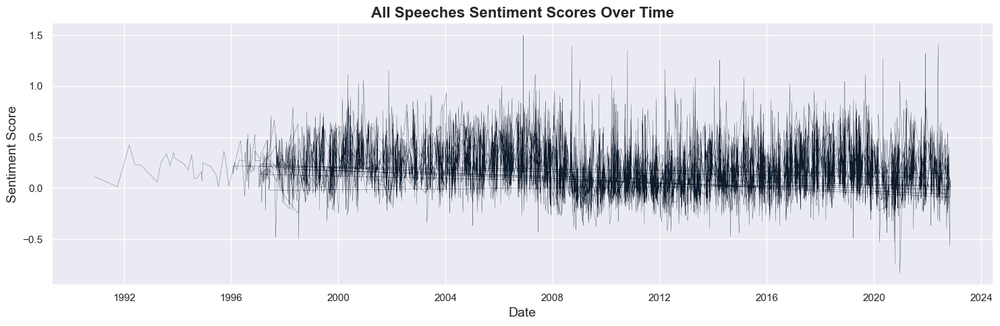

In [129]:
# Sentiment Score over time
plt.figure(figsize=(15, 5))
plt.plot(speeches_short['date_format'], speeches_short['sentiment_lexicon_weighted'], color='#0e1b2c', linewidth=0.2)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Sentiment Score', fontsize=14)
plt.title('All Speeches Sentiment Scores Over Time', fontsize=16, fontweight='bold')
plt.grid(True)
plt.tight_layout()
plt.show()

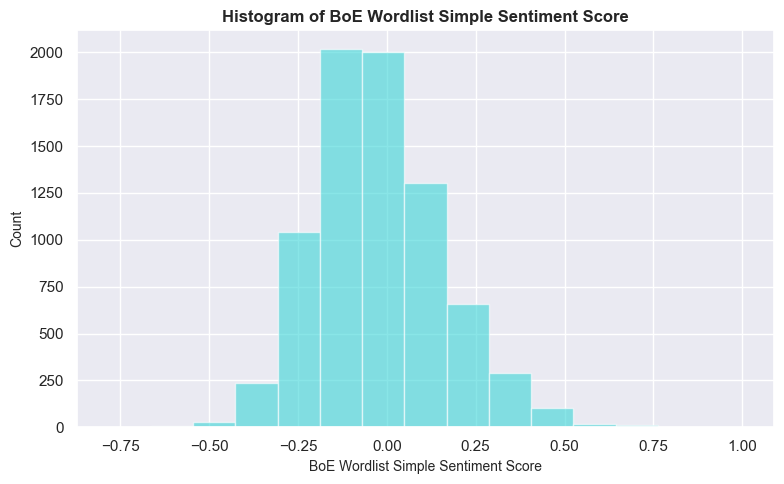

In [130]:
# Plot a histogram of the vader sentiment score for summary
# Set the number of bins.
num_bins = 15
# Set the plot area.
plt.figure(figsize=(8,5))

# Define the bars.
n, bins, patches = plt.hist(speeches_short['sentiment_lexicon_simple'], num_bins, facecolor='#3bd5d7', alpha=0.6)

# Set the labels.
plt.xlabel('BoE Wordlist Simple Sentiment Score', fontsize=10)
plt.ylabel('Count', fontsize=10)
plt.title('Histogram of BoE Wordlist Simple Sentiment Score', fontsize=12, fontweight='bold')

# Display the chart.
plt.tight_layout()
plt.show()

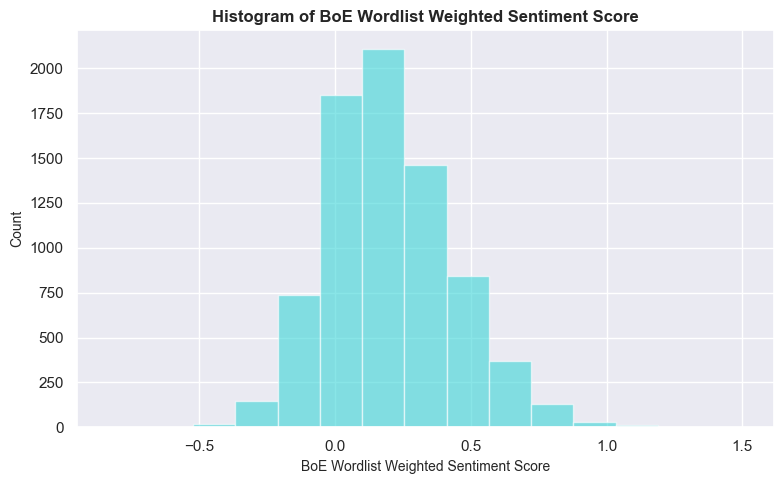

In [131]:
# Plot a histogram of the vader sentiment score for summary
# Set the number of bins.
num_bins = 15
# Set the plot area.
plt.figure(figsize=(8,5))

# Define the bars.
n, bins, patches = plt.hist(speeches_short['sentiment_lexicon_weighted'], num_bins, facecolor='#3bd5d7', alpha=0.6)

# Set the labels.
plt.xlabel('BoE Wordlist Weighted Sentiment Score', fontsize=10)
plt.ylabel('Count', fontsize=10)
plt.title('Histogram of BoE Wordlist Weighted Sentiment Score', fontsize=12, fontweight='bold')

# Display the chart.
plt.tight_layout()
plt.show()

In [132]:
# Group by 'country' and count the number of unique 'reference' values in each group.
speeches_country = speeches_short.groupby('country')['reference'].nunique().reset_index(name='number_speeches')

# Sort the DataFrame in descending order based on the 'num_speeches' column
speeches_country = speeches_country.sort_values(by='number_speeches', ascending=False)

# Reset the index after sorting to avoid potential issues
speeches_country = speeches_country.reset_index(drop=True)  # drop=True prevents the old index from becoming a column

# Calculate the total number of speeches
total_speeches = speeches_country['number_speeches'].sum()

# Create a DataFrame for the total row
total_row = pd.DataFrame([{'country': 'Total', 'number_speeches': total_speeches}])

# Concatenate the total row to the bottom of the DataFrame
speeches_country = pd.concat([speeches_country, total_row], ignore_index=True)

# View the results
speeches_country

,country,number_speeches
0,euro area,2351
1,united states,1551
2,united kingdom,1209
3,japan,755
4,canada,619
5,sweden,599
6,switzerland,351
7,australia,284
8,Total,7719


**3.2.b. BoE Speeches only**

In [134]:
# Bank OF England (UK) Speeches Only  
boe_speeches = speeches_short[speeches_short['country'].str.lower() == 'united kingdom'].copy()

# View the Dataframe
boe_speeches.head()

,reference,country,date_format,year_month,year,year_month_dt,title,author,is_gov,text,text_lemmatised,text_lemmatised_str,word_count_original,word_count_cleaned,sentiment_lexicon_simple,sentiment_lexicon_simple_std,sentiment_lexicon_weighted,sentiment_lexicon_weighted_std
4961,r980915a_BOE,united kingdom,1998-09-15,1998-09,1998,1998-09-01,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...","[thank, chairman, actually, pleased, opportuni...",thank chairman actually pleased opportunity re...,2387,1162,-0.143750,-0.670720,0.179375,-0.093041
4962,r981021b_BOE,united kingdom,1998-10-21,1998-10,1998,1998-10-01,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,"[great, pleasure, beautiful, city, bruges, hon...",great pleasure beautiful city bruges honour op...,4045,2108,0.028571,0.291375,0.291071,0.384988
4963,r981021a_BOE,united kingdom,1998-10-21,1998-10,1998,1998-10-01,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,"[industry, suffer, volatility, british, econom...",industry suffer volatility british economy pas...,2311,1240,-0.182353,-0.886246,0.020000,-0.775121
4964,r981101a_BOE,united kingdom,1998-11-01,1998-11,1998,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,"[topic, evening, use, forecast, economic, poli...",topic evening use forecast economic policy mak...,4690,2380,-0.125424,-0.568402,0.116271,-0.363107
4965,r981101b_BOE,united kingdom,1998-11-01,1998-11,1998,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...","[six, year, ago, week, sterling, leave, exchan...",six year ago week sterling leave exchange rate...,4452,2580,-0.157303,-0.746390,0.063764,-0.587823


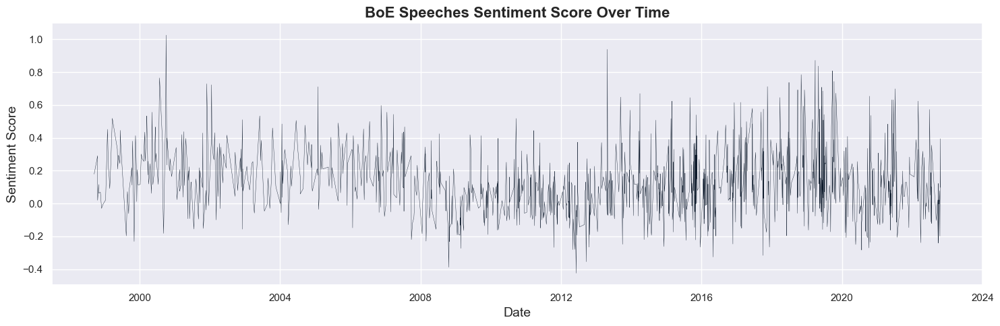

In [135]:
# Sentiment Score over time
plt.figure(figsize=(15, 5))
plt.plot(boe_speeches['date_format'], boe_speeches['sentiment_lexicon_weighted'], color='#0e1b2c', linewidth=0.3)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Sentiment Score', fontsize=14)
plt.title('BoE Speeches Sentiment Score Over Time', fontsize=16, fontweight='bold')
plt.grid(True)
plt.tight_layout()
plt.show()

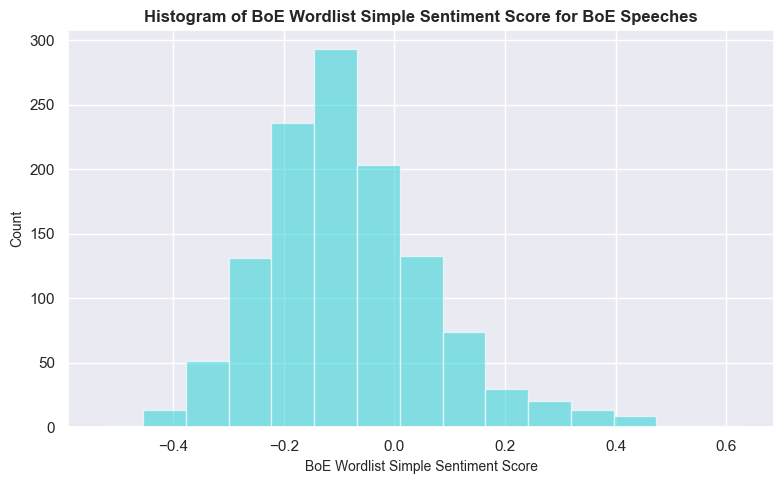

In [136]:
# Plot a histogram of the vader sentiment score for summary
# Set the number of bins.
num_bins = 15
# Set the plot area.
plt.figure(figsize=(8,5))

# Define the bars.
n, bins, patches = plt.hist(boe_speeches['sentiment_lexicon_simple'], num_bins, facecolor='#3bd5d7', alpha=0.6)

# Set the labels.
plt.xlabel('BoE Wordlist Simple Sentiment Score', fontsize=10)
plt.ylabel('Count', fontsize=10)
plt.title('Histogram of BoE Wordlist Simple Sentiment Score for BoE Speeches', fontsize=12, fontweight='bold')

# Display the chart.
plt.tight_layout()
plt.show()

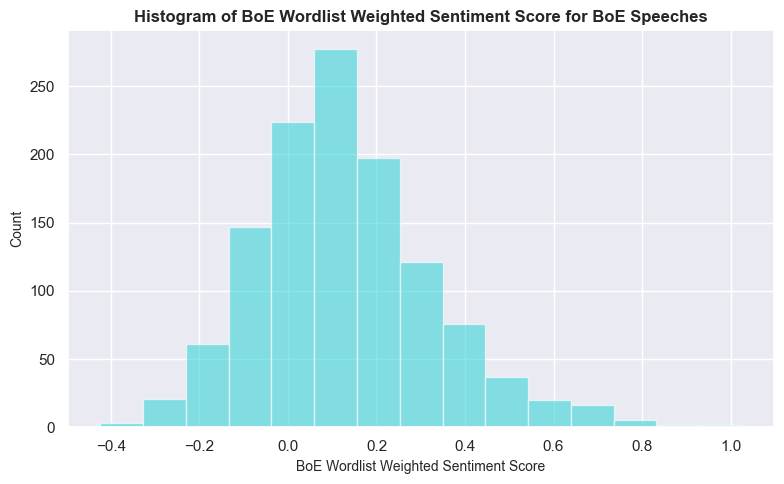

In [137]:
# Plot a histogram of the vader sentiment score for summary
# Set the number of bins.
num_bins = 15
# Set the plot area.
plt.figure(figsize=(8,5))

# Define the bars.
n, bins, patches = plt.hist(boe_speeches['sentiment_lexicon_weighted'], num_bins, facecolor='#3bd5d7', alpha=0.6)

# Set the labels.
plt.xlabel('BoE Wordlist Weighted Sentiment Score', fontsize=10)
plt.ylabel('Count', fontsize=10)
plt.title('Histogram of BoE Wordlist Weighted Sentiment Score for BoE Speeches', fontsize=12, fontweight='bold')

# Display the chart.
plt.tight_layout()
plt.show()

In [138]:
# Prepare indicator dataframe for merge
uk_economic_indicators_merge = uk_economic_indicators.drop(columns=['year', 'month'])

# View the DataFrame
uk_economic_indicators_merge

,year_month,uk_inflation_rate_CPIH,uk_unemployment_rate,uk_gdp_growth,uk_interest_rate,uk_consumer_confidence,gbp_usd_fx,ftse_250,gilts_short,gilts_medium,gilts_long,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types
0,1998-04,1.815,6.3,0.6,7.25,1.10,1.673270,5554.720972,5.910000,5.700000,5.710000,14.1,24.7,64258
1,1998-05,2.039,6.3,0.6,7.25,1.20,1.636589,5799.256322,5.820000,5.570000,5.550000,14.4,24.5,64258
2,1998-06,1.675,6.3,0.6,7.50,-1.30,1.650718,5739.277233,6.170000,5.640000,5.430000,13.9,25.5,64258
3,1998-07,1.443,6.3,0.3,7.50,-4.30,1.643657,5595.919582,6.060000,5.570000,5.380000,14.6,25.6,67057
4,1998-08,1.327,6.2,0.3,7.50,-6.50,1.631950,5173.355054,5.520000,5.190000,5.110000,14.6,26.1,67057
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
316,2024-08,2.216,4.3,0.0,5.00,-7.25,1.293286,20908.952720,3.843331,3.949251,4.480954,6.6,9.9,266225
317,2024-09,1.680,4.3,0.0,5.00,-15.50,1.321781,20841.357310,3.755558,3.895691,4.464948,6.6,9.5,266398
318,2024-10,2.281,4.4,0.1,5.00,-15.25,1.304578,20817.302486,4.040317,4.177002,4.703413,6.3,9.4,267358
319,2024-11,2.622,4.4,0.1,4.75,-13.00,1.274986,20517.825545,4.302807,4.430016,4.886294,6.0,8.0,267946


In [139]:
# List of DataFrames to merge
dataframes_to_merge = [uk_economic_indicators_merge]

# Use reduce to merge all DataFrames in the list
boe_speeches_indicators = reduce(lambda left, right: left.merge(right, on='year_month', how='left'), dataframes_to_merge, boe_speeches)

# View the merged DataFrame
boe_speeches_indicators.head()

,reference,country,date_format,year_month,year,year_month_dt,title,author,is_gov,text,...,uk_interest_rate,uk_consumer_confidence,gbp_usd_fx,ftse_250,gilts_short,gilts_medium,gilts_long,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types
0,r980915a_BOE,united kingdom,1998-09-15,1998-09,1998,1998-09-01,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",...,7.50,-4.9,1.682209,4657.921320,5.00,4.80,4.77,15.3,26.7,67057
1,r981021b_BOE,united kingdom,1998-10-21,1998-10,1998,1998-10-01,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,...,7.25,-6.7,1.695200,4516.211359,4.98,4.96,5.00,15.6,25.8,66757
2,r981021a_BOE,united kingdom,1998-10-21,1998-10,1998,1998-10-01,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,...,7.25,-6.7,1.695200,4516.211359,4.98,4.96,5.00,15.6,25.8,66757
3,r981101a_BOE,united kingdom,1998-11-01,1998-11,1998,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,...,6.75,-3.5,1.661986,4885.032366,4.71,4.59,4.60,14.9,26.9,66757
4,r981101b_BOE,united kingdom,1998-11-01,1998-11,1998,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",...,6.75,-3.5,1.661986,4885.032366,4.71,4.59,4.60,14.9,26.9,66757


In [140]:
# View the columns in the DataFrame
boe_speeches_indicators.columns

Index(['reference', 'country', 'date_format', 'year_month', 'year',
       'year_month_dt', 'title', 'author', 'is_gov', 'text', 'text_lemmatised',
       'text_lemmatised_str', 'word_count_original', 'word_count_cleaned',
       'sentiment_lexicon_simple', 'sentiment_lexicon_simple_std',
       'sentiment_lexicon_weighted', 'sentiment_lexicon_weighted_std',
       'uk_inflation_rate_CPIH', 'uk_unemployment_rate', 'uk_gdp_growth',
       'uk_interest_rate', 'uk_consumer_confidence', 'gbp_usd_fx', 'ftse_250',
       'gilts_short ', 'gilts_medium ', 'gilts_long ',
       'uk_credit_growth_no_cc', 'uk_credit_growth_only_cc',
       'avg_price_all_property_types'],
      dtype='object')

In [141]:
# Review the DataFrame
boe_speeches_indicators.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1209 entries, 0 to 1208
Data columns (total 31 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   reference                       1209 non-null   object        
 1   country                         1209 non-null   object        
 2   date_format                     1209 non-null   datetime64[ns]
 3   year_month                      1209 non-null   period[M]     
 4   year                            1209 non-null   int32         
 5   year_month_dt                   1209 non-null   datetime64[ns]
 6   title                           1209 non-null   object        
 7   author                          1209 non-null   object        
 8   is_gov                          1209 non-null   int64         
 9   text                            1209 non-null   object        
 10  text_lemmatised                 1209 non-null   object        
 11  text

**3.1.c. Timeframes**

Time scale selected based on introduction of the euro to make data comparable acorss countries.

In [144]:
# Create separate DataFrame to filter for 2000 to 2022
speeches_1999_2022 = speeches_short[(speeches_short['year'] >= 1999) & (speeches_short['year'] <= 2022)].reset_index()

# View the DataFrame
speeches_1999_2022

,index,reference,country,date_format,year_month,year,year_month_dt,title,author,is_gov,text,text_lemmatised,text_lemmatised_str,word_count_original,word_count_cleaned,sentiment_lexicon_simple,sentiment_lexicon_simple_std,sentiment_lexicon_weighted,sentiment_lexicon_weighted_std
0,55,r990311a_BOA,australia,1999-03-11,1999-03,1999,1999-03-01,,macfarlane,1,Last time I spoke to a group like this in Toky...,"[last, time, speak, group, like, tokyo, septem...",last time speak group like tokyo september 199...,2271,1163,-0.073394,-0.277915,0.192661,-0.036182
1,56,r990521a_BOA,australia,1999-05-21,1999-05,1999,1999-05-01,,macfarlane,1,It is a pleasure to be in Hong Kong talking to...,"[pleasure, hong, kong, talk, clsa, investor, f...",pleasure hong kong talk clsa investor forum co...,1944,992,0.115385,0.776065,0.479808,1.192727
2,57,r990617a_BOA,australia,1999-06-17,1999-06,1999,1999-06-01,,macfarlane,1,"Governor, in testimony to the House of was rel...","[governor, testimony, house, release, 6, may, ...",governor testimony house release 6 may 1999 th...,2787,1403,-0.065000,-0.231048,0.171000,-0.128884
3,58,r990729a_BOA,australia,1999-07-29,1999-07,1999,1999-07-01,,macfarlane,1,The following is the text of the R.C. Mills Me...,"[follow, text, r, c, mill, memorial, lecture, ...",follow text r c mill memorial lecture deliver ...,4521,2443,-0.097493,-0.412461,0.111421,-0.383867
4,59,r991027a_BOA,australia,1999-10-27,1999-10,1999,1999-10-01,,macfarlane,1,The following is the text of the Chris Higgins...,"[follow, text, chris, higgins, deliver, honour...",follow text chris higgins deliver honour invit...,2679,1398,0.143791,0.934661,0.467320,1.139284
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7375,7716,r221010a_FOMC,united states,2022-10-10,2022-10,2022,2022-10-01,Restoring Price Stability in an Uncertain Econ...,brainard,0,It is a pleasure to join this discussion today...,"[pleasure, join, discussion, today, inflation,...",pleasure join discussion today inflation high ...,1839,1132,-0.063492,-0.222629,0.143651,-0.245930
7376,7717,r221012b_FOMC,united states,2022-10-12,2022-10,2022,2022-10-01,Managing the Promise and Risk of Financial Inn...,barr,0,"Thank you, Chris, and thank you for the invita...","[thank, chris, thank, invitation, speak, today...",thank chris thank invitation speak today oppor...,1983,1157,0.111111,0.752205,0.322222,0.518305
7377,7718,r221012a_FOMC,united states,2022-10-12,2022-10,2022,2022-10-01,Forward Guidance as a Monetary Policy Tool: Co...,bowman,0,Thanks to the Money Marketeers for inviting me...,"[thanks, money, marketeers, invite, share, per...",thanks money marketeers invite share perspecti...,2964,1717,-0.074468,-0.283909,0.156915,-0.189164
7378,7719,r221014a_FOMC,united states,2022-10-14,2022-10,2022,2022-10-01,The U.S. Dollar and Central Bank Digital Curre...,waller,0,"Thank you, Professor Jackson, and thank you to...","[thank, professor, jackson, thank, invitation,...",thank professor jackson thank invitation speak...,2255,1260,0.086614,0.615435,0.339370,0.591693


In [145]:
# Create separate DataFrame to filter for 2000 to 2022 for BoE speeches only
boe_indicators_1999_2022 = boe_speeches_indicators[(boe_speeches_indicators['year'] >= 1999) & \
                                                    (boe_speeches_indicators['year'] <= 2022)].reset_index()

# View the DataFrame
boe_indicators_1999_2022

,index,reference,country,date_format,year_month,year,year_month_dt,title,author,is_gov,...,uk_interest_rate,uk_consumer_confidence,gbp_usd_fx,ftse_250,gilts_short,gilts_medium,gilts_long,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types
0,8,r990112a_BOE,united kingdom,1999-01-12,1999-01,1999,1999-01-01,Speech,george,1,...,6.00,-3.6,1.650910,4904.934033,4.300000,4.240000,4.320000,13.5,26.1,67157
1,9,r990118a_BOE,united kingdom,1999-01-18,1999-01,1999,1999-01-01,Speech,george,1,...,6.00,-3.6,1.650910,4904.934033,4.300000,4.240000,4.320000,13.5,26.1,67157
2,10,r990201a_BOE,united kingdom,1999-02-01,1999-02,1999,1999-02-01,Speech,george,1,...,5.50,-1.6,1.627565,5192.548511,4.450000,4.390000,4.420000,13.2,26.1,67157
3,11,r990210a_BOE,united kingdom,1999-02-10,1999-02,1999,1999-02-01,Speech,george,1,...,5.50,-1.6,1.627565,5192.548511,4.450000,4.390000,4.420000,13.2,26.1,67157
4,12,r990218a_BOE,united kingdom,1999-02-18,1999-02,1999,1999-02-01,The Chancellor's Lecture,george,1,...,5.50,-1.6,1.627565,5192.548511,4.450000,4.390000,4.420000,13.2,26.1,67157
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1196,1204,r221007a_BOE,united kingdom,2022-10-07,2022-10,2022,2022-10-01,"Shocks, inflation, and the policy response",ramsden,0,...,2.25,-41.0,1.130743,17442.702079,4.039021,3.959858,4.129311,5.1,11.5,265693
1197,1205,r221012a_BOE,united kingdom,2022-10-12,2022-10,2022,2022-10-01,Monetary policy: an anchor in challenging times,pill,0,...,2.25,-41.0,1.130743,17442.702079,4.039021,3.959858,4.129311,5.1,11.5,265693
1198,1206,r221015a_BOE,united kingdom,2022-10-15,2022-10,2022,2022-10-01,Monetary policy and financial stability interv...,bailey,1,...,2.25,-41.0,1.130743,17442.702079,4.039021,3.959858,4.129311,5.1,11.5,265693
1199,1207,r221019a_BOE,united kingdom,2022-10-19,2022-10,2022,2022-10-01,"Governance of “Decentralised” Finance: Get up,...",wilkins,0,...,2.25,-41.0,1.130743,17442.702079,4.039021,3.959858,4.129311,5.1,11.5,265693


In [146]:
boe_indicators_1999_2022.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1201 entries, 0 to 1200
Data columns (total 32 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   index                           1201 non-null   int64         
 1   reference                       1201 non-null   object        
 2   country                         1201 non-null   object        
 3   date_format                     1201 non-null   datetime64[ns]
 4   year_month                      1201 non-null   period[M]     
 5   year                            1201 non-null   int32         
 6   year_month_dt                   1201 non-null   datetime64[ns]
 7   title                           1201 non-null   object        
 8   author                          1201 non-null   object        
 9   is_gov                          1201 non-null   int64         
 10  text                            1201 non-null   object        
 11  text

### 3.1. Country comparison

In [148]:
# Check columns in the DataFrame
speeches_short.columns

Index(['reference', 'country', 'date_format', 'year_month', 'year',
       'year_month_dt', 'title', 'author', 'is_gov', 'text', 'text_lemmatised',
       'text_lemmatised_str', 'word_count_original', 'word_count_cleaned',
       'sentiment_lexicon_simple', 'sentiment_lexicon_simple_std',
       'sentiment_lexicon_weighted', 'sentiment_lexicon_weighted_std'],
      dtype='object')

In [149]:
# View the countries
speeches_short['country'].unique()

array(['australia', 'canada', 'euro area', 'japan', 'sweden',
       'switzerland', 'united kingdom', 'united states'], dtype=object)

In [150]:
# Group average sentiment data by year
speeches_yearly = speeches_short.groupby(['year', 'country'])[['sentiment_lexicon_simple', 'sentiment_lexicon_simple_std', \
                                                         'sentiment_lexicon_weighted', 'sentiment_lexicon_weighted_std'\
                                                        ]].mean().reset_index()

# View the DataFrame
speeches_yearly.head()

,year,country,sentiment_lexicon_simple,sentiment_lexicon_simple_std,sentiment_lexicon_weighted,sentiment_lexicon_weighted_std
0,1990,australia,-0.119816,-0.537091,0.112442,-0.379494
1,1991,australia,-0.167785,-0.804912,0.014094,-0.800397
2,1992,australia,0.017739,0.230895,0.292015,0.389025
3,1993,australia,-0.012194,0.063773,0.252628,0.220463
4,1994,australia,-0.052324,-0.160276,0.178494,-0.096809


In [151]:
# Review the DataFrame
speeches_yearly.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 215 entries, 0 to 214
Data columns (total 6 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   year                            215 non-null    int32  
 1   country                         215 non-null    object 
 2   sentiment_lexicon_simple        215 non-null    float64
 3   sentiment_lexicon_simple_std    215 non-null    float64
 4   sentiment_lexicon_weighted      215 non-null    float64
 5   sentiment_lexicon_weighted_std  215 non-null    float64
dtypes: float64(4), int32(1), object(1)
memory usage: 9.4+ KB


In [152]:
# Group average sentiment data for 1999 to 2022
speeches_1999_2022_yearly = speeches_1999_2022.groupby(['year', 'country'])[['sentiment_lexicon_simple', \
                                                                            'sentiment_lexicon_simple_std', \
                                                                            'sentiment_lexicon_weighted', \
                                                                            'sentiment_lexicon_weighted_std'\
                                                                           ]].mean().reset_index()

# View the DataFrame
speeches_1999_2022_yearly.head()

,year,country,sentiment_lexicon_simple,sentiment_lexicon_simple_std,sentiment_lexicon_weighted,sentiment_lexicon_weighted_std
0,1999,australia,-0.064206,-0.226613,0.196030,-0.021763
1,1999,canada,0.033602,0.319458,0.309715,0.464776
2,1999,euro area,0.128988,0.852015,0.402779,0.863068
3,1999,japan,-0.082874,-0.330839,0.134954,-0.283151
4,1999,sweden,-0.056931,-0.185997,0.185153,-0.068313


In [153]:
speeches_1999_2022_yearly.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 192 entries, 0 to 191
Data columns (total 6 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   year                            192 non-null    int32  
 1   country                         192 non-null    object 
 2   sentiment_lexicon_simple        192 non-null    float64
 3   sentiment_lexicon_simple_std    192 non-null    float64
 4   sentiment_lexicon_weighted      192 non-null    float64
 5   sentiment_lexicon_weighted_std  192 non-null    float64
dtypes: float64(4), int32(1), object(1)
memory usage: 8.4+ KB


In [154]:
# Group average sentiment data by year
boe_speeches_yearly = boe_speeches_indicators.groupby(['year'])[['sentiment_lexicon_simple', 'sentiment_lexicon_simple_std', \
                                                                 'sentiment_lexicon_weighted', 'sentiment_lexicon_weighted_std', \
                                                                 'uk_inflation_rate_CPIH', 'uk_unemployment_rate', 'uk_gdp_growth', \
                                                                 'uk_interest_rate', 'uk_consumer_confidence', 'gbp_usd_fx',  \
                                                                 'ftse_250', 'gilts_short ', 'gilts_medium ', 'gilts_long ', \
                                                                 'uk_credit_growth_no_cc', 'uk_credit_growth_only_cc', \
                                                                 'avg_price_all_property_types']].mean().reset_index()

# View the DataFrame
boe_speeches_yearly.head()

,year,sentiment_lexicon_simple,sentiment_lexicon_simple_std,sentiment_lexicon_weighted,sentiment_lexicon_weighted_std,uk_inflation_rate_CPIH,uk_unemployment_rate,uk_gdp_growth,uk_interest_rate,uk_consumer_confidence,gbp_usd_fx,ftse_250,gilts_short,gilts_medium,gilts_long,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types
0,1998,-0.149342,-0.701943,0.088097,-0.483684,1.412375,6.1625,0.650000,6.843750,-4.675000,1.674952,4733.667270,4.736250,4.636250,4.661250,14.925000,26.400000,66794.500000
1,1999,-0.051135,-0.153640,0.185937,-0.064958,1.294533,5.9800,1.006667,5.358333,0.156667,1.622406,5716.781754,5.326333,4.992667,4.592333,12.860000,23.380000,71727.166667
2,2000,0.037997,0.343998,0.308585,0.459943,0.784556,5.5000,0.830556,5.979167,-0.388889,1.529136,6501.639693,5.901389,5.305000,4.497778,11.297222,21.158333,81757.027778
3,2001,-0.087290,-0.355498,0.148234,-0.226316,1.219525,5.0750,0.520000,5.081250,0.140000,1.441217,6102.856224,5.014250,4.890250,4.604750,10.162500,18.155000,89094.600000
4,2002,-0.030069,-0.036025,0.236919,0.153231,1.379433,5.1500,0.546667,4.000000,1.103333,1.492741,5368.412391,4.844000,4.879000,4.696000,13.903333,18.436667,102983.866667


In [266]:
# Group average sentiment data by year
boe_speeches_1999_2022_yearly = boe_indicators_1999_2022.groupby(['year'])[['sentiment_lexicon_simple', 'sentiment_lexicon_simple_std', \
                                                                 'sentiment_lexicon_weighted', 'sentiment_lexicon_weighted_std', \
                                                                 'uk_inflation_rate_CPIH', 'uk_unemployment_rate', 'uk_gdp_growth', \
                                                                 'uk_interest_rate', 'uk_consumer_confidence', 'gbp_usd_fx',  \
                                                                 'ftse_250', 'gilts_short ', 'gilts_medium ', 'gilts_long ', \
                                                                 'uk_credit_growth_no_cc', 'uk_credit_growth_only_cc', \
                                                                 'avg_price_all_property_types']].mean().reset_index()

# View the DataFrame
boe_speeches_1999_2022_yearly.head()

,year,sentiment_lexicon_simple,sentiment_lexicon_simple_std,sentiment_lexicon_weighted,sentiment_lexicon_weighted_std,uk_inflation_rate_CPIH,uk_unemployment_rate,uk_gdp_growth,uk_interest_rate,uk_consumer_confidence,gbp_usd_fx,ftse_250,gilts_short,gilts_medium,gilts_long,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types
0,1999,-0.051135,-0.153640,0.185937,-0.064958,1.294533,5.980000,1.006667,5.358333,0.156667,1.622406,5716.781754,5.326333,4.992667,4.592333,12.860000,23.380000,71727.166667
1,2000,0.037997,0.343998,0.308585,0.459943,0.784556,5.500000,0.830556,5.979167,-0.388889,1.529136,6501.639693,5.901389,5.305000,4.497778,11.297222,21.158333,81757.027778
2,2001,-0.087290,-0.355498,0.148234,-0.226316,1.219525,5.075000,0.520000,5.081250,0.140000,1.441217,6102.856224,5.014250,4.890250,4.604750,10.162500,18.155000,89094.600000
3,2002,-0.030069,-0.036025,0.236919,0.153231,1.379433,5.150000,0.546667,4.000000,1.103333,1.492741,5368.412391,4.844000,4.879000,4.696000,13.903333,18.436667,102983.866667
4,2003,-0.070092,-0.259477,0.163706,-0.160098,1.371211,5.042105,0.805263,3.697368,-5.457895,1.626196,4854.418901,4.171186,4.456977,4.579004,12.215789,20.236842,119253.421053


In [267]:
# View the data types
boe_speeches_1999_2022_yearly.dtypes

year                                int32
sentiment_lexicon_simple          float64
sentiment_lexicon_simple_std      float64
sentiment_lexicon_weighted        float64
sentiment_lexicon_weighted_std    float64
uk_inflation_rate_CPIH            float64
uk_unemployment_rate              float64
uk_gdp_growth                     float64
uk_interest_rate                  float64
uk_consumer_confidence            float64
gbp_usd_fx                        float64
ftse_250                          float64
gilts_short                       float64
gilts_medium                      float64
gilts_long                        float64
uk_credit_growth_no_cc            float64
uk_credit_growth_only_cc          float64
avg_price_all_property_types      float64
dtype: object

In [157]:
# List of countries to display
countries_to_display = ['united kingdom', 'united states', 'euro area', 'japan']

# Only UK to display
country_to_display = ['united kingdom']

# Dates to incude
events = [(2003, 'BoE Inflation Target'), (2008, 'Global Financial Crisis'), (2016, 'Brexit Referendum'), \
            (2020, 'Covid Pandemic')]

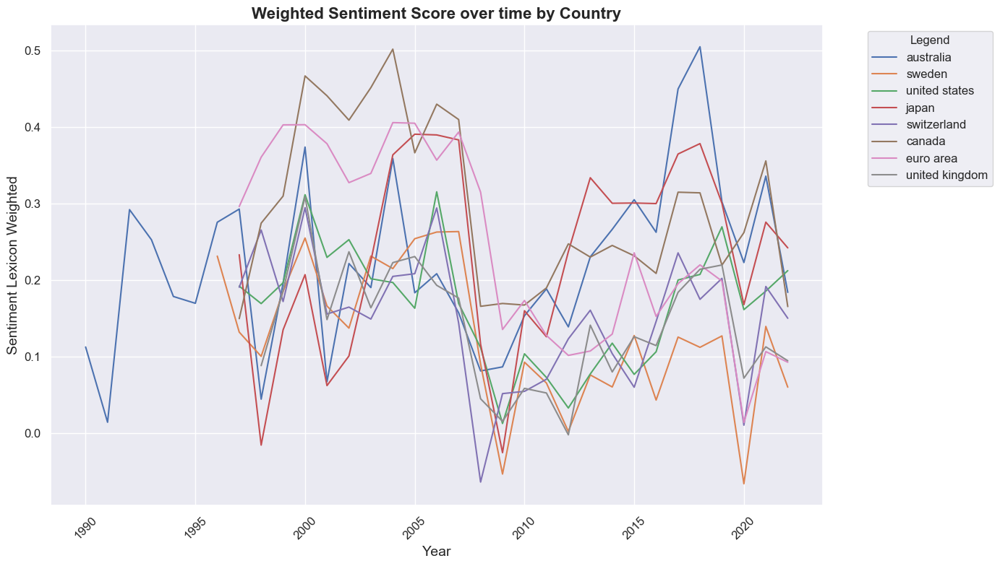

In [158]:
generate_multi_lineplot(speeches_yearly, x_axis='year', y_axis='sentiment_lexicon_weighted', hue='country', \
                        title= 'Weighted Sentiment Score over time by Country', date=None, ylim=None, \
                            save_path=None, errorbar=None, events=None)

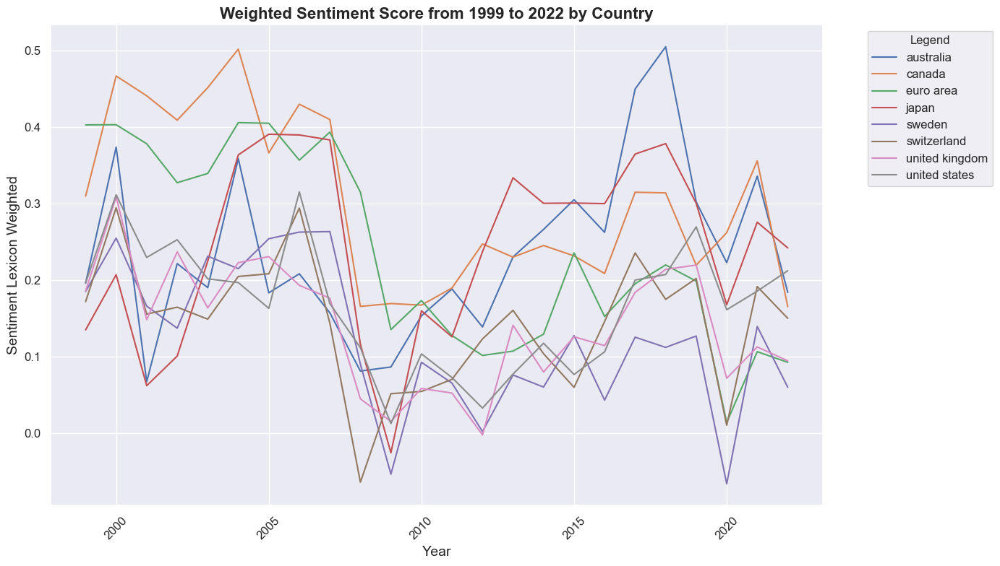

In [159]:
generate_multi_lineplot(speeches_1999_2022_yearly, x_axis='year', y_axis='sentiment_lexicon_weighted', hue='country', \
                        title= 'Weighted Sentiment Score from 1999 to 2022 by Country', date=None, ylim=None, \
                            save_path=None, errorbar=None, events=None)

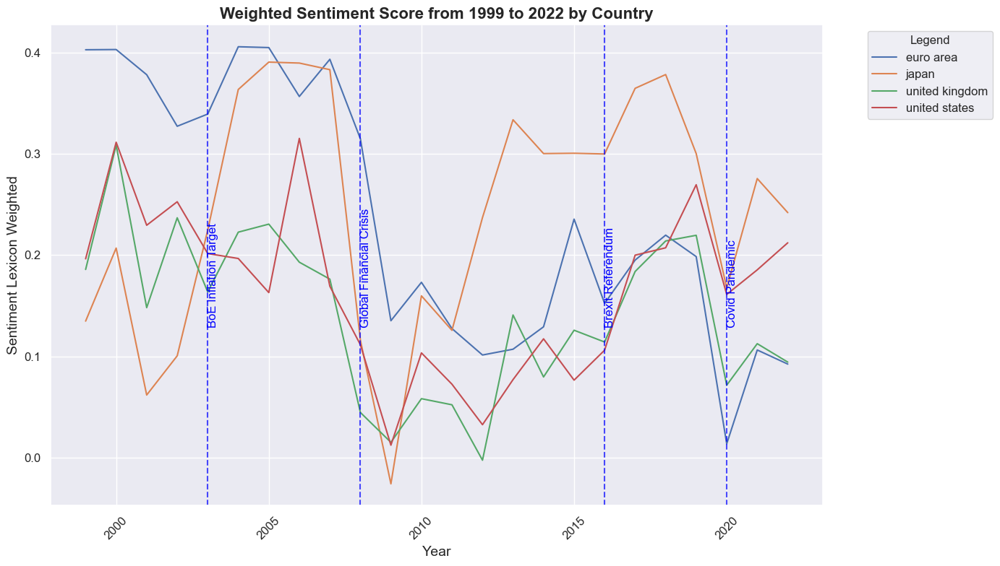

In [160]:
generate_multi_lineplot(speeches_1999_2022_yearly[speeches_1999_2022_yearly['country'].isin(countries_to_display)], \
                        x_axis='year', y_axis='sentiment_lexicon_weighted', hue='country', \
                        title= 'Weighted Sentiment Score from 1999 to 2022 by Country', date=None, ylim=None, \
                            save_path=None, errorbar=None, events=None, event_years=events)

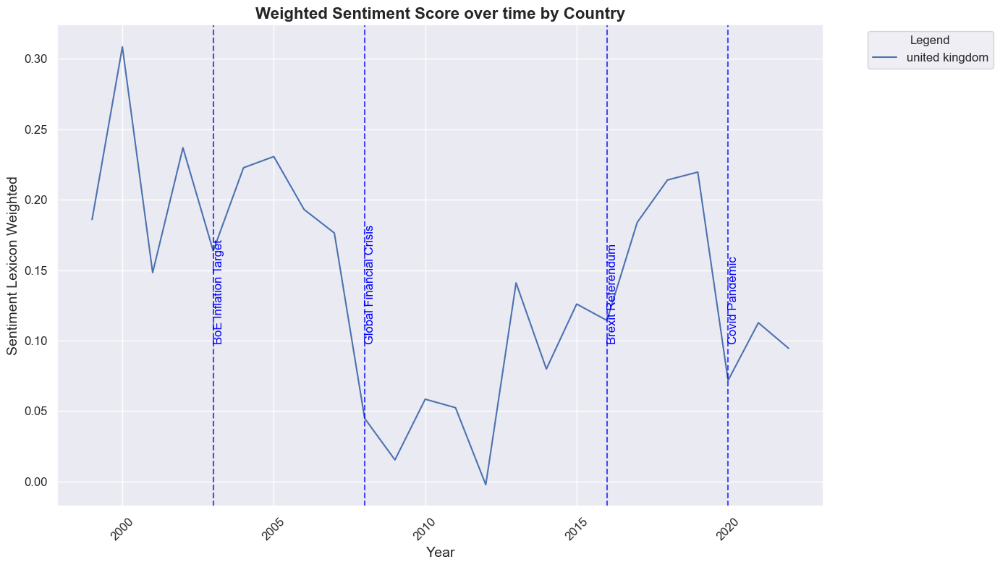

In [161]:
generate_multi_lineplot(speeches_1999_2022_yearly[speeches_1999_2022_yearly['country'].isin(country_to_display)], \
                        x_axis='year', y_axis='sentiment_lexicon_weighted', hue='country', \
                        title= 'Weighted Sentiment Score over time by Country', date=None, ylim=None, \
                            save_path=None, errorbar=None, events=None, event_years=events)

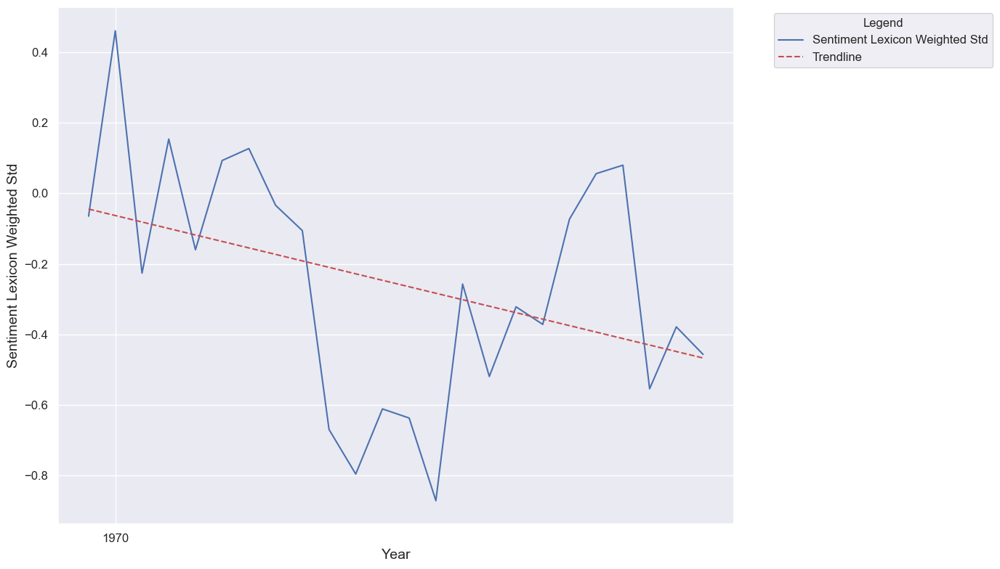

In [162]:
generate_lineplot_with_trendline(boe_speeches_1999_2022_yearly, x_axis='year', y_axis='sentiment_lexicon_weighted_std', \
                                 title=None, date=None, ylim=None, rotate_xticks=False, save_path=None, errorbar=None)

### 3.2. View BoE data in a wordclouds 

In [164]:
def show_wordcloud(counter):
    # Generate and display the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(counter)
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def plot_top_non_stopwords_wordcloud(text):
    stop = set(stopwords.words('english'))
    
    new = text.str.split()
    new = new.values.tolist()
    corpus = [word for i in new for word in i]

    counter = Counter(corpus)
    # Show the word cloud
    show_wordcloud(counter)

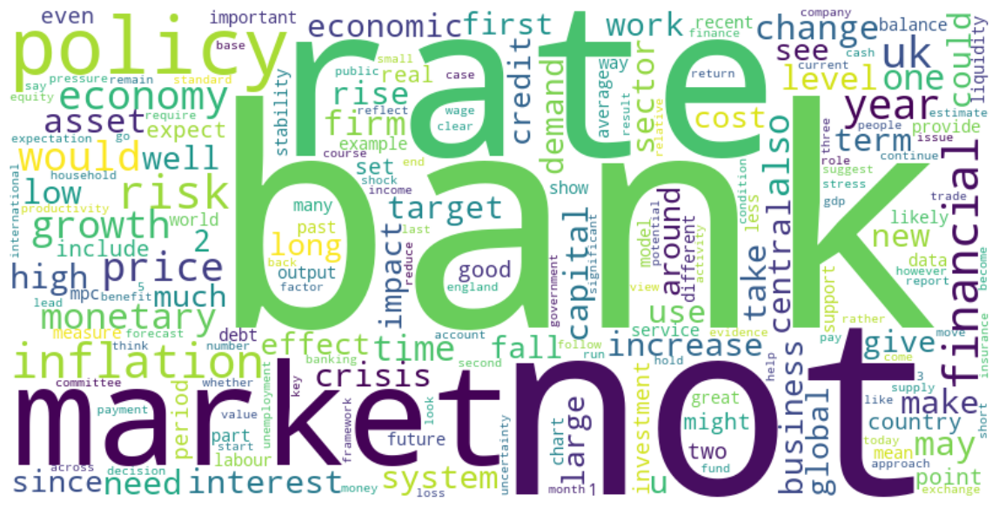

In [165]:
# Create wordcloud of lemmatised text
plot_top_non_stopwords_wordcloud(boe_speeches['text_lemmatised_str'])

In [166]:
# Define bar chart for top words
def top_words_barchart(text):
    stop=set(stopwords.words('english'))
    
    new= text.str.split()
    new=new.values.tolist()
    corpus=[word for i in new for word in i]

    counter=Counter(corpus)
    most=counter.most_common()
    x, y=[], []
    for word,count in most[:40]:
        if (word not in stop):
            x.append(word)
            y.append(count)
            
    # Set plot size
    plt.figure(figsize=(12, 8))
    
    # Plot
    sns.barplot(x=y, y=x)
    
    # Set label font sizes
    plt.xlabel('Count', fontsize=14)
    plt.ylabel('Words', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    
    plt.title('Top Non-Stopword Words', fontsize=16)
    plt.tight_layout()
    plt.show()

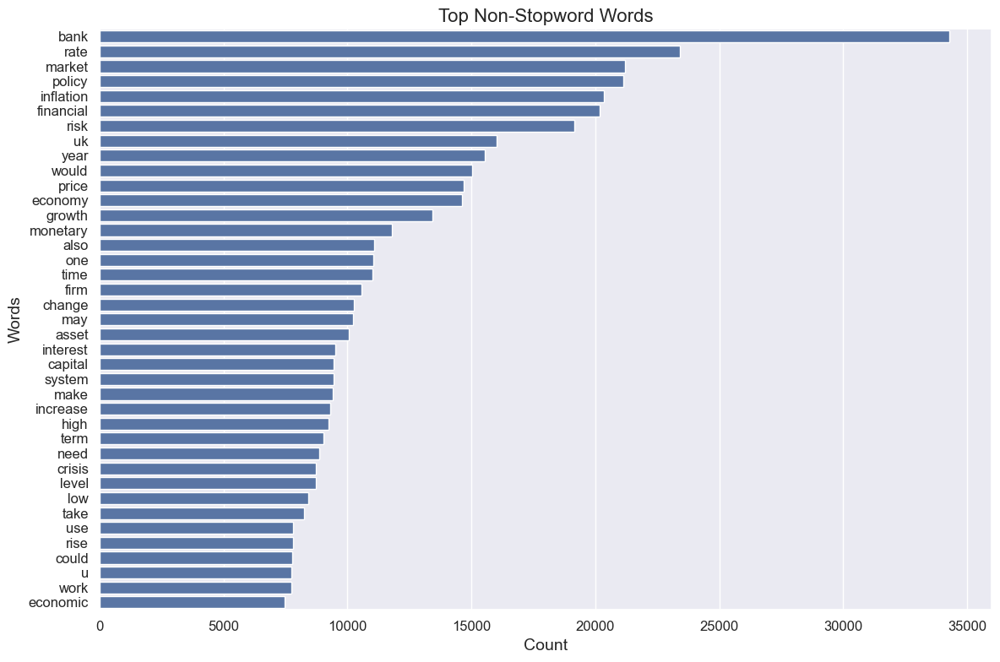

In [167]:
# Create bar chart to show top words
top_words_barchart(boe_speeches['text_lemmatised_str'])

In [500]:
def top_word_group_barchart(text, n=2):
    stop=set(stopwords.words('english'))

    new= text.str.split()
    new=new.values.tolist()
    corpus=[word for i in new for word in i]

    def _get_top_ngram(corpus, n=None):
        vec = CountVectorizer(ngram_range=(n, n)).fit(corpus)
        bag_of_words = vec.transform(corpus)
        sum_words = bag_of_words.sum(axis=0) 
        words_freq = [(word, sum_words[0, idx]) 
                      for word, idx in vec.vocabulary_.items()]
        words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
        return words_freq[:10]

    top_n_bigrams=_get_top_ngram(text,n)[:10]
    x,y=map(list,zip(*top_n_bigrams))
    sns.barplot(x=y, y=x)
    
    # Increase y-axis text size
    plt.yticks(fontsize=12)
    plt.show()

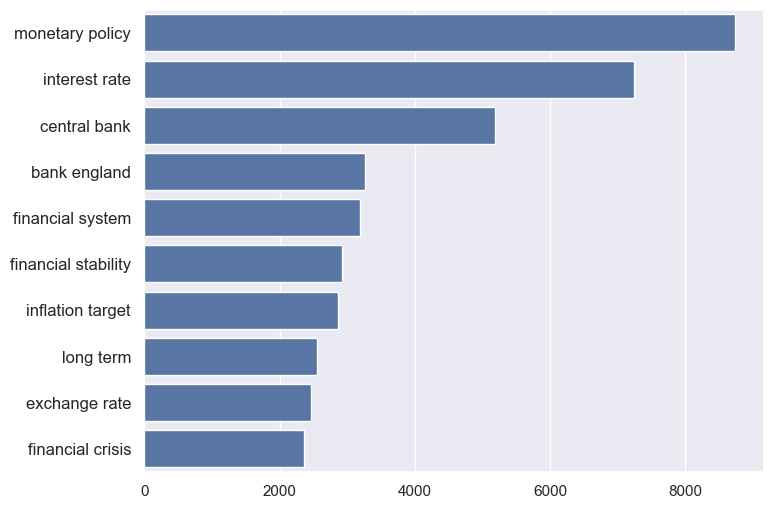

In [502]:
# Plot top phrases with 2 words
top_word_group_barchart(boe_indicators_1999_2022['text_lemmatised_str'],2)

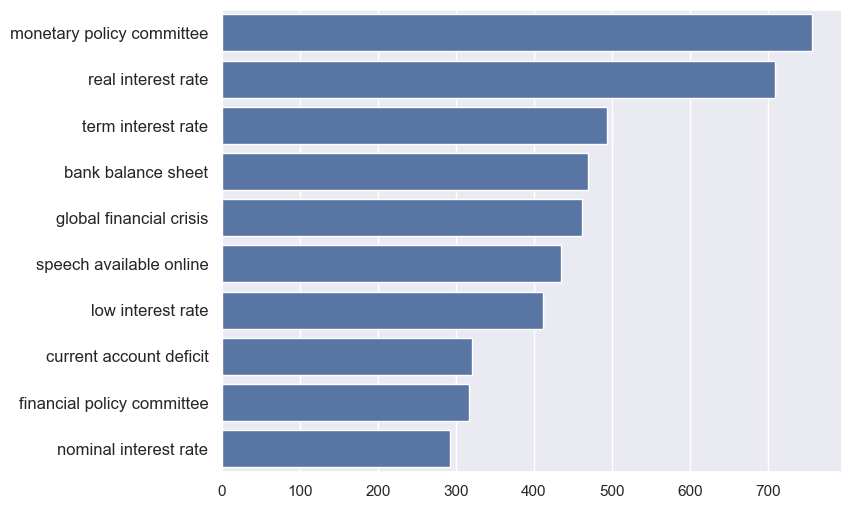

In [503]:
# Plot top phrases with 3 words
top_word_group_barchart(boe_indicators_1999_2022['text_lemmatised_str'],3)

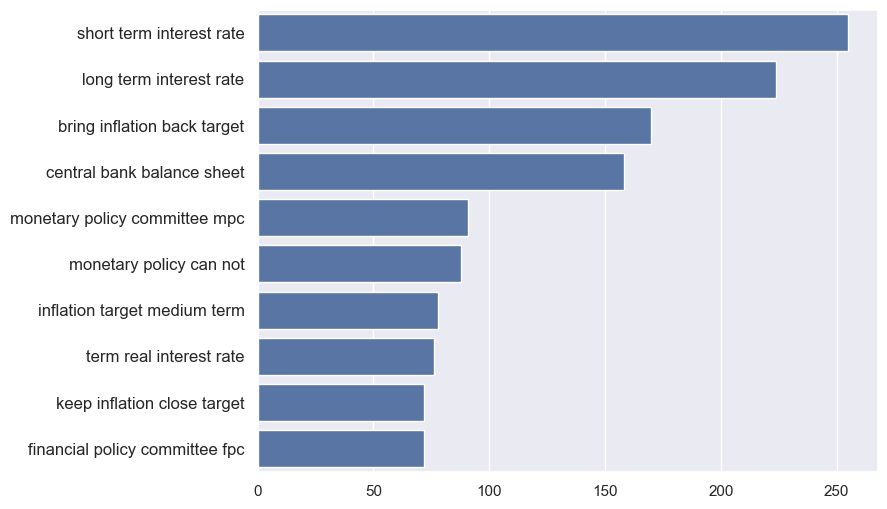

In [504]:
# Plot top phrases with 4 words
top_word_group_barchart(boe_indicators_1999_2022['text_lemmatised_str'],4)

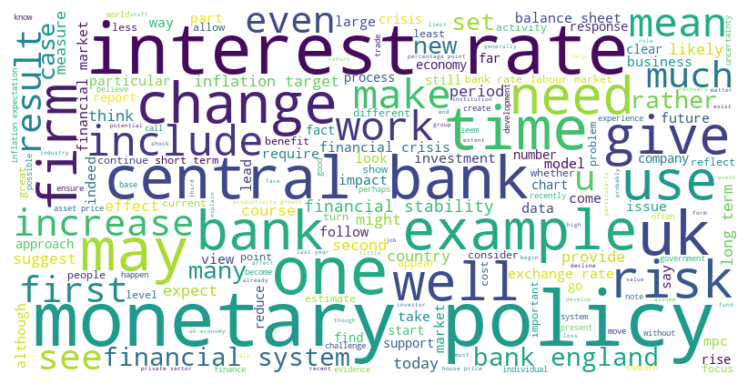

In [172]:
# Convert tokens into a single string.
boe_speeches_text = ' '.join(boe_indicators_1999_2022['text_lemmatised_str'])

# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white', random_state=42).generate(boe_speeches_text)

# Display the word cloud
plt.figure(figsize=(8, 4))
plt.imshow(wordcloud, interpolation='bilinear')

# Hide the axis.
plt.axis('off') 

# Dispaly the word cloud.
plt.tight_layout()
plt.show()

**View data for before and after 2010**

In [174]:
# Create separate DataFrames to filter for 1999 to 2009 and 2010 to 2022
boe_1999_2009 = boe_indicators_1999_2022[(boe_indicators_1999_2022['year'] >= 1999) & (boe_indicators_1999_2022['year'] <= 2009)].reset_index()
boe_2010_2022 = boe_indicators_1999_2022[(boe_indicators_1999_2022['year'] >= 2010) & (boe_indicators_1999_2022['year'] <= 2022)].reset_index()

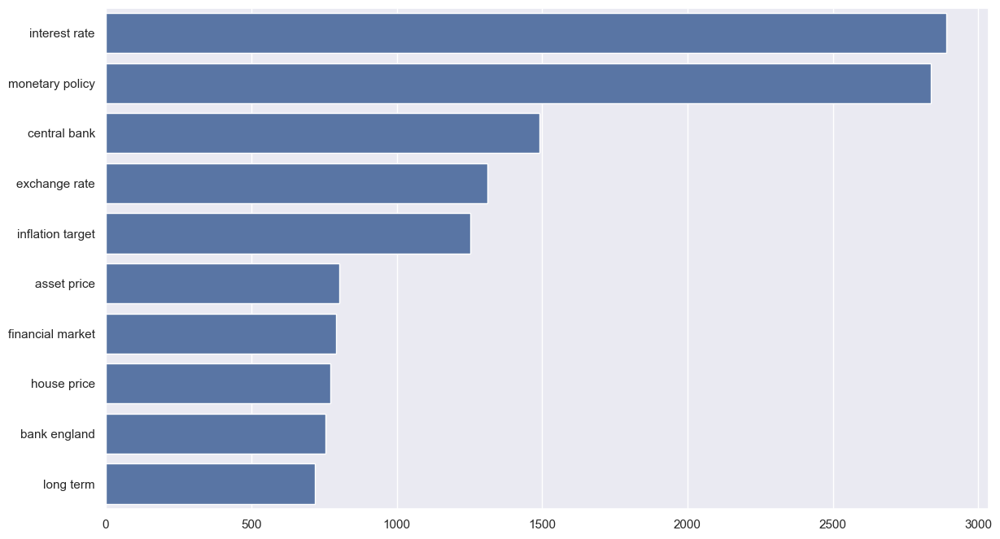

In [175]:
# Plot top phrases with 2 words
top_word_group_barchart(boe_1999_2009['text_lemmatised_str'],2)

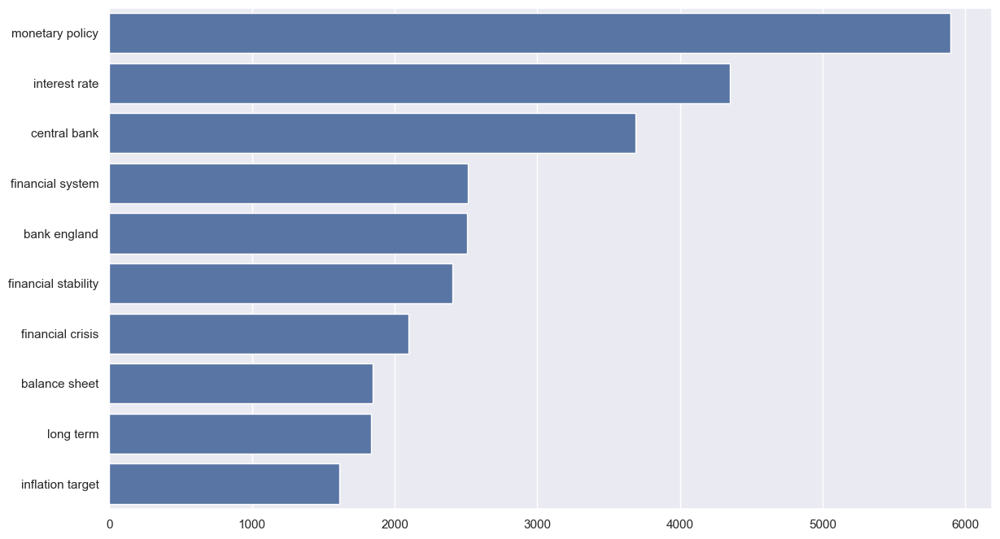

In [176]:
# Plot top phrases with 2 words
top_word_group_barchart(boe_2010_2022['text_lemmatised_str'],2)

### 3.3. BoE Speech Statistics

**3.3.a. Word Count per Year**

In [179]:
# Group and aggregate sentiment scores by month
wordcount_monthly = boe_indicators_1999_2022.groupby('year_month_dt').agg({'word_count_original': 'mean',
                                                                       'word_count_cleaned': 'mean',
                                                                       'reference': 'count'
                                                                      }).reset_index().rename(columns={'reference': 'speech_count'})
# View the DataFrame
wordcount_monthly.head()

,year_month_dt,word_count_original,word_count_cleaned,speech_count
0,1999-01-01,2492.000000,1274.500000,2
1,1999-02-01,2583.750000,1335.000000,4
2,1999-03-01,4021.500000,2166.500000,2
3,1999-05-01,3686.800000,2012.400000,5
4,1999-06-01,2086.333333,1087.333333,3


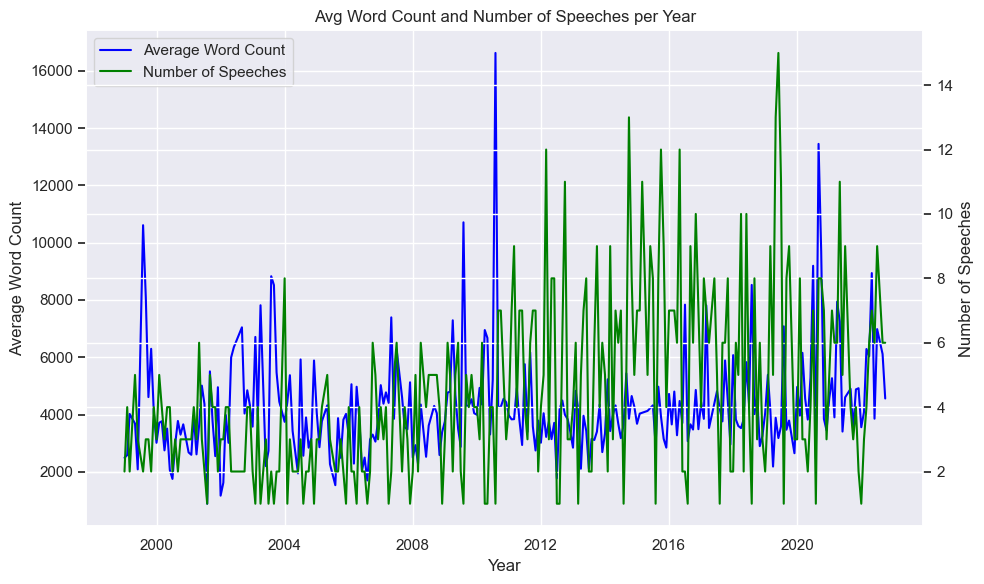

In [180]:
# Create the main plot
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot 'word_count' on the primary y-axis
ax1.plot(wordcount_monthly['year_month_dt'], wordcount_monthly['word_count_original'], color='blue', label='Average Word Count')
ax1.set_xlabel('Year')
ax1.set_ylabel('Average Word Count')
ax1.tick_params(axis='y')

# Create a secondary y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot 'speech_count' on the secondary y-axis
ax2.plot(wordcount_monthly['year_month_dt'], wordcount_monthly['speech_count'], color='green', label='Number of Speeches')
ax2.set_ylabel('Number of Speeches')
ax2.tick_params(axis='y')

# Add titles and grid if needed
plt.title('Avg Word Count and Number of Speeches per Year')

# Optionally, add a legend
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper left')

# Display the plot
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [181]:
# Group and aggregate sentiment scores by year
wordcount_yearly = boe_indicators_1999_2022.groupby('year').agg({'word_count_original': 'mean',
                                                                 'word_count_cleaned': 'mean',
                                                                 'reference': 'count'
                                                                }).reset_index().rename(columns={'reference': 'speech_count'})

# View the DataFrame
wordcount_yearly.head()

,year,word_count_original,word_count_cleaned,speech_count
0,1999,4543.966667,2514.633333,30
1,2000,3168.472222,1707.055556,36
2,2001,3716.375000,2049.550000,40
3,2002,3996.500000,2184.500000,30
4,2003,4854.000000,2679.684211,19


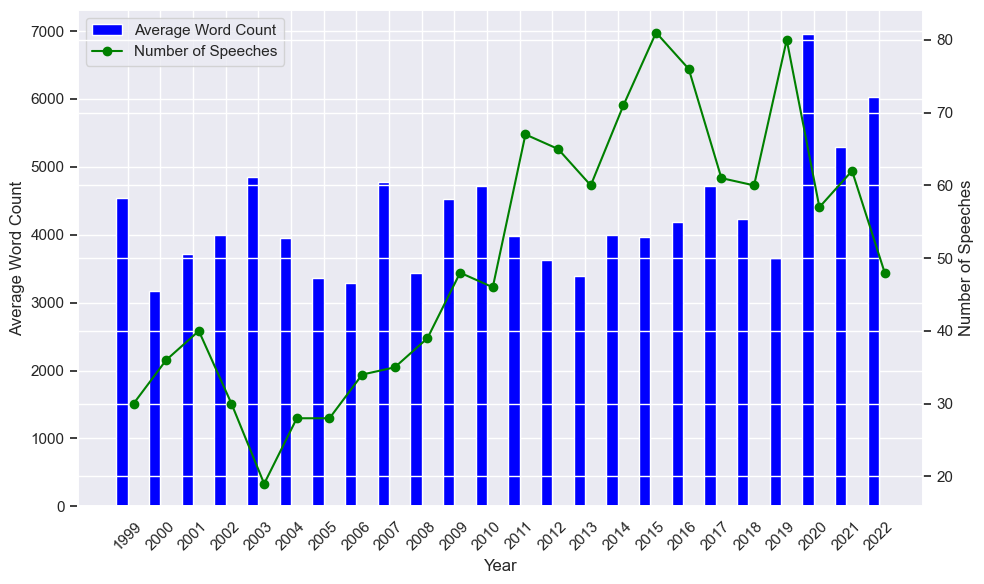

In [182]:
years = wordcount_yearly['year']
n_years = len(years)
x = np.arange(n_years)
width = 0.35

fig, ax1 = plt.subplots(figsize=(10, 6))

# Bar plot for 'word_count_text'
ax1.bar(x - width/2, wordcount_yearly['word_count_original'], width, color='blue', label='Average Word Count')
ax1.set_xlabel('Year')
ax1.set_ylabel('Average Word Count')
ax1.set_xticks(x)
ax1.set_xticklabels(years, rotation=45)

# Create the secondary axis
ax2 = ax1.twinx()

# Line plot for 'speech_count' without log scale
ax2.plot(x + width/2, wordcount_yearly['speech_count'], color='green', marker='o', label='Number of Speeches')

ax2.set_ylabel('Number of Speeches')

# Combine legends
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper left')

plt.tight_layout()
plt.show()

**3.3.b. Speeches by Govenor and Non-Govenor**

In [184]:
# Group and aggregate number of speeches by governor by year
boe_indicators_1999_2022_gov_yearly = boe_indicators_1999_2022.groupby(['year', 'is_gov']).size().reset_index(name='count')

# View the DataFrame
boe_indicators_1999_2022_gov_yearly.head()

,year,is_gov,count
0,1999,0,14
1,1999,1,16
2,2000,0,19
3,2000,1,17
4,2001,0,27


In [185]:
# Pivot the data for plotting
boe_indicators_1999_2022_gov_yearly_pivot = boe_indicators_1999_2022_gov_yearly.pivot(index='year', \
                                                                                      columns='is_gov', values='count').fillna(0)

# View the DataFrame
boe_indicators_1999_2022_gov_yearly_pivot.head()

is_gov,0,1
year,,
1999,14,16
2000,19,17
2001,27,13
2002,14,16
2003,14,5


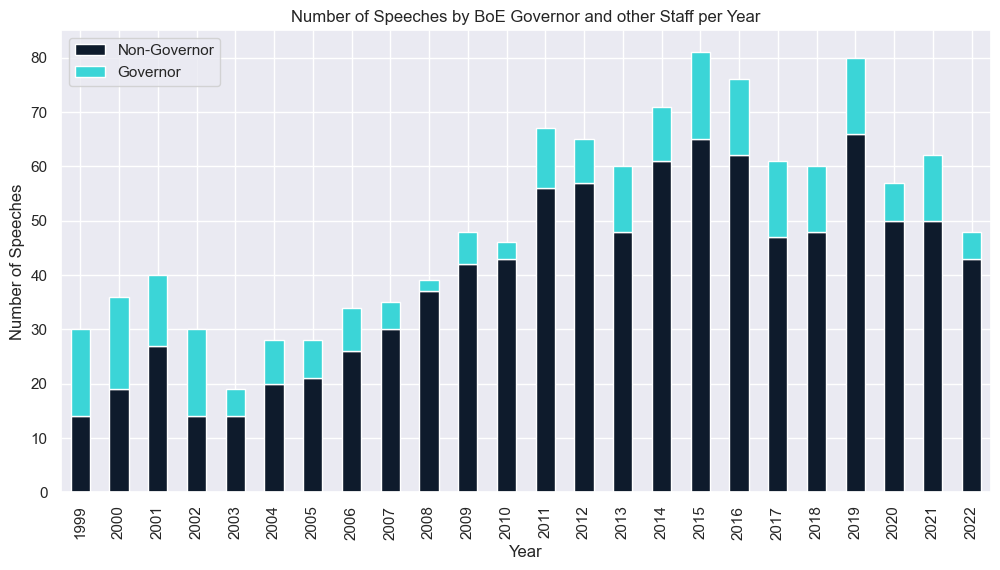

In [186]:
# Plot a bar chart per month
ax = boe_indicators_1999_2022_gov_yearly_pivot.plot(kind='bar', stacked=True, figsize=(12, 6), color=('#0e1b2c','#3bd5d7'))

# Customize plot
ax.set_xlabel('Year')
ax.set_ylabel('Number of Speeches')
ax.set_title('Number of Speeches by BoE Governor and other Staff per Year')

# Get current legend handles and labels
handles, labels = ax.get_legend_handles_labels()

# Replace '0' and '1' in labels with desired labels
labels = ['Non-Governor' if lbl == '0' else 'Governor' for lbl in labels]

# Set the legend with updated labels
ax.legend(handles, labels)

# Display the plot
plt.show()

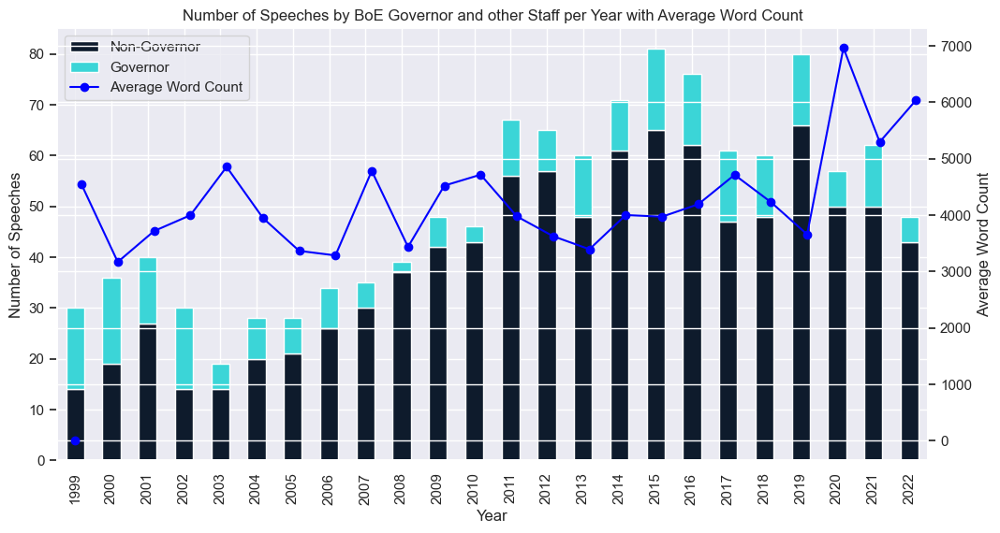

In [187]:
# Plot the bar chart of governor and non governor speeches
ax = boe_indicators_1999_2022_gov_yearly_pivot.plot(
    kind='bar', stacked=True, figsize=(12, 6), color=('#0e1b2c','#3bd5d7'))

ax.set_xlabel('Year')
ax.set_ylabel('Number of Speeches')
ax.set_title('Number of Speeches by BoE Governor and other Staff per Year with Average Word Count')
# ax.legend(title='Staff Member')

# Create a secondary axis
ax2 = ax.twinx()

# Line plot for 'speech_count' without log scale
ax2.plot(x + width/2, wordcount_yearly['word_count_original'], width, color='blue', marker='o', label='Average Word Count')

# Set secondary y-label
ax2.set_ylabel('Average Word Count')

# Retrieve handles and labels for both plots
handles, labels = ax.get_legend_handles_labels()
handles_line, labels_line = ax2.get_legend_handles_labels()

# Replace '0' and '1' in labels with 'Non-Governor' and 'Governor'
labels = ['Non-Governor' if lbl == '0' else 'Governor' for lbl in labels]

# Combine handles and labels
all_handles = handles + [handles_line[0]]
all_labels = labels + [labels_line[0]]

# Plot the full legend once
ax.legend(all_handles, all_labels, loc='upper left')

# Show the combined plot
plt.show()

### 3.4. Sentiment Analysis

**3.4.a. Governor vs Non-governor**

In [190]:
# Create a new column with descriptive labels
boe_indicators_1999_2022['gov_label'] = boe_indicators_1999_2022['is_gov'].map({0: 'Non-Governor', 1: 'Governor'})

# Now plot using 'gov_label' as x
fig_gov = px.box(
    boe_indicators_1999_2022,
    x='gov_label',  # use the new label column
    y='sentiment_lexicon_weighted',
    points='all',
    title='Sentiment by Governor Status (UK Speeches)',
    labels={'gov_label': 'Governor Status', 'sentiment_lexicon_weighted': 'Sentiment Score'},
    color='gov_label',
    color_discrete_map={
        'Non-Governor': '#0e1b2c',
        'Governor': '#3bd5d7'
    },
    category_orders={'gov_label': ['Non-Governor', 'Governor']}
)

fig_gov.show()

**3.4.b. Major Events**

In [192]:
# Major events (month granularity)
events = [
    ('Global Financial Crisis 09-2008', '2008-09'),
    ('Brexit Vote 06-2016', '2016-06'),
    ('COVID Lockdown 03-2020', '2020-03')
]

# Your list of events with order
events_order = ['Global Financial Crisis 09-2008', 'Brexit Vote 06-2016', 'COVID Lockdown 03-2020']

# Create DataFrame and convert to datetime
event_df = pd.DataFrame(events, columns=['event', 'month'])
event_df['month'] = pd.to_datetime(event_df['month'], format='%Y-%m')

# Convert 'event' column to categorical with specified order
event_df['event'] = pd.Categorical(event_df['event'], categories=events_order, ordered=True)

# Optional: sort DataFrame by 'event'
event_df = event_df.sort_values('event')

In [193]:
# Initialize list for sentiment comparison results
sentiment_comparison = []

for _, row in event_df.iterrows():
    event_name = row['event']
    event_date = row['month']
    
    # Define time windows around the event
    windows = {
        '4-6 months before': (event_date - pd.DateOffset(months=6), event_date - pd.DateOffset(months=3)),
        '2-3 months before': (event_date - pd.DateOffset(months=3), event_date - pd.DateOffset(months=1)),
        '1 month before': (event_date - pd.DateOffset(months=1), event_date - pd.DateOffset(days=1)),
        '1 month after': (event_date, event_date + pd.DateOffset(months=1) - pd.DateOffset(days=1)),
        '2-3 months after': (event_date, event_date + pd.DateOffset(months=3) - pd.DateOffset(months=1)),
        '4-6 months after': (event_date, event_date + pd.DateOffset(months=6) - pd.DateOffset(months=3))
    }

    for period_name, (start_date, end_date) in windows.items():
        speeches = boe_indicators_1999_2022[
            (boe_indicators_1999_2022['date_format'] >= start_date) &
            (boe_indicators_1999_2022['date_format'] <= end_date)
        ]

        # Save results
        sentiment_comparison.append({
            'event': event_name,
            'period': period_name,
            'avg_sentiment': speeches['sentiment_lexicon_weighted'].mean(),
            'count': speeches.shape[0]
        })

# Convert to DataFrame
sentiment_df = pd.DataFrame(sentiment_comparison)

# Define the order of periods
order = ['4-6 months before', '2-3 months before', '1 month before', '1 month after', '2-3 months after', '4-6 months after']
sentiment_df['period'] = pd.Categorical(sentiment_df['period'], categories=order, ordered=True)
sentiment_df = sentiment_df.sort_values(['period'])

In [194]:
# Create bar plot
fig = px.bar(
    sentiment_df,
    x='event',
    y='avg_sentiment',
    color='period',
    barmode='group',
    text='avg_sentiment',
    title='Average Speech Sentiment Before and After Events',
    labels={'avg_sentiment': 'Sentiment Score', 'event': 'Event'},
    category_orders={'event': ['Global Financial Crisis 09-2008', 'Brexit Vote 06-2016', 'COVID Lockdown 03-2020']},
    color_discrete_map={
        '4-6 months before': '#000080', 
        '2-3 months before': '#1a1aff', 
        '1 month before': '#5b92ff',
        '1 month after': '#a67ad3',
        '2-3 months after': '#7f40c0',
        '4-6 months after': '#402061'
    }
)

# Rotate x-axis labels for better fit
fig.update_xaxes()
fig.update_traces(text=None)

# Improve layout: bigger size, margins, and legend position
fig.update_layout(
    height=700,
    width=1000,
    margin=dict(l=50, r=50, t=100, b=150),
    showlegend=True,
    legend=dict(
        x=1.05,
        y=1,
        xanchor='left',
        yanchor='top'
    )
)

# Show the plot
fig.show()

### 3.4.Seasonality Analysis

**3.4.a. BoE Analysis**

In [197]:
# Group and aggregate sentiment scores by month
boe_sentiment_monthly = boe_indicators_1999_2022.groupby('year_month_dt')[['sentiment_lexicon_weighted']].mean().reset_index()

# View the DataFrame.
boe_sentiment_monthly.head()

,year_month_dt,sentiment_lexicon_weighted
0,1999-01-01,0.085728
1,1999-02-01,0.231430
2,1999-03-01,0.332402
3,1999-05-01,0.271080
4,1999-06-01,0.356269


In [198]:
# Set the datetime as index
boe_sentiment_monthly.set_index('year_month_dt', inplace=True)

# View the DataFrame
boe_sentiment_monthly.head()

,sentiment_lexicon_weighted
year_month_dt,
1999-01-01,0.085728
1999-02-01,0.231430
1999-03-01,0.332402
1999-05-01,0.271080
1999-06-01,0.356269


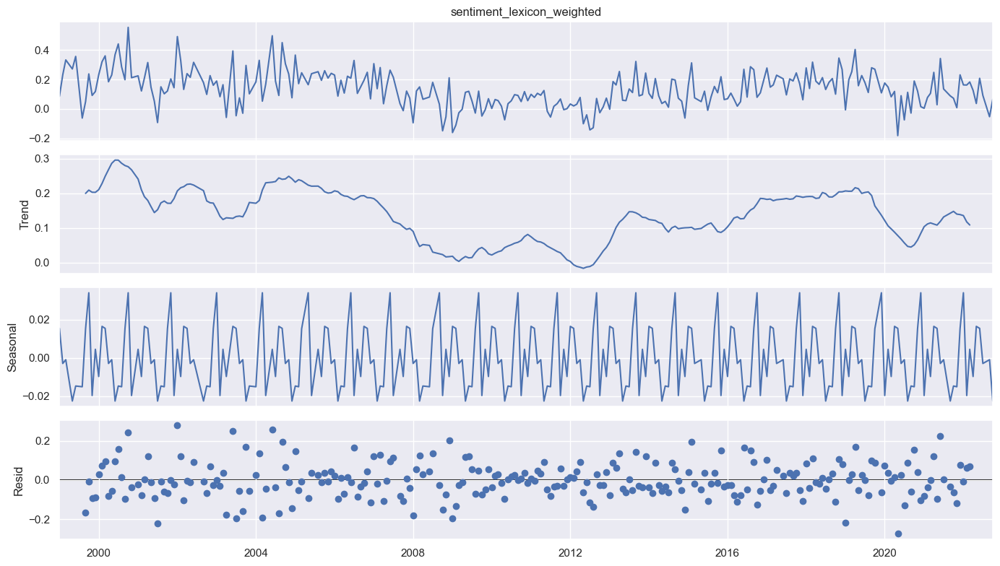

In [199]:
# Perform decomposition
boe_sentiment_decomposed = seasonal_decompose(boe_sentiment_monthly['sentiment_lexicon_weighted'], model='additive', period=12)

# Plot the decomposition
boe_sentiment_decomposed.plot()
plt.show()

**Observations Peaks**
- August 2013: Peak with a speech announcing Jane Austen on 10 GBP note and a discussion of the evolution of monetary policy since 2008-2009 crisis
- January 2022: speech about inflation with a sense of urgency about controlling inflation with reassurance that the Bank is actively monitoring and prepared to act responsibly. 

In [201]:
# Copy the data to prepare it quarterly
boe_sentiment_quarterly = boe_indicators_1999_2022.groupby('year_month_dt')[['sentiment_lexicon_weighted']].mean().reset_index()

In [202]:
# Extract year and quarter
boe_sentiment_quarterly['year'] = boe_sentiment_quarterly['year_month_dt'].dt.year
boe_sentiment_quarterly['quarter'] = boe_sentiment_quarterly['year_month_dt'].dt.quarter

# Group by year and quarter
boe_sentiment_quarterly = boe_sentiment_quarterly.groupby(['year', 'quarter'])[['sentiment_lexicon_weighted']].mean().reset_index()

# Create a 'quarter_start' date if needed
boe_sentiment_quarterly['quarter_start'] = pd.to_datetime(boe_sentiment_quarterly['year'].astype(str) + 'Q' \
                                                          + boe_sentiment_quarterly['quarter'].astype(str))

# View the DataFrame
boe_sentiment_quarterly.head()

,year,quarter,sentiment_lexicon_weighted,quarter_start
0,1999,1,0.216520,1999-01-01
1,1999,2,0.313675,1999-04-01
2,1999,3,-0.006232,1999-07-01
3,1999,4,0.148963,1999-10-01
4,2000,1,0.303788,2000-01-01


In [203]:
# Set the datetime as index
boe_sentiment_quarterly.set_index('quarter_start', inplace=True)

# View the DataFrame
boe_sentiment_quarterly

,year,quarter,sentiment_lexicon_weighted
quarter_start,,,
1999-01-01,1999,1,0.216520
1999-04-01,1999,2,0.313675
1999-07-01,1999,3,-0.006232
1999-10-01,1999,4,0.148963
2000-01-01,2000,1,0.303788
...,...,...,...
2021-10-01,2021,4,0.103875
2022-01-01,2022,1,0.169176
2022-04-01,2022,2,0.123447


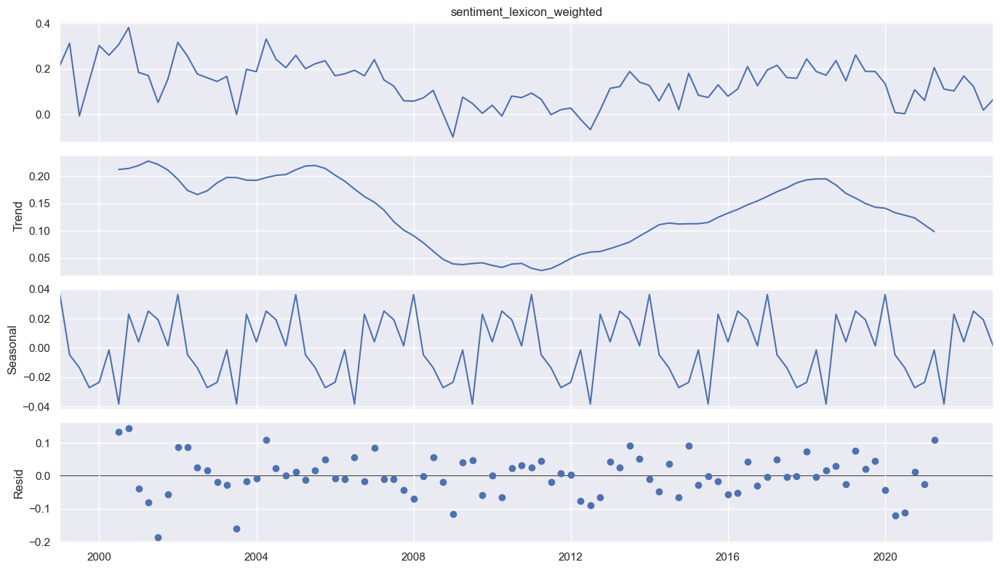

In [204]:
# Perform decomposition
boe_sentiment_decomposed_quarterly = seasonal_decompose(boe_sentiment_quarterly['sentiment_lexicon_weighted'], \
                                                        model='additive', period=12)

# Plot the decomposition
boe_sentiment_decomposed_quarterly.plot()
plt.show()

**3.4.b. BoE Governor Analysis**

In [206]:
# Filter speeches for governors only
boe_indicators_1999_2022_gov = boe_indicators_1999_2022[boe_indicators_1999_2022['is_gov'] == 1]

# View the DataFrame
boe_indicators_1999_2022_gov.head()

,index,reference,country,date_format,year_month,year,year_month_dt,title,author,is_gov,...,uk_consumer_confidence,gbp_usd_fx,ftse_250,gilts_short,gilts_medium,gilts_long,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types,gov_label
0,8,r990112a_BOE,united kingdom,1999-01-12,1999-01,1999,1999-01-01,Speech,george,1,...,-3.6,1.650910,4904.934033,4.30,4.24,4.32,13.5,26.1,67157,Governor
1,9,r990118a_BOE,united kingdom,1999-01-18,1999-01,1999,1999-01-01,Speech,george,1,...,-3.6,1.650910,4904.934033,4.30,4.24,4.32,13.5,26.1,67157,Governor
2,10,r990201a_BOE,united kingdom,1999-02-01,1999-02,1999,1999-02-01,Speech,george,1,...,-1.6,1.627565,5192.548511,4.45,4.39,4.42,13.2,26.1,67157,Governor
3,11,r990210a_BOE,united kingdom,1999-02-10,1999-02,1999,1999-02-01,Speech,george,1,...,-1.6,1.627565,5192.548511,4.45,4.39,4.42,13.2,26.1,67157,Governor
4,12,r990218a_BOE,united kingdom,1999-02-18,1999-02,1999,1999-02-01,The Chancellor's Lecture,george,1,...,-1.6,1.627565,5192.548511,4.45,4.39,4.42,13.2,26.1,67157,Governor


In [207]:
# Group and aggregate sentiment scores by month
boe_sentiment_gov_monthly = boe_indicators_1999_2022_gov.groupby('year_month_dt')[['sentiment_lexicon_weighted']] \
                                                                            .mean().reset_index()
# View the DataFrame
boe_sentiment_gov_monthly.head()

,year_month_dt,sentiment_lexicon_weighted
0,1999-01-01,0.085728
1,1999-02-01,0.231430
2,1999-03-01,0.145802
3,1999-05-01,0.256614
4,1999-06-01,0.244156


In [208]:
# Set the datetime as index
boe_sentiment_gov_monthly.set_index('year_month_dt', inplace=True)

# View the DataFrame
boe_sentiment_gov_monthly.head()

,sentiment_lexicon_weighted
year_month_dt,
1999-01-01,0.085728
1999-02-01,0.231430
1999-03-01,0.145802
1999-05-01,0.256614
1999-06-01,0.244156


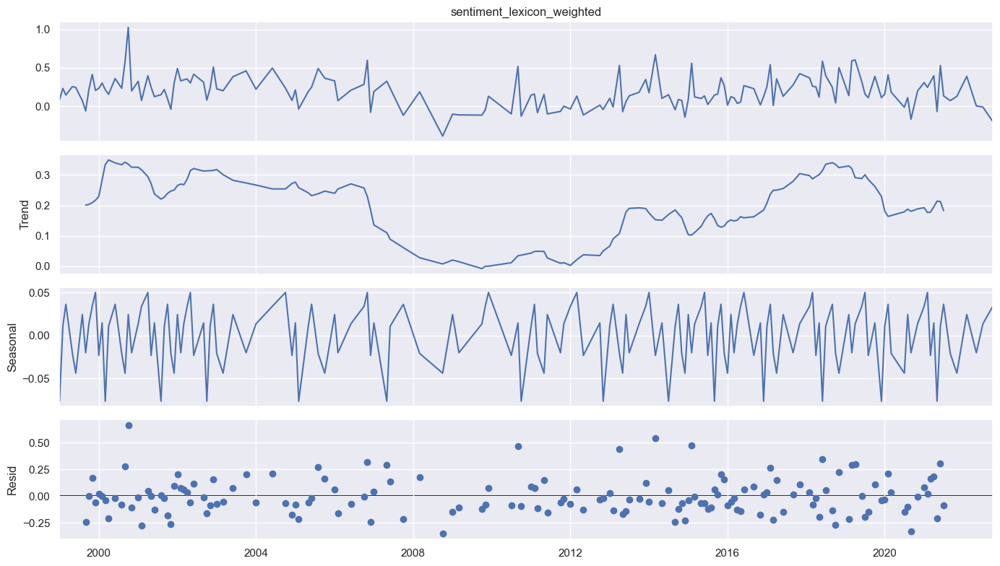

In [209]:
# Perform decomposition
boe_sentiment_gov_decomposed = seasonal_decompose(boe_sentiment_gov_monthly['sentiment_lexicon_weighted'], model='additive', period=12)

# Plot the decomposition
boe_sentiment_gov_decomposed.plot()
plt.show()

**Obersvations**: trend in governor speeches more positive - only during and following financial crisis is sentiment as negative

**3.4.c. All speeches and countries**

In [212]:
# Group and aggregate sentiment scores by month
sentiment_quarterly = speeches_1999_2022.groupby(['year_month_dt', 'country'])[['sentiment_lexicon_weighted']].mean().reset_index()

# View the DataFrame.
sentiment_quarterly.head()

,year_month_dt,country,sentiment_lexicon_weighted
0,1999-01-01,canada,0.290551
1,1999-01-01,euro area,0.348793
2,1999-01-01,sweden,0.273480
3,1999-01-01,switzerland,0.326246
4,1999-01-01,united kingdom,0.085728


In [213]:
# Extract year and quarter
sentiment_quarterly['year'] = sentiment_quarterly['year_month_dt'].dt.year
sentiment_quarterly['quarter'] = sentiment_quarterly['year_month_dt'].dt.quarter

# Group by year and quarter
sentiment_quarterly = sentiment_quarterly.groupby(['year', 'quarter', 'country'])[['sentiment_lexicon_weighted']].mean().reset_index()

# Create a 'quarter_start' date if needed
sentiment_quarterly['quarter_start'] = pd.to_datetime(sentiment_quarterly['year'].astype(str) + 'Q' \
                                                      + sentiment_quarterly['quarter'].astype(str))

# View the DataFrame
sentiment_quarterly

,year,quarter,country,sentiment_lexicon_weighted,quarter_start
0,1999,1,australia,0.192661,1999-01-01
1,1999,1,canada,0.241694,1999-01-01
2,1999,1,euro area,0.353401,1999-01-01
3,1999,1,japan,0.023971,1999-01-01
4,1999,1,sweden,0.166323,1999-01-01
...,...,...,...,...,...
746,2022,4,euro area,-0.082410,2022-10-01
747,2022,4,japan,0.143825,2022-10-01
748,2022,4,switzerland,0.015589,2022-10-01
749,2022,4,united kingdom,0.065534,2022-10-01


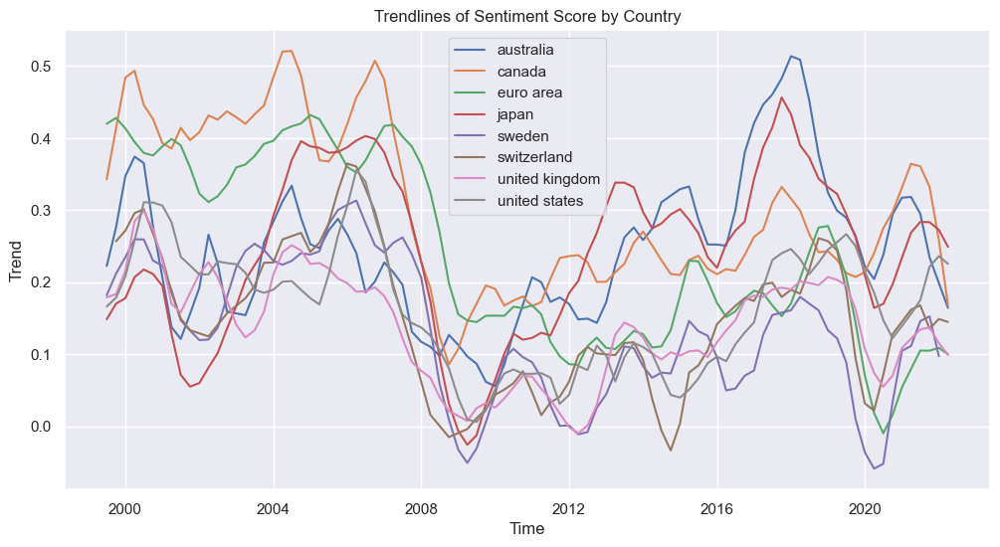

In [214]:
# Plot the trend chart for all countries
plt.figure(figsize=(12, 6))

for country, group in sentiment_quarterly.groupby('country'):
    # Set date as index
    group = group.set_index('quarter_start').sort_index()
    
    # Check for missing dates or gaps, handle if needed

    # Decompose to get trend
    result = seasonal_decompose(group['sentiment_lexicon_weighted'], model='additive', period=4)

    # Plot the trend
    plt.plot(group.index, result.trend, label=country)
    
plt.legend()
plt.title('Trendlines of Sentiment Score by Country')
plt.xlabel('Time')
plt.ylabel('Trend')
plt.show()

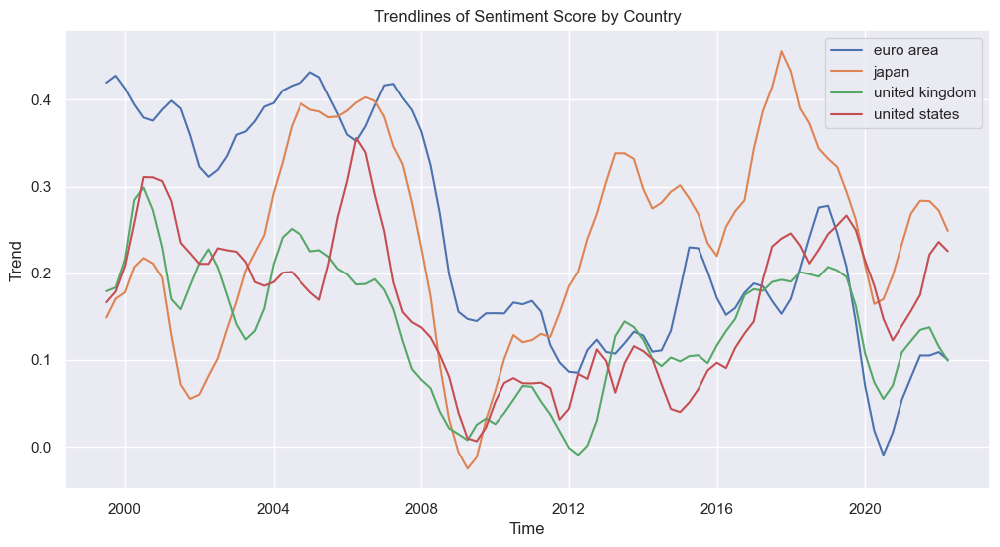

In [215]:
# Plot the trend chart only for UK, USA, Euro Area and Australia
plt.figure(figsize=(12, 6))

for country, group in sentiment_quarterly[sentiment_quarterly['country'].isin(countries_to_display)].groupby('country'):
    # Set date as index
    group = group.set_index('quarter_start').sort_index()
    
    # Check for missing dates or gaps, handle if needed

    # Decompose to get trend
    result = seasonal_decompose(group['sentiment_lexicon_weighted'], model='additive', period=4)

    # Plot the trend
    plt.plot(group.index, result.trend, label=country)
    
plt.legend()
plt.title('Trendlines of Sentiment Score by Country')
plt.xlabel('Time')
plt.ylabel('Trend')
plt.show()

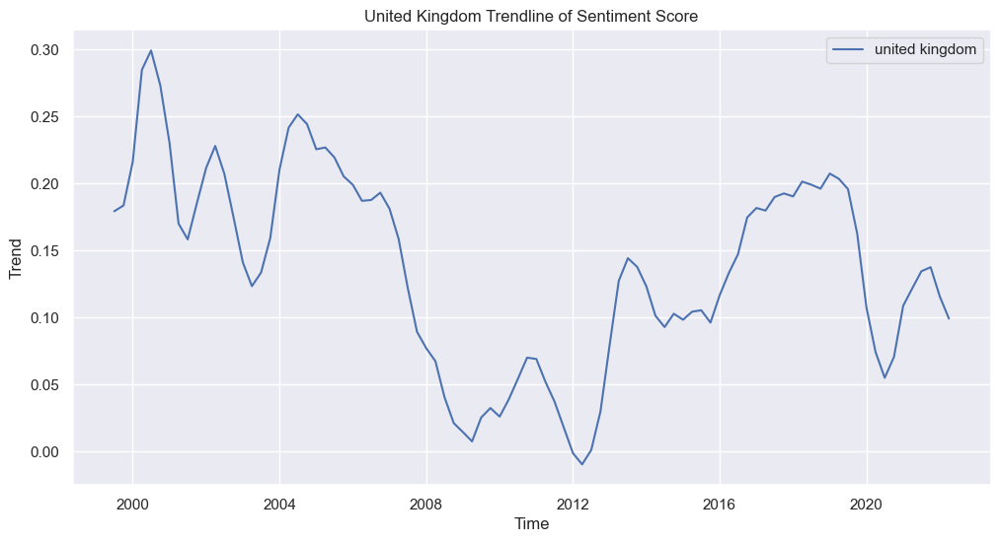

In [216]:
# PLot the chart for UK only
plt.figure(figsize=(12, 6))

for country, group in sentiment_quarterly[sentiment_quarterly['country'].isin(country_to_display)].groupby('country'):
    # Set date as index
    group = group.set_index('quarter_start').sort_index()
    
    # Check for missing dates or gaps, handle if needed

    # Decompose to get trend
    result = seasonal_decompose(group['sentiment_lexicon_weighted'], model='additive', period=4)

    # Plot the trend
    plt.plot(group.index, result.trend, label=country)
    
plt.legend()
plt.title('United Kingdom Trendline of Sentiment Score')
plt.xlabel('Time')
plt.ylabel('Trend')
plt.show()

### 3.5. Topic Analysis

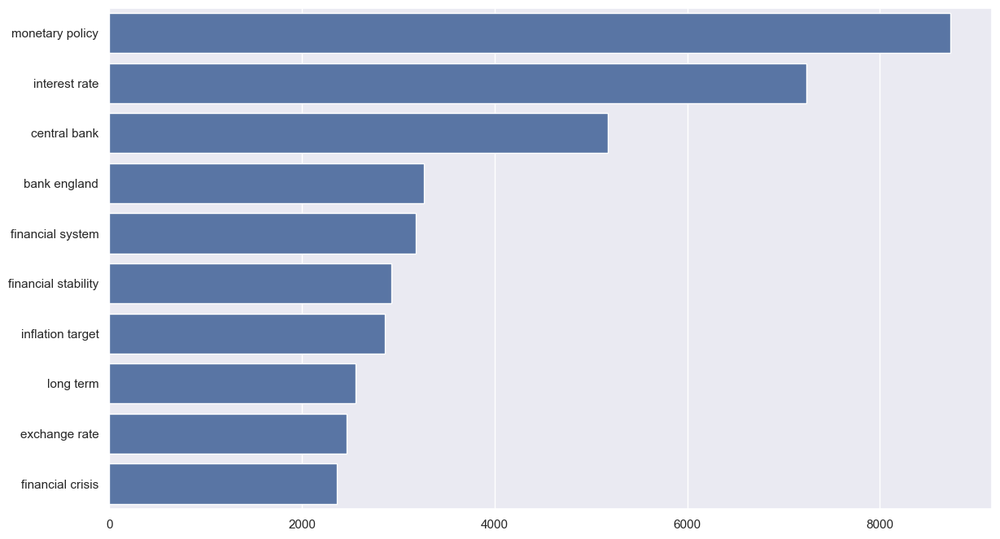

In [218]:
# Plot top phrases with 2 words
top_word_group_barchart(boe_indicators_1999_2022['text_lemmatised_str'],2)

In [219]:
# Let's say 'top_bigrams' is your list of most common bigram strings
top_bigrams = ['monetary policy', 'interest rate', ' central bank', 'financial system', 'financial stability', 'inflation target', \
              'long term', 'financial crisis', 'balance sheet', 'exchange rate']  # Replace with actual bigrams

# Initialize a dictionary to store counts
bigram_counts = {bigram: 0 for bigram in top_bigrams}

# Loop through speeches and count how many contain each bigram
for index, row in boe_indicators_1999_2022.iterrows():
    speech_text = row['text_lemmatised_str'].lower()
    for bigram in top_bigrams:
        if bigram in speech_text:
            bigram_counts[bigram] += 1

# Convert to DataFrame for better visualization
bigram_counts_boe = pd.DataFrame(bigram_counts.items(), columns=['Bigram', 'Count']).sort_values(by='Count', ascending=False)

# View the DataFrame
bigram_counts_boe

,Bigram,Count
0,monetary policy,839
1,interest rate,816
2,central bank,745
6,long term,730
3,financial system,663
7,financial crisis,659
4,financial stability,579
8,balance sheet,569
5,inflation target,541
9,exchange rate,428


**Calculating number of bigrams per speech**

In [221]:
# Bigrams to search for
target_bigrams = ['monetary policy', 'interest rate', 'financial stability', 'inflation target', 'financial crisis', 'exchange rate']

# Fit CountVectorizer on all speeches
vectorizer = CountVectorizer(ngram_range=(2, 2))
X = vectorizer.fit_transform(boe_indicators_1999_2022['text_lemmatised_str'].str.lower())

# Create a DataFrame of counts
bigram_counts_df = pd.DataFrame(X.toarray(), index=boe_indicators_1999_2022.index, columns=vectorizer.get_feature_names_out())

# For each target bigram, add a column with its count
for bigram in target_bigrams:
    if bigram in bigram_counts_df.columns:
        boe_indicators_1999_2022[f'{bigram}'] = bigram_counts_df[bigram]
    else:
        # Bigram not found in the data
        boe_indicators_1999_2022[f'{bigram}'] = 0

**Bigrams in speech more than 5 times**

In [223]:
# Filter speeches with 'monetary policy' > 5
boe_monetary_policy = boe_indicators_1999_2022[boe_indicators_1999_2022['monetary policy'] > 5]

In [224]:
monetary_policy_avg_yearly = boe_monetary_policy.groupby('year')['sentiment_lexicon_weighted'].mean().reset_index()
monetary_policy_avg_yearly.rename(columns={'sentiment_lexicon_weighted': 'Monetary Policy'}, inplace=True)

In [225]:
# Filter speeches with 'interest rate' > 5
boe_interest_rate = boe_indicators_1999_2022[boe_indicators_1999_2022['interest rate'] > 5]

In [226]:
interest_rate_avg_yearly = boe_interest_rate.groupby('year')['sentiment_lexicon_weighted'].mean().reset_index()
interest_rate_avg_yearly.rename(columns={'sentiment_lexicon_weighted': 'Interest Rate'}, inplace=True)

In [227]:
# Filter speeches with 'financial stability' > 5
boe_financial_stability = boe_indicators_1999_2022[boe_indicators_1999_2022['financial stability'] > 5]

In [228]:
financial_stability_avg_yearly = boe_financial_stability.groupby('year')['sentiment_lexicon_weighted'].mean().reset_index()
financial_stability_avg_yearly.rename(columns={'sentiment_lexicon_weighted': 'Financial Stability'}, inplace=True)

In [229]:
# Filter speeches with 'inflation target' > 5
boe_inflation_target = boe_indicators_1999_2022[boe_indicators_1999_2022['inflation target'] > 5]

In [230]:
inflation_target_avg_yearly = boe_inflation_target.groupby('year')['sentiment_lexicon_weighted'].mean().reset_index()
inflation_target_avg_yearly.rename(columns={'sentiment_lexicon_weighted': 'Inflation Target'}, inplace=True)

In [231]:
# Filter speeches with 'financial crisis' > 5
boe_financial_crisis = boe_indicators_1999_2022[boe_indicators_1999_2022['financial crisis'] > 5]

In [232]:
financial_crisis_avg_yearly = boe_financial_crisis.groupby('year')['sentiment_lexicon_weighted'].mean().reset_index()
financial_crisis_avg_yearly.rename(columns={'sentiment_lexicon_weighted': 'Financial Crisis'}, inplace=True)

In [233]:
# Filter speeches with 'financial crisis' > 5
boe_exchange_rate = boe_indicators_1999_2022[boe_indicators_1999_2022['exchange rate'] > 5]

In [234]:
exchange_rate_avg_yearly = boe_exchange_rate.groupby('year')['sentiment_lexicon_weighted'].mean().reset_index()
exchange_rate_avg_yearly.rename(columns={'sentiment_lexicon_weighted': 'Exchange Rate'}, inplace=True)

In [235]:
# List of DataFrames to merge
dataframes_to_merge = [interest_rate_avg_yearly, financial_stability_avg_yearly, inflation_target_avg_yearly, \
                       financial_crisis_avg_yearly, exchange_rate_avg_yearly]

# Use reduce to merge all DataFrames in the list
sentiment_by_topic = reduce(lambda left, right: left.merge(right, on='year', how='left'), dataframes_to_merge, monetary_policy_avg_yearly)

# View the merged DataFrame
sentiment_by_topic.head()

,year,Monetary Policy,Interest Rate,Financial Stability,Inflation Target,Financial Crisis,Exchange Rate
0,1999,0.244326,0.177377,0.369147,0.213024,-0.128622,0.045155
1,2000,0.285042,0.308447,0.185691,0.270082,NaN,0.258892
2,2001,0.140682,0.103512,0.176494,-0.005303,0.075610,0.089631
3,2002,0.158246,0.180259,0.089188,0.147942,NaN,0.109249
4,2003,0.120934,0.062578,0.176774,0.037364,0.108403,0.028747


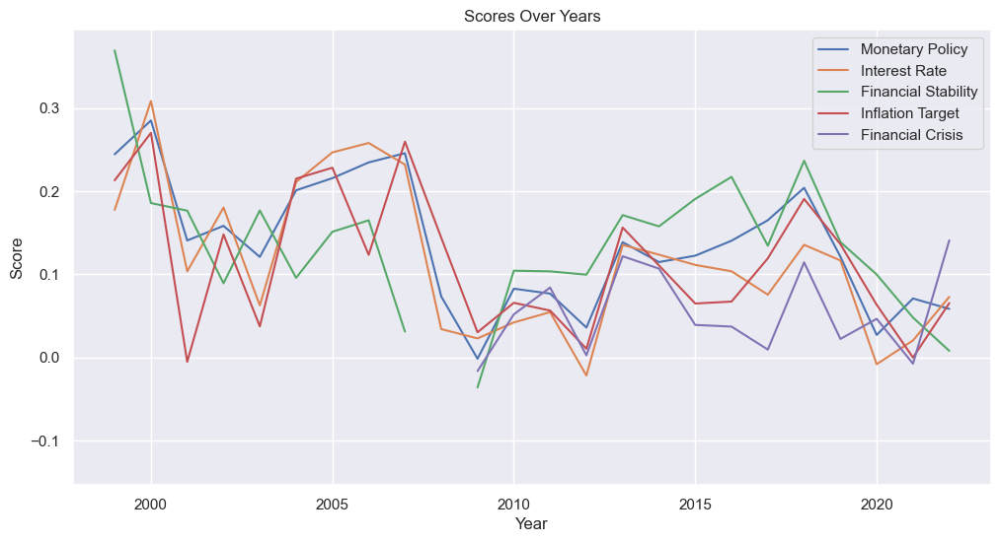

In [236]:
plt.figure(figsize=(12, 6))

# List your score columns
score_columns = ['Monetary Policy', 'Interest Rate', 'Financial Stability', 'Inflation Target', 'Financial Crisis']

for col in score_columns:
    plt.plot(sentiment_by_topic['year'], sentiment_by_topic[col], label=col)

plt.xlabel('Year')
plt.ylabel('Score')
plt.title('Scores Over Years')
plt.legend()
plt.show()

**Bigrams in speech more than 10 times**

In [238]:
# Filter speeches with 'monetary policy' > 10
boe_monetary_policy_10 = boe_indicators_1999_2022[boe_indicators_1999_2022['monetary policy'] > 10]

In [239]:
# Filter speeches with 'interest rate' > 10
boe_interest_rate_10 = boe_indicators_1999_2022[boe_indicators_1999_2022['interest rate'] > 10]

In [240]:
# Filter speeches with 'interest rate' > 10
boe_financial_stability_10 = boe_indicators_1999_2022[boe_indicators_1999_2022['financial stability'] >10]

In [241]:
# Filter speeches with 'inflation target' > 10
boe_inflation_target_10 = boe_indicators_1999_2022[boe_indicators_1999_2022['inflation target'] > 10]

In [242]:
# Filter speeches with 'inflation target' > 10
boe_financial_crisis_10 = boe_indicators_1999_2022[boe_indicators_1999_2022['financial crisis'] > 10]

In [243]:
# Filter speeches with 'inflation target' > 10
boe_exchange_rate_10 = boe_indicators_1999_2022[boe_indicators_1999_2022['exchange rate'] > 10]

**Data grouped by year** for
- average sentiment score
- total number of mentions
- number of speechs that include the bigram
- number of mentiones per seech that include bigram

In [245]:
monetary_policy_10_avg_yearly = boe_monetary_policy_10.groupby('year').agg({
    'sentiment_lexicon_weighted': 'mean',
    'monetary policy': ['sum', 'count', 'mean']
}).reset_index()

# Rename the sentiment column
monetary_policy_10_avg_yearly.rename(columns={'sentiment_lexicon_weighted': 'sentiment_montary_policy'}, inplace=True)

# Flatten hierarchical columns
monetary_policy_10_avg_yearly.columns = ['_'.join(col).strip() for col in monetary_policy_10_avg_yearly.columns.values]

In [246]:
interest_rate_10_avg_yearly = boe_interest_rate_10.groupby('year').agg({
    'sentiment_lexicon_weighted': 'mean',
    'interest rate': ['sum', 'count', 'mean']
}).reset_index()

# Rename the sentiment column
interest_rate_10_avg_yearly.rename(columns={'sentiment_lexicon_weighted': 'sentiment_interest_rate'}, inplace=True)

# Flatten hierarchical columns
interest_rate_10_avg_yearly.columns = ['_'.join(col).strip() for col in interest_rate_10_avg_yearly.columns.values]

In [247]:
financial_stability_10_avg_yearly = boe_financial_stability_10.groupby('year').agg({
    'sentiment_lexicon_weighted': 'mean',
    'financial stability': ['sum', 'count', 'mean']
}).reset_index()

# Rename the sentiment column
financial_stability_10_avg_yearly.rename(columns={'sentiment_lexicon_weighted': 'sentiment_financial_stability'}, inplace=True)

# Flatten hierarchical columns
financial_stability_10_avg_yearly.columns = ['_'.join(col).strip() for col in financial_stability_10_avg_yearly.columns.values]

In [248]:
inflation_target_10_avg_yearly = boe_inflation_target_10.groupby('year').agg({
    'sentiment_lexicon_weighted': 'mean',
    'inflation target': ['sum', 'count', 'mean']
}).reset_index()

# Rename the sentiment column
inflation_target_10_avg_yearly.rename(columns={'sentiment_lexicon_weighted': 'sentiment_inflation_target'}, inplace=True)

# Flatten hierarchical columns
inflation_target_10_avg_yearly.columns = ['_'.join(col).strip() for col in inflation_target_10_avg_yearly.columns.values]

In [249]:
financial_crisis_10_avg_yearly = boe_financial_crisis_10.groupby('year').agg({
    'sentiment_lexicon_weighted': 'mean',
    'financial crisis': ['sum', 'count', 'mean']
}).reset_index()

# Rename the sentiment column
financial_crisis_10_avg_yearly.rename(columns={'sentiment_lexicon_weighted': 'sentiment_financial_crisis'}, inplace=True)

# Flatten hierarchical columns
financial_crisis_10_avg_yearly.columns = ['_'.join(col).strip() for col in financial_crisis_10_avg_yearly.columns.values]

In [250]:
exchange_rate_10_avg_yearly = boe_exchange_rate_10.groupby('year').agg({
    'sentiment_lexicon_weighted': 'mean',
    'exchange rate': ['sum', 'count', 'mean']
}).reset_index()

# Rename the sentiment column
exchange_rate_10_avg_yearly.rename(columns={'sentiment_lexicon_weighted': 'sentiment_exchange_rate'}, inplace=True)

# Flatten hierarchical columns
exchange_rate_10_avg_yearly.columns = ['_'.join(col).strip() for col in exchange_rate_10_avg_yearly.columns.values]

In [251]:
# List of DataFrames to merge
dataframes_to_merge = [interest_rate_10_avg_yearly, financial_stability_10_avg_yearly, inflation_target_10_avg_yearly, \
                       financial_crisis_10_avg_yearly, exchange_rate_10_avg_yearly]

# Use reduce to merge all DataFrames in the list
sentiment_by_topic_10 = reduce(lambda left, right: left.merge(right, on='year_', how='left'), dataframes_to_merge, monetary_policy_10_avg_yearly)

# Rename the year column
sentiment_by_topic_10.rename(columns={'year_': 'year'}, inplace=True)

# View the merged DataFrame
sentiment_by_topic_10.head()

,year,sentiment_montary_policy_mean,monetary policy_sum,monetary policy_count,monetary policy_mean,sentiment_interest_rate_mean,interest rate_sum,interest rate_count,interest rate_mean,sentiment_financial_stability_mean,...,inflation target_count,inflation target_mean,sentiment_financial_crisis_mean,financial crisis_sum,financial crisis_count,financial crisis_mean,sentiment_exchange_rate_mean,exchange rate_sum,exchange rate_count,exchange rate_mean
0,1999,0.210901,231,9,25.666667,0.167894,284,8,35.500000,0.445985,...,4.0,20.250000,-0.128622,29.0,2.0,14.5,0.176839,197.0,4.0,49.25
1,2000,0.294427,161,8,20.125000,0.242870,141,6,23.500000,0.185691,...,2.0,20.500000,NaN,NaN,NaN,NaN,0.273693,156.0,5.0,31.20
2,2001,0.082977,107,7,15.285714,-0.009596,130,6,21.666667,0.142246,...,NaN,NaN,NaN,NaN,NaN,NaN,0.142656,111.0,5.0,22.20
3,2002,0.152509,186,9,20.666667,0.185330,338,13,26.000000,NaN,...,5.0,17.800000,NaN,NaN,NaN,NaN,0.109249,145.0,5.0,29.00
4,2003,0.051797,185,5,37.000000,0.056963,192,6,32.000000,0.108403,...,3.0,30.666667,NaN,NaN,NaN,NaN,0.001722,25.0,2.0,12.50


In [252]:
# View the column types
sentiment_by_topic_10.dtypes

year                                    int32
sentiment_montary_policy_mean         float64
monetary policy_sum                     int64
monetary policy_count                   int64
monetary policy_mean                  float64
sentiment_interest_rate_mean          float64
interest rate_sum                       int64
interest rate_count                     int64
interest rate_mean                    float64
sentiment_financial_stability_mean    float64
financial stability_sum               float64
financial stability_count             float64
financial stability_mean              float64
sentiment_inflation_target_mean       float64
inflation target_sum                  float64
inflation target_count                float64
inflation target_mean                 float64
sentiment_financial_crisis_mean       float64
financial crisis_sum                  float64
financial crisis_count                float64
financial crisis_mean                 float64
sentiment_exchange_rate_mean      

In [253]:
# List your score columns
sentiment_columns = ['sentiment_montary_policy_mean', 'sentiment_interest_rate_mean', 'sentiment_financial_stability_mean', 
                 'sentiment_inflation_target_mean', 'sentiment_financial_crisis_mean', 'sentiment_exchange_rate_mean']

# List your score columns
bigram_count = ['monetary policy_count', 'interest rate_count', 'financial stability_count', 
                 'inflation target_count', 'financial crisis_count', 'exchange rate_count']

In [254]:
print(sentiment_by_topic_10.columns)

Index(['year', 'sentiment_montary_policy_mean', 'monetary policy_sum',
       'monetary policy_count', 'monetary policy_mean',
       'sentiment_interest_rate_mean', 'interest rate_sum',
       'interest rate_count', 'interest rate_mean',
       'sentiment_financial_stability_mean', 'financial stability_sum',
       'financial stability_count', 'financial stability_mean',
       'sentiment_inflation_target_mean', 'inflation target_sum',
       'inflation target_count', 'inflation target_mean',
       'sentiment_financial_crisis_mean', 'financial crisis_sum',
       'financial crisis_count', 'financial crisis_mean',
       'sentiment_exchange_rate_mean', 'exchange rate_sum',
       'exchange rate_count', 'exchange rate_mean'],
      dtype='object')


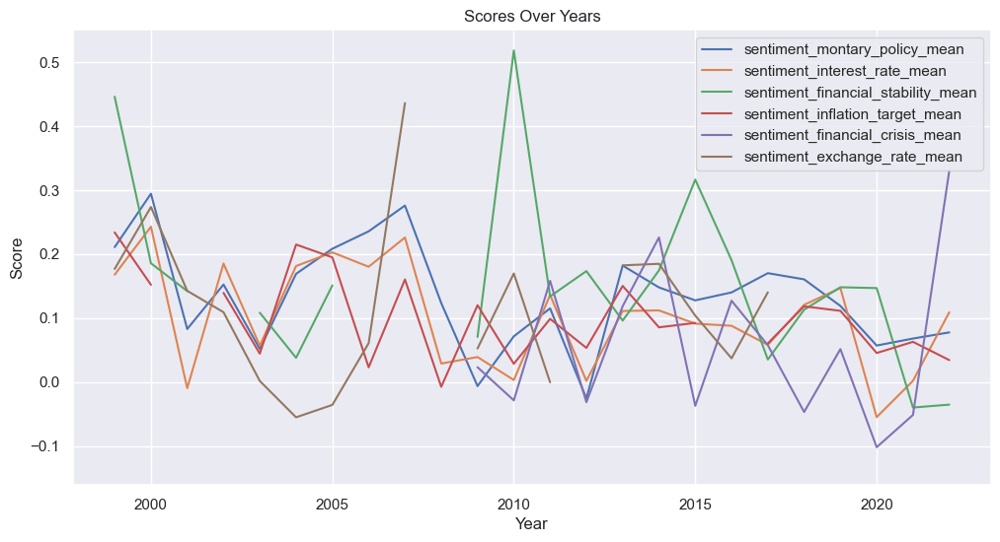

In [255]:
plt.figure(figsize=(12, 6))

for col in sentiment_columns:
    plt.plot(sentiment_by_topic_10['year'], sentiment_by_topic_10[col], label=col)

plt.xlabel('Year')
plt.ylabel('Score')
plt.title('Scores Over Years')
plt.legend()
plt.show()

In [256]:
# Create a mapping for better labels in the plot
label_mapping = {
    'monetary policy_count': 'Monetary Policy',
    'interest rate_count': 'Interest Rate',
    'financial stability_count': 'Financial Stability',
    'inflation target_count': 'Inflation Target',
    'financial crisis_count': 'Financial Crisis',
    'exchange rate_count': 'Exchange Rate'
}

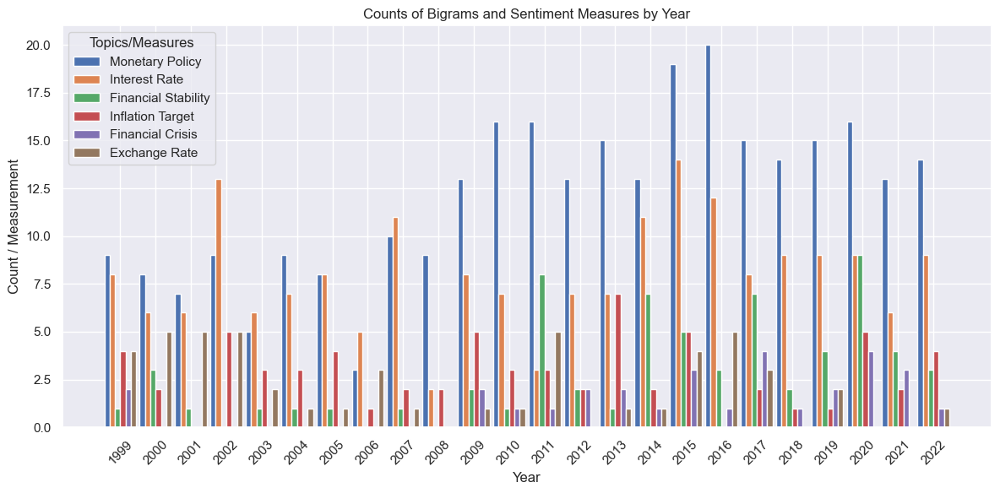

In [257]:
# Example x positions for bars (e.g., years, index)
x = np.arange(len(sentiment_by_topic_10))
total_topics = len(bigram_count)
bar_width = 0.15  # Adjust as needed

plt.figure(figsize=(12, 6))

for i, col in enumerate(bigram_count):
    offset = (i - total_topics / 2) * bar_width + bar_width / 2
    plt.bar(
        x + offset,
        sentiment_by_topic_10[col],  # Use your actual DataFrame and column
        width=bar_width,
        label=label_mapping[col]
    )

# Set x-axis labels (e.g., years or categories)
plt.xlabel('Year')
plt.ylabel('Count / Measurement')
plt.title('Counts of Bigrams and Sentiment Measures by Year')
plt.xticks(x, sentiment_by_topic_10['year'], rotation=45)  # Replace 'year' with your x labels

# Add legend with custom labels
plt.legend(title='Topics/Measures')
plt.tight_layout()
plt.show()


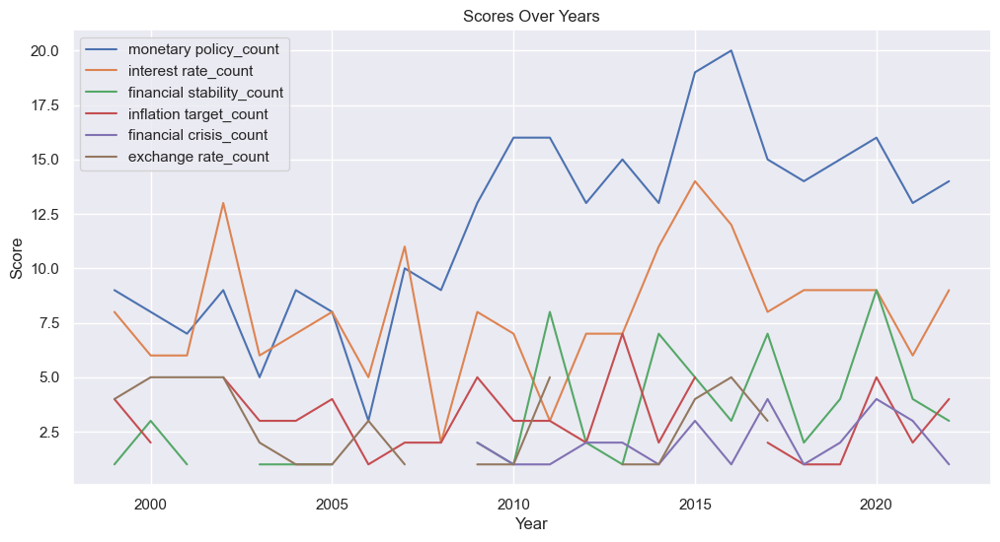

In [258]:
plt.figure(figsize=(12, 6))

for col in bigram_count:
    plt.plot(sentiment_by_topic_10['year'], sentiment_by_topic_10[col], label=col)

plt.xlabel('Year')
plt.ylabel('Score')
plt.title('Scores Over Years')
plt.legend()
plt.show()

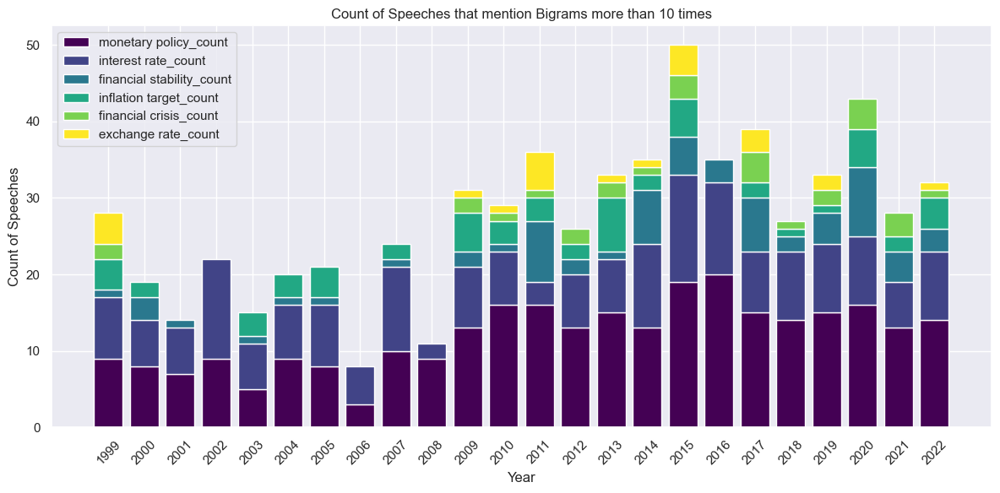

In [259]:
# Generate Viridis colors for each bar segment
num_colors = len(bigram_count)  # or len(sentiment_by_topic_10.columns)
colors = cm.get_cmap('viridis', num_colors).colors

# Set figure size
plt.figure(figsize=(12, 6))

# X positions
indices = np.arange(len(sentiment_by_topic_10['year']))

# Initialize the bottom for stacking
bottoms = np.zeros(len(sentiment_by_topic_10))

# Plot each column as stacked bars
for i, col in enumerate(bigram_count):
    plt.bar(indices, sentiment_by_topic_10[col], bottom=bottoms, color=colors[i], label=col)
    # Update bottoms for stacking
    bottoms += sentiment_by_topic_10[col]

# Set x labels
plt.xlabel('Year')
plt.ylabel('Count of Speeches')
plt.title('Count of Speeches that mention Bigrams more than 10 times')
plt.xticks(indices, sentiment_by_topic_10['year'], rotation=45)

plt.legend(loc='upper left', bbox_to_anchor=(0, 1))
plt.tight_layout()
plt.show()

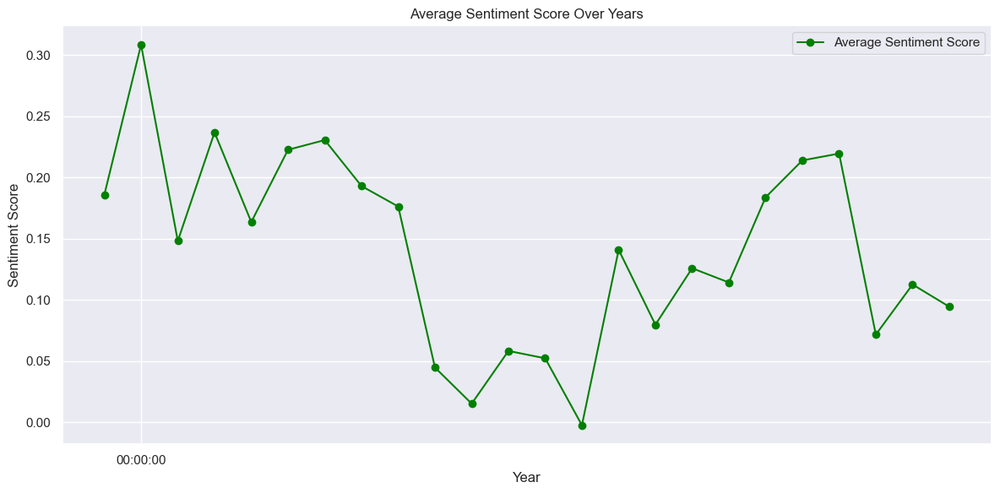

In [260]:
plt.figure(figsize=(12, 6))
plt.plot(
    boe_speeches_1999_2022_yearly['year'],
    boe_speeches_1999_2022_yearly['sentiment_lexicon_weighted'],
    color='green',
    marker='o',
    label='Average Sentiment Score'
)

plt.xlabel('Year')
plt.ylabel('Sentiment Score')
plt.title('Average Sentiment Score Over Years')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [261]:
sentiment_by_topic_10.dtypes

year                                    int32
sentiment_montary_policy_mean         float64
monetary policy_sum                     int64
monetary policy_count                   int64
monetary policy_mean                  float64
sentiment_interest_rate_mean          float64
interest rate_sum                       int64
interest rate_count                     int64
interest rate_mean                    float64
sentiment_financial_stability_mean    float64
financial stability_sum               float64
financial stability_count             float64
financial stability_mean              float64
sentiment_inflation_target_mean       float64
inflation target_sum                  float64
inflation target_count                float64
inflation target_mean                 float64
sentiment_financial_crisis_mean       float64
financial crisis_sum                  float64
financial crisis_count                float64
financial crisis_mean                 float64
sentiment_exchange_rate_mean      

In [270]:
boe_speeches_1999_2022_yearly.dtypes

year                                int32
sentiment_lexicon_simple          float64
sentiment_lexicon_simple_std      float64
sentiment_lexicon_weighted        float64
sentiment_lexicon_weighted_std    float64
uk_inflation_rate_CPIH            float64
uk_unemployment_rate              float64
uk_gdp_growth                     float64
uk_interest_rate                  float64
uk_consumer_confidence            float64
gbp_usd_fx                        float64
ftse_250                          float64
gilts_short                       float64
gilts_medium                      float64
gilts_long                        float64
uk_credit_growth_no_cc            float64
uk_credit_growth_only_cc          float64
avg_price_all_property_types      float64
dtype: object

In [272]:
sentiment_by_topic_10_weighted = pd.merge(sentiment_by_topic_10, boe_speeches_1999_2022_yearly[['year', 'sentiment_lexicon_weighted']], on='year', how='left')

sentiment_by_topic_10_weighted.head()

,year,sentiment_montary_policy_mean,monetary policy_sum,monetary policy_count,monetary policy_mean,sentiment_interest_rate_mean,interest rate_sum,interest rate_count,interest rate_mean,sentiment_financial_stability_mean,...,inflation target_mean,sentiment_financial_crisis_mean,financial crisis_sum,financial crisis_count,financial crisis_mean,sentiment_exchange_rate_mean,exchange rate_sum,exchange rate_count,exchange rate_mean,sentiment_lexicon_weighted
0,1999,0.210901,231,9,25.666667,0.167894,284,8,35.500000,0.445985,...,20.250000,-0.128622,29.0,2.0,14.5,0.176839,197.0,4.0,49.25,0.185937
1,2000,0.294427,161,8,20.125000,0.242870,141,6,23.500000,0.185691,...,20.500000,NaN,NaN,NaN,NaN,0.273693,156.0,5.0,31.20,0.308585
2,2001,0.082977,107,7,15.285714,-0.009596,130,6,21.666667,0.142246,...,NaN,NaN,NaN,NaN,NaN,0.142656,111.0,5.0,22.20,0.148234
3,2002,0.152509,186,9,20.666667,0.185330,338,13,26.000000,NaN,...,17.800000,NaN,NaN,NaN,NaN,0.109249,145.0,5.0,29.00,0.236919
4,2003,0.051797,185,5,37.000000,0.056963,192,6,32.000000,0.108403,...,30.666667,NaN,NaN,NaN,NaN,0.001722,25.0,2.0,12.50,0.163706


In [274]:
# Replace NaN with 0
sentiment_by_topic_10_weighted.fillna(value=0, inplace=True)

# View the DataFrame
sentiment_by_topic_10_weighted.head()

,year,sentiment_montary_policy_mean,monetary policy_sum,monetary policy_count,monetary policy_mean,sentiment_interest_rate_mean,interest rate_sum,interest rate_count,interest rate_mean,sentiment_financial_stability_mean,...,inflation target_mean,sentiment_financial_crisis_mean,financial crisis_sum,financial crisis_count,financial crisis_mean,sentiment_exchange_rate_mean,exchange rate_sum,exchange rate_count,exchange rate_mean,sentiment_lexicon_weighted
0,1999,0.210901,231,9,25.666667,0.167894,284,8,35.500000,0.445985,...,20.250000,-0.128622,29.0,2.0,14.5,0.176839,197.0,4.0,49.25,0.185937
1,2000,0.294427,161,8,20.125000,0.242870,141,6,23.500000,0.185691,...,20.500000,0.000000,0.0,0.0,0.0,0.273693,156.0,5.0,31.20,0.308585
2,2001,0.082977,107,7,15.285714,-0.009596,130,6,21.666667,0.142246,...,0.000000,0.000000,0.0,0.0,0.0,0.142656,111.0,5.0,22.20,0.148234
3,2002,0.152509,186,9,20.666667,0.185330,338,13,26.000000,0.000000,...,17.800000,0.000000,0.0,0.0,0.0,0.109249,145.0,5.0,29.00,0.236919
4,2003,0.051797,185,5,37.000000,0.056963,192,6,32.000000,0.108403,...,30.666667,0.000000,0.0,0.0,0.0,0.001722,25.0,2.0,12.50,0.163706


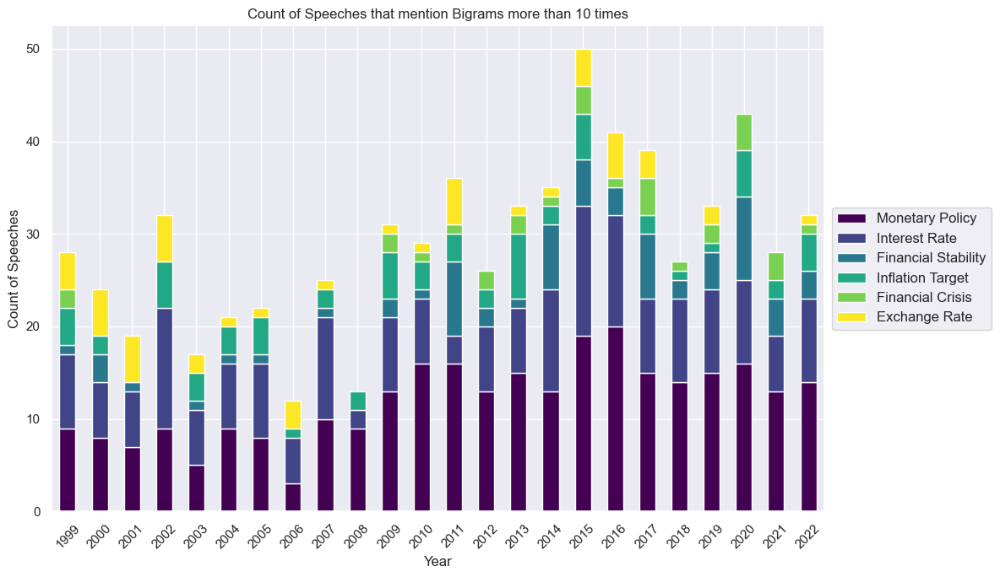

In [275]:
# Plot the stacked bar chart
ax = sentiment_by_topic_10_weighted[bigram_count].plot(
    kind='bar',
    stacked=True,
    figsize=(12, 7),
    color=colors
)

# Set x-ticks and labels
ax.set_xticks(range(len(sentiment_by_topic_10_weighted)))
ax.set_xticklabels(sentiment_by_topic_10_weighted['year'], rotation=45)

# Set axis labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Count of Speeches')
plt.title('Count of Speeches that mention Bigrams more than 10 times')

# Get current legend handles and labels
handles, labels = ax.get_legend_handles_labels()

# Create your custom labels
custom_labels = ['Monetary Policy', 'Interest Rate', 'Financial Stability', 'Inflation Target', 'Financial Crisis', 'Exchange Rate']
# Make sure the length matches the number of handles

# Assign custom labels to labels variable
labels = custom_labels

# Move legend to the right
ax.legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5), fontsize=12)

# Adjust layout and show plot
plt.tight_layout()
plt.show()

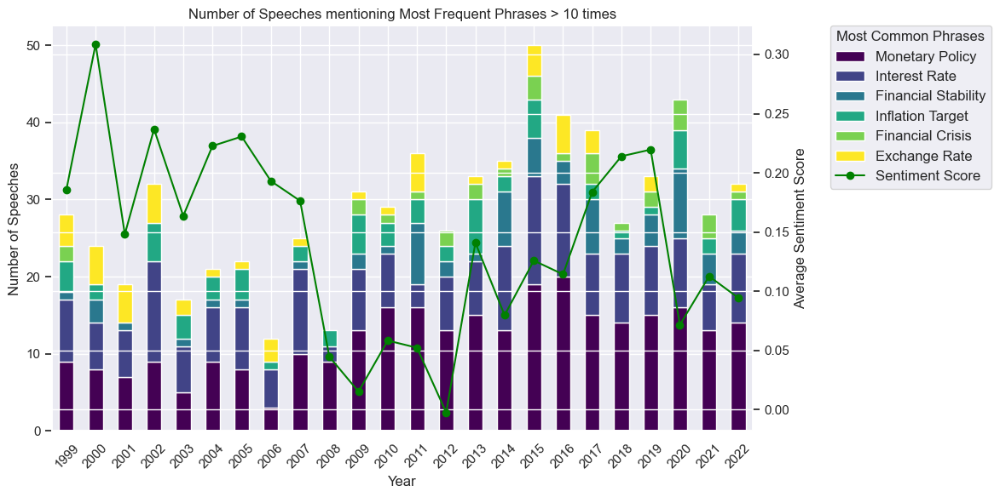

In [276]:
# Plot the stacked bar chart
ax = sentiment_by_topic_10_weighted[bigram_count].plot(
    kind='bar',
    stacked=True,
    figsize=(12, 6),
    color=colors,
    zorder=2  # Bars are on top
)

# Create secondary axis sharing the same x-axis
ax2 = ax.twinx()

# Plot the sentiment line
ax2.plot(
    range(len(sentiment_by_topic_10_weighted)),
    sentiment_by_topic_10_weighted['sentiment_lexicon_weighted'],
    color='green',
    marker='o',
    label='Sentiment Score',
    zorder=3  # Line is above bars
)

# Now, send the tick lines and spines of ax2 behind the bars

# Send the tick lines of ax2 behind
ax2.tick_params(zorder=1)  # Lower zorder so ticks are behind bars

# Send spines (border lines) of ax2 behind
for spine in ax2.spines.values():
    spine.set_zorder(1)

# Synchronize tick positions for better alignment (optional)
ax.set_xticks(range(len(sentiment_by_topic_10_weighted)))
ax.set_xticklabels(sentiment_by_topic_10_weighted['year'], rotation=45)

# Set labels
ax.set_xlabel('Year')
ax.set_ylabel('Number of Speeches')
ax2.set_ylabel('Average Sentiment Score')

# Title
plt.title('Number of Speeches mentioning Most Frequent Phrases > 10 times')

# Legend handles and labels
handles, labels = ax.get_legend_handles_labels()
line_handles, line_labels = ax2.get_legend_handles_labels()

# Combine legends
handles += line_handles
labels += line_labels

# Custom labels
custom_labels = ['Monetary Policy', 'Interest Rate', 'Financial Stability', 'Inflation Target', 'Financial Crisis', 'Exchange Rate', 'Sentiment Score']
labels = custom_labels

# Position legend to the right
ax.legend(handles, labels, loc='center left', bbox_to_anchor=(1.1, 0.8), fontsize=12, title='Most Common Phrases')

plt.tight_layout()
plt.show()

In [277]:
boe_indicators_1999_2022.columns

Index(['index', 'reference', 'country', 'date_format', 'year_month', 'year',
       'year_month_dt', 'title', 'author', 'is_gov', 'text', 'text_lemmatised',
       'text_lemmatised_str', 'word_count_original', 'word_count_cleaned',
       'sentiment_lexicon_simple', 'sentiment_lexicon_simple_std',
       'sentiment_lexicon_weighted', 'sentiment_lexicon_weighted_std',
       'uk_inflation_rate_CPIH', 'uk_unemployment_rate', 'uk_gdp_growth',
       'uk_interest_rate', 'uk_consumer_confidence', 'gbp_usd_fx', 'ftse_250',
       'gilts_short ', 'gilts_medium ', 'gilts_long ',
       'uk_credit_growth_no_cc', 'uk_credit_growth_only_cc',
       'avg_price_all_property_types', 'gov_label', 'monetary policy',
       'interest rate', 'financial stability', 'inflation target',
       'financial crisis', 'exchange rate'],
      dtype='object')

In [278]:
boe_indicators_1999_2022.head()

,index,reference,country,date_format,year_month,year,year_month_dt,title,author,is_gov,...,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types,gov_label,monetary policy,interest rate,financial stability,inflation target,financial crisis,exchange rate
0,8,r990112a_BOE,united kingdom,1999-01-12,1999-01,1999,1999-01-01,Speech,george,1,...,13.5,26.1,67157,Governor,7,1,0,1,0,7
1,9,r990118a_BOE,united kingdom,1999-01-18,1999-01,1999,1999-01-01,Speech,george,1,...,13.5,26.1,67157,Governor,8,4,0,2,0,5
2,10,r990201a_BOE,united kingdom,1999-02-01,1999-02,1999,1999-02-01,Speech,george,1,...,13.2,26.1,67157,Governor,8,1,0,0,0,4
3,11,r990210a_BOE,united kingdom,1999-02-10,1999-02,1999,1999-02-01,Speech,george,1,...,13.2,26.1,67157,Governor,2,1,0,0,0,3
4,12,r990218a_BOE,united kingdom,1999-02-18,1999-02,1999,1999-02-01,The Chancellor's Lecture,george,1,...,13.2,26.1,67157,Governor,21,8,0,9,0,7


**Monthly Analysis**

In [280]:
monetary_policy_10_avg_monthly = boe_monetary_policy_10.groupby('year_month')['sentiment_lexicon_weighted'].mean().reset_index()
monetary_policy_10_avg_monthly.rename(columns={'sentiment_lexicon_weighted': 'Monetary Policy'}, inplace=True)

In [281]:
interest_rate_10_avg_monthly = boe_interest_rate_10.groupby('year_month')['sentiment_lexicon_weighted'].mean().reset_index()
interest_rate_10_avg_monthly.rename(columns={'sentiment_lexicon_weighted': 'Interest Rate'}, inplace=True)

In [282]:
financial_stability_10_avg_monthly = boe_financial_stability_10.groupby('year_month')['sentiment_lexicon_weighted'].mean().reset_index()
financial_stability_10_avg_monthly.rename(columns={'sentiment_lexicon_weighted': 'Financial Stability'}, inplace=True)

In [283]:
inflation_target_10_avg_monthly = boe_inflation_target_10.groupby('year_month')['sentiment_lexicon_weighted'].mean().reset_index()
inflation_target_10_avg_monthly.rename(columns={'sentiment_lexicon_weighted': 'Inflation Target'}, inplace=True)

In [284]:
financial_crisis_10_avg_monthly = boe_financial_crisis_10.groupby('year_month')['sentiment_lexicon_weighted'].mean().reset_index()
financial_crisis_10_avg_monthly.rename(columns={'sentiment_lexicon_weighted': 'Financial Crisis'}, inplace=True)

In [285]:
exchange_rate_10_avg_monthly = boe_exchange_rate_10.groupby('year_month')['sentiment_lexicon_weighted'].mean().reset_index()
exchange_rate_10_avg_monthly.rename(columns={'sentiment_lexicon_weighted': 'Exchange Rate'}, inplace=True)

In [286]:
# List of DataFrames to merge
dataframes_to_merge = [interest_rate_10_avg_monthly, financial_stability_10_avg_monthly, inflation_target_10_avg_monthly, \
                       financial_crisis_10_avg_monthly, exchange_rate_10_avg_monthly]

# Use reduce to merge all DataFrames in the list
sentiment_by_topic_10 = reduce(lambda left, right: left.merge(right, on='year_month', how='left'), dataframes_to_merge, monetary_policy_10_avg_monthly)

# View the merged DataFrame
sentiment_by_topic_10.head()

,year_month,Monetary Policy,Interest Rate,Financial Stability,Inflation Target,Financial Crisis,Exchange Rate
0,1999-02,0.128282,NaN,NaN,NaN,NaN,NaN
1,1999-05,0.284198,0.260120,NaN,0.226989,NaN,0.271426
2,1999-08,0.072426,-0.062067,NaN,0.072426,-0.196560,0.072426
3,1999-09,0.117412,0.104745,NaN,0.117412,-0.060684,0.092079
4,1999-10,0.299559,0.218548,NaN,NaN,NaN,NaN


In [289]:
# Filter for months before and after global financial crisis
sentiment_by_topic_10_crisis = sentiment_by_topic_10[(sentiment_by_topic_10['year_month'] >= '2008-03') & (sentiment_by_topic_10['year_month'] <= '2009-03')].reset_index()

# View the DataFrame
sentiment_by_topic_10_crisis 

,index,year_month,Monetary Policy,Interest Rate,Financial Stability,Inflation Target,Financial Crisis,Exchange Rate
0,50,2008-04,0.206588,0.029045,NaN,-0.043750,NaN,NaN
1,51,2008-07,0.425000,NaN,NaN,NaN,NaN,NaN
2,52,2008-09,0.138525,NaN,NaN,0.029063,NaN,NaN
3,53,2008-10,-0.041121,NaN,NaN,NaN,NaN,NaN
4,54,2008-11,0.047234,NaN,NaN,NaN,NaN,NaN
5,55,2008-12,0.210989,NaN,NaN,NaN,NaN,NaN
6,56,2009-01,-0.187168,NaN,NaN,NaN,NaN,NaN
7,57,2009-02,-0.148912,-0.114810,0.043064,0.043064,NaN,NaN
8,58,2009-03,-0.085071,0.052492,0.098030,NaN,NaN,0.052492


In [293]:
# Filter for months before and after brexit
sentiment_by_topic_10_brexit = sentiment_by_topic_10[(sentiment_by_topic_10['year_month'] >= '2016-01') & (sentiment_by_topic_10['year_month'] <= '2016-12')].reset_index()

# View the DataFrame
sentiment_by_topic_10_brexit 

,index,year_month,Monetary Policy,Interest Rate,Financial Stability,Inflation Target,Financial Crisis,Exchange Rate
0,117,2016-01,0.153123,0.119730,NaN,NaN,NaN,NaN
1,118,2016-02,0.123574,0.087197,NaN,NaN,NaN,NaN
2,119,2016-03,0.118213,0.118213,0.257525,NaN,NaN,-0.102461
3,120,2016-04,0.188889,NaN,0.065217,NaN,NaN,NaN
4,121,2016-05,0.083379,-0.052875,0.248901,NaN,NaN,NaN
5,122,2016-07,0.080171,0.060113,NaN,NaN,NaN,0.060113
6,123,2016-08,0.286188,NaN,NaN,NaN,NaN,NaN
7,124,2016-09,0.263137,NaN,NaN,NaN,0.127202,NaN
8,125,2016-10,0.096571,NaN,NaN,NaN,NaN,NaN
9,126,2016-11,0.108820,0.093684,NaN,NaN,NaN,0.050489


In [294]:
# Filter for months before and after covid
sentiment_by_topic_10_covid = sentiment_by_topic_10[(sentiment_by_topic_10['year_month'] >= '2019-09') & (sentiment_by_topic_10['year_month'] <= '2020-09')].reset_index()

# View the DataFrame
sentiment_by_topic_10_covid

,index,year_month,Monetary Policy,Interest Rate,Financial Stability,Inflation Target,Financial Crisis,Exchange Rate
0,151,2019-10,0.037891,0.056195,0.084890,NaN,NaN,0.001282
1,152,2019-12,0.102795,NaN,NaN,NaN,NaN,NaN
2,153,2020-01,0.103605,0.158861,0.320183,0.158861,NaN,NaN
3,154,2020-02,0.100943,0.100943,0.185577,NaN,NaN,NaN
4,155,2020-03,0.050546,-0.081283,0.163841,-0.081283,NaN,NaN
5,156,2020-04,-0.109050,-0.109050,NaN,-0.109050,NaN,NaN
6,157,2020-05,-0.113033,NaN,NaN,NaN,NaN,NaN
7,158,2020-08,0.112422,NaN,NaN,NaN,NaN,NaN
8,159,2020-09,0.148287,-0.108119,-0.000458,NaN,-0.168808,NaN


**Calculation of count**

In [296]:
boe_indicators_1999_2022.describe()

,index,date_format,year,year_month_dt,is_gov,word_count_original,word_count_cleaned,sentiment_lexicon_simple,sentiment_lexicon_simple_std,sentiment_lexicon_weighted,...,gilts_long,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types,monetary policy,interest rate,financial stability,inflation target,financial crisis,exchange rate
count,1201.000000,1201,1201.000000,1201,1201.000000,1201.000000,1201.000000,1201.000000,1201.000000,1201.000000,...,1201.000000,1201.000000,1201.000000,1201.000000,1201.000000,1201.000000,1201.000000,1201.000000,1201.000000,1201.000000
mean,608.000000,2012-11-20 07:12:50.358034944,2012.397169,2012-11-04 02:03:29.825145600,0.200666,4280.969192,2412.530391,-0.083511,-0.334396,0.130766,...,3.072011,5.637968,6.762781,172266.033306,7.269775,6.027477,2.439634,2.383014,1.970025,2.051624
min,8.000000,1999-01-12 00:00:00,1999.000000,1999-01-01 00:00:00,0.000000,231.000000,121.000000,-0.532051,-2.838660,-0.423899,...,0.596199,-4.800000,-20.700000,67157.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,308.000000,2008-07-15 00:00:00,2008.000000,2008-07-01 00:00:00,0.000000,2562.000000,1405.000000,-0.184971,-0.900863,-0.005789,...,1.872535,0.000000,3.600000,153306.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,608.000000,2013-12-11 00:00:00,2013.000000,2013-12-01 00:00:00,0.000000,3674.000000,2047.000000,-0.098958,-0.420642,0.110776,...,3.160957,6.800000,5.500000,169800.000000,3.000000,2.000000,0.000000,0.000000,1.000000,0.000000
75%,908.000000,2018-02-26 00:00:00,2018.000000,2018-02-01 00:00:00,0.000000,5015.000000,2815.000000,-0.002985,0.115190,0.236519,...,4.340346,10.500000,9.100000,207385.000000,10.000000,7.000000,3.000000,3.000000,3.000000,1.000000
max,1208.000000,2022-10-20 00:00:00,2022.000000,2022-10-01 00:00:00,1.000000,37522.000000,23119.000000,0.628571,3.641258,1.025714,...,5.030000,14.600000,26.100000,265727.000000,133.000000,130.000000,95.000000,44.000000,30.000000,139.000000
std,346.843144,NaN,6.414667,NaN,0.400666,3195.407040,1924.344932,0.151936,0.848278,0.201263,...,1.278984,5.412168,8.219756,43799.628002,11.106927,11.649181,5.521162,5.015959,3.204284,7.258145


In [297]:
boe_indicators_1999_2022

,index,reference,country,date_format,year_month,year,year_month_dt,title,author,is_gov,...,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types,gov_label,monetary policy,interest rate,financial stability,inflation target,financial crisis,exchange rate
0,8,r990112a_BOE,united kingdom,1999-01-12,1999-01,1999,1999-01-01,Speech,george,1,...,13.5,26.1,67157,Governor,7,1,0,1,0,7
1,9,r990118a_BOE,united kingdom,1999-01-18,1999-01,1999,1999-01-01,Speech,george,1,...,13.5,26.1,67157,Governor,8,4,0,2,0,5
2,10,r990201a_BOE,united kingdom,1999-02-01,1999-02,1999,1999-02-01,Speech,george,1,...,13.2,26.1,67157,Governor,8,1,0,0,0,4
3,11,r990210a_BOE,united kingdom,1999-02-10,1999-02,1999,1999-02-01,Speech,george,1,...,13.2,26.1,67157,Governor,2,1,0,0,0,3
4,12,r990218a_BOE,united kingdom,1999-02-18,1999-02,1999,1999-02-01,The Chancellor's Lecture,george,1,...,13.2,26.1,67157,Governor,21,8,0,9,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1196,1204,r221007a_BOE,united kingdom,2022-10-07,2022-10,2022,2022-10-01,"Shocks, inflation, and the policy response",ramsden,0,...,5.1,11.5,265693,Non-Governor,12,2,1,0,0,2
1197,1205,r221012a_BOE,united kingdom,2022-10-12,2022-10,2022,2022-10-01,Monetary policy: an anchor in challenging times,pill,0,...,5.1,11.5,265693,Non-Governor,35,0,6,8,0,0
1198,1206,r221015a_BOE,united kingdom,2022-10-15,2022-10,2022,2022-10-01,Monetary policy and financial stability interv...,bailey,1,...,5.1,11.5,265693,Governor,10,2,6,2,0,0
1199,1207,r221019a_BOE,united kingdom,2022-10-19,2022-10,2022,2022-10-01,"Governance of “Decentralised” Finance: Get up,...",wilkins,0,...,5.1,11.5,265693,Non-Governor,0,0,0,0,0,0


In [298]:
# Filter for months before and after covid
boe_indicators_1999 = boe_indicators_1999_2022[(boe_indicators_1999_2022['year_month'] >= '1999-01') & (boe_indicators_1999_2022['year_month'] <= '1999-12')].reset_index()

boe_indicators_1999

,level_0,index,reference,country,date_format,year_month,year,year_month_dt,title,author,...,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types,gov_label,monetary policy,interest rate,financial stability,inflation target,financial crisis,exchange rate
0,0,8,r990112a_BOE,united kingdom,1999-01-12,1999-01,1999,1999-01-01,Speech,george,...,13.5,26.1,67157,Governor,7,1,0,1,0,7
1,1,9,r990118a_BOE,united kingdom,1999-01-18,1999-01,1999,1999-01-01,Speech,george,...,13.5,26.1,67157,Governor,8,4,0,2,0,5
2,2,10,r990201a_BOE,united kingdom,1999-02-01,1999-02,1999,1999-02-01,Speech,george,...,13.2,26.1,67157,Governor,8,1,0,0,0,4
3,3,11,r990210a_BOE,united kingdom,1999-02-10,1999-02,1999,1999-02-01,Speech,george,...,13.2,26.1,67157,Governor,2,1,0,0,0,3
4,4,12,r990218a_BOE,united kingdom,1999-02-18,1999-02,1999,1999-02-01,The Chancellor's Lecture,george,...,13.2,26.1,67157,Governor,21,8,0,9,0,7
5,5,13,r990224a_BOE,united kingdom,1999-02-24,1999-02,1999,1999-02-01,Speech,george,...,13.2,26.1,67157,Governor,14,7,0,7,0,4
6,6,14,r990301a_BOE,united kingdom,1999-03-01,1999-03,1999,1999-03-01,Speech,george,...,13.4,25.7,67157,Governor,1,0,0,0,0,0
7,7,15,r990323a_BOE,united kingdom,1999-03-23,1999-03,1999,1999-03-01,Inflation and growth in the service industries,julius,...,13.4,25.7,67157,Non-Governor,10,11,0,11,0,2
8,8,16,r990514a_BOE,united kingdom,1999-05-14,1999-05,1999,1999-05-01,Leading the way towards sustainable economic g...,george,...,12.9,24.7,70005,Governor,11,0,1,1,0,24
9,9,17,r990517a_BOE,united kingdom,1999-05-17,1999-05,1999,1999-05-01,MPC Two Years On,king,...,12.9,24.7,70005,Governor,16,22,0,18,0,3


## 4. Exploratory Analysis for Correlation with Economic Indicators

**Prepare the data**

In [306]:
# View the DataFrame
boe_speeches_1999_2022_yearly.head()

,year,sentiment_lexicon_simple,sentiment_lexicon_simple_std,sentiment_lexicon_weighted,sentiment_lexicon_weighted_std,uk_inflation_rate_CPIH,uk_unemployment_rate,uk_gdp_growth,uk_interest_rate,uk_consumer_confidence,gbp_usd_fx,ftse_250,gilts_short,gilts_medium,gilts_long,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types
0,1999,-0.051135,-0.153640,0.185937,-0.064958,1.294533,5.980000,1.006667,5.358333,0.156667,1.622406,5716.781754,5.326333,4.992667,4.592333,12.860000,23.380000,71727.166667
1,2000,0.037997,0.343998,0.308585,0.459943,0.784556,5.500000,0.830556,5.979167,-0.388889,1.529136,6501.639693,5.901389,5.305000,4.497778,11.297222,21.158333,81757.027778
2,2001,-0.087290,-0.355498,0.148234,-0.226316,1.219525,5.075000,0.520000,5.081250,0.140000,1.441217,6102.856224,5.014250,4.890250,4.604750,10.162500,18.155000,89094.600000
3,2002,-0.030069,-0.036025,0.236919,0.153231,1.379433,5.150000,0.546667,4.000000,1.103333,1.492741,5368.412391,4.844000,4.879000,4.696000,13.903333,18.436667,102983.866667
4,2003,-0.070092,-0.259477,0.163706,-0.160098,1.371211,5.042105,0.805263,3.697368,-5.457895,1.626196,4854.418901,4.171186,4.456977,4.579004,12.215789,20.236842,119253.421053


### 4.1. Plot the data

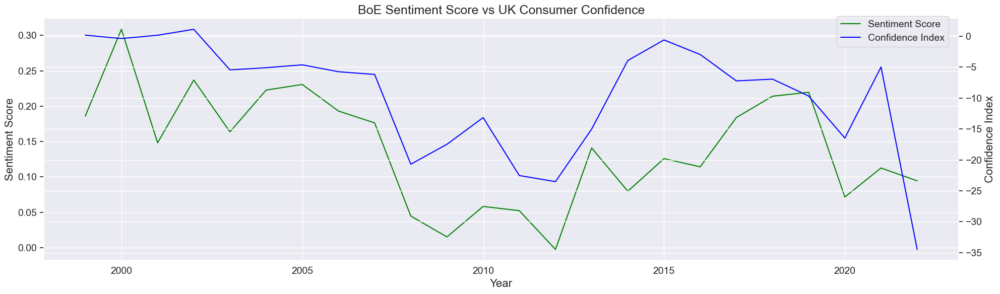

In [315]:
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(20, 6))

# Plot sentiment score on primary y-axis.
ax1.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly['sentiment_lexicon_weighted'], color='green', label='Sentiment Score')
ax1.set_xlabel('Year',fontsize=16)
ax1.set_ylabel('Sentiment Score', fontsize=16)
ax1.tick_params(axis='both', which='major', labelsize=14)

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot consumer confidence on secondary y-axis
ax2.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly['uk_consumer_confidence'], color='blue', label='Confidence Index')
ax2.set_ylabel('Confidence Index', fontsize=16)
ax2.tick_params(axis='both', which='major', labelsize=14)

# Add title and legend
plt.title('BoE Sentiment Score vs UK Consumer Confidence', fontsize=18)
fig.legend(loc='upper right', bbox_to_anchor=(0.95, 0.95), fontsize=14)

# Display the chart
plt.tight_layout()
plt.show()

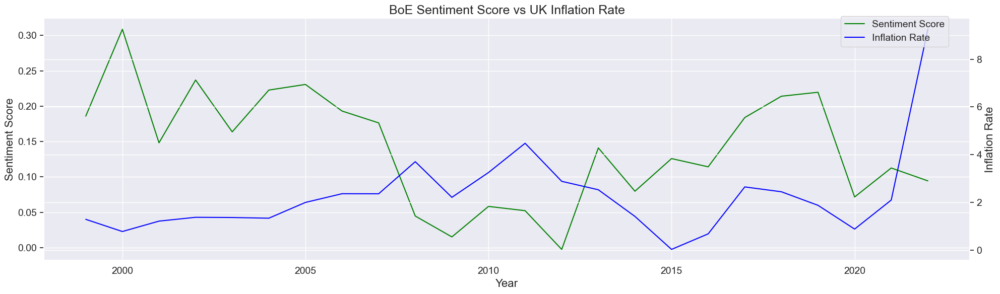

In [316]:
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(20, 6))

# Plot sentiment score on primary y-axis.
ax1.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly['sentiment_lexicon_weighted'], color='green', label='Sentiment Score')
ax1.set_xlabel('Year', fontsize=16)
ax1.set_ylabel('Sentiment Score', fontsize=16)
ax1.tick_params(axis='both', which='major', labelsize=14)

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot inflation on secondary y-axis
ax2.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly['uk_inflation_rate_CPIH'], color='blue', label='Inflation Rate')
ax2.set_ylabel('Inflation Rate', fontsize=16)
ax2.tick_params(axis='both', which='major', labelsize=14)

# Add title and legend
plt.title('BoE Sentiment Score vs UK Inflation Rate', fontsize=18)
fig.legend(loc='upper right', bbox_to_anchor=(0.95, 0.95), fontsize=14)

# Display the chart
plt.tight_layout()
plt.show()

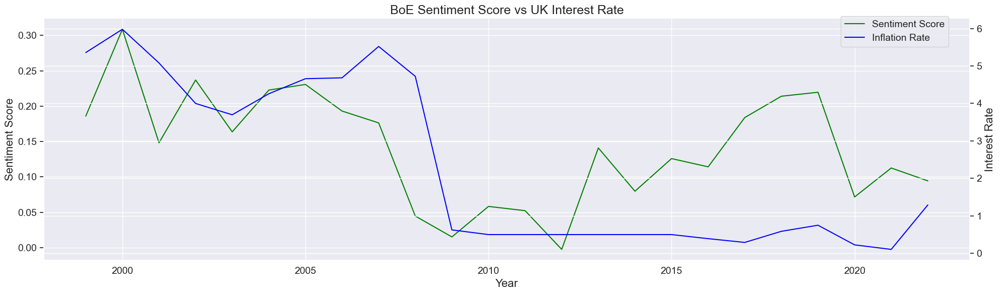

In [317]:
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(20, 6))

# Plot sentiment score on primary y-axis.
ax1.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly['sentiment_lexicon_weighted'], color='green', label='Sentiment Score')
ax1.set_xlabel('Year', fontsize=16)
ax1.set_ylabel('Sentiment Score', fontsize=16)
ax1.tick_params(axis='both', which='major', labelsize=14)

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot inflation on secondary y-axis
ax2.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly['uk_interest_rate'], color='blue', label='Inflation Rate')
ax2.set_ylabel('Interest Rate', fontsize=16)
ax2.tick_params(axis='both', which='major', labelsize=14)

# Add title and legend
plt.title('BoE Sentiment Score vs UK Interest Rate', fontsize=18)
fig.legend(loc='upper right', bbox_to_anchor=(0.95, 0.95), fontsize=14)

# Display the chart
plt.tight_layout()
plt.show()

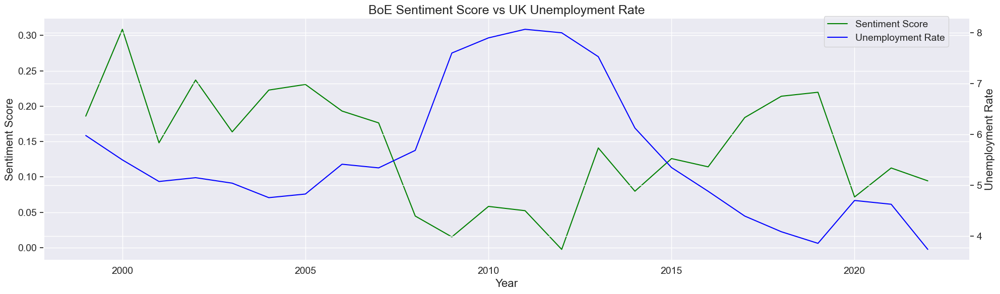

In [318]:
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(20, 6))

# Plot sentiment score on primary y-axis.
ax1.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly['sentiment_lexicon_weighted'], color='green', label='Sentiment Score')
ax1.set_xlabel('Year', fontsize=16)
ax1.set_ylabel('Sentiment Score', fontsize=16)
ax1.tick_params(axis='both', which='major', labelsize=14)

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot unemployment on secondary y-axis
ax2.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly['uk_unemployment_rate'], color='blue', label='Unemployment Rate')
ax2.set_ylabel('Unemployment Rate', fontsize=16)
ax2.tick_params(axis='both', which='major', labelsize=14)

# Add title and legend
plt.title('BoE Sentiment Score vs UK Unemployment Rate', fontsize=18)
fig.legend(loc='upper right', bbox_to_anchor=(0.95, 0.95), fontsize=14)

# Display the chart
plt.tight_layout()
plt.show()

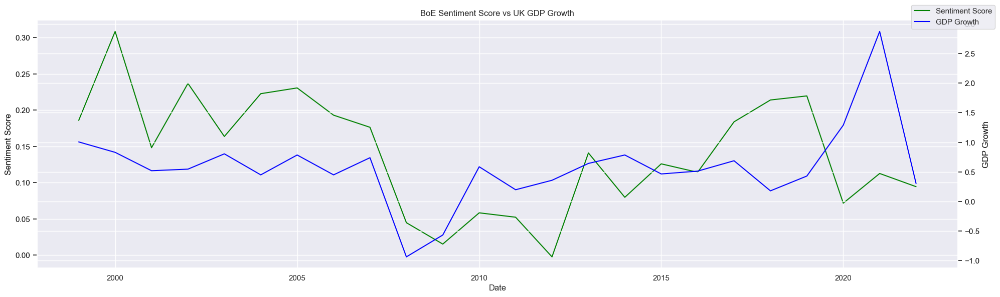

In [319]:
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(20, 6))

# Plot sentiment score on primary y-axis.
ax1.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly['sentiment_lexicon_weighted'], color='green', label='Sentiment Score')
ax1.set_xlabel('Date')
ax1.set_ylabel('Sentiment Score', color='black')
ax1.tick_params(axis='y', labelcolor='black')

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot GDP on secondary y-axis
ax2.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly['uk_gdp_growth'], color='blue', label='GDP Growth')
ax2.set_ylabel('GDP Growth', color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Add title and legend
plt.title('BoE Sentiment Score vs UK GDP Growth')
fig.legend(loc='upper right', bbox_to_anchor=(1, 1))

# Display the chart
plt.tight_layout()
plt.show()

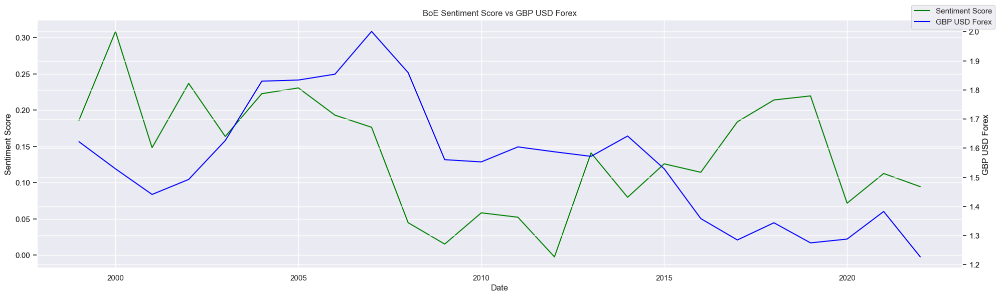

In [320]:
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(20, 6))

# Plot sentiment score on primary y-axis.
ax1.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly['sentiment_lexicon_weighted'], color='green', label='Sentiment Score')
ax1.set_xlabel('Date')
ax1.set_ylabel('Sentiment Score', color='black')
ax1.tick_params(axis='y', labelcolor='black')

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot GBP USD exchange rate on secondary y-axis
ax2.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly['gbp_usd_fx'], color='blue', label='GBP USD Forex')
ax2.set_ylabel('GBP USD Forex', color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Add title and legend
plt.title('BoE Sentiment Score vs GBP USD Forex')
fig.legend(loc='upper right', bbox_to_anchor=(1, 1))

# Display the chart
plt.tight_layout()
plt.show()

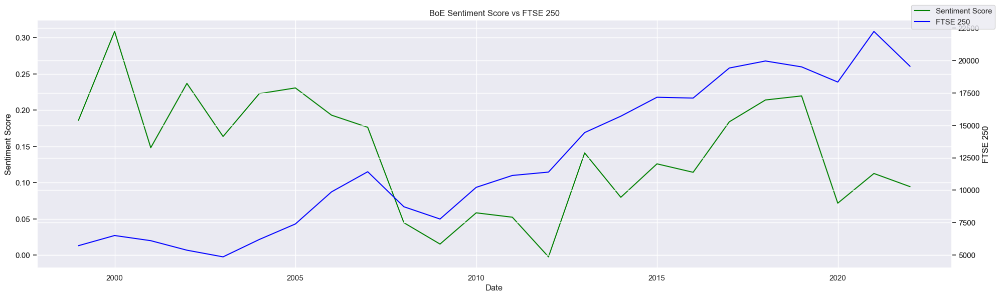

In [321]:
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(20, 6))

# Plot sentiment score on primary y-axis.
ax1.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly['sentiment_lexicon_weighted'], color='green', label='Sentiment Score')
ax1.set_xlabel('Date')
ax1.set_ylabel('Sentiment Score', color='black')
ax1.tick_params(axis='y', labelcolor='black')

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot FTSE 250 on secondary y-axis
ax2.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly['ftse_250'], color='blue', label='FTSE 250')
ax2.set_ylabel('FTSE 250', color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Add title and legend
plt.title('BoE Sentiment Score vs FTSE 250')
fig.legend(loc='upper right', bbox_to_anchor=(1, 1))

# Display the chart
plt.tight_layout()
plt.show()

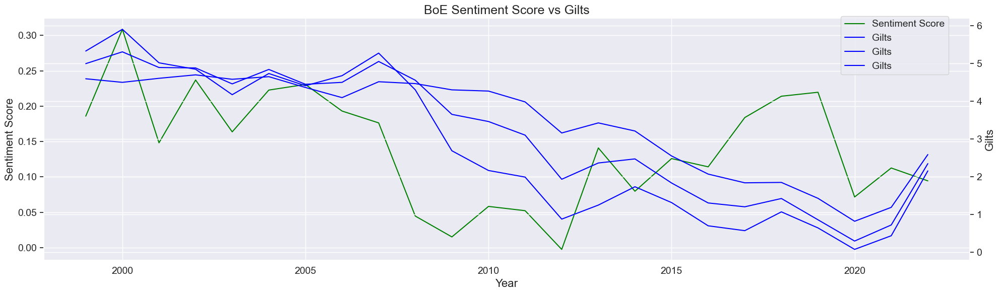

In [322]:
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(20, 6))

# Plot sentiment score on primary y-axis.
ax1.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly['sentiment_lexicon_weighted'], color='green', label='Sentiment Score')
ax1.set_xlabel('Year', fontsize=16)
ax1.set_ylabel('Sentiment Score', fontsize=16)
ax1.tick_params(axis='both', which='major', labelsize=14)

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot gilts on secondary y-axis
ax2.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly[['gilts_short ', 'gilts_medium ', 'gilts_long ']], color='blue', label='Gilts')
ax2.set_ylabel('Gilts', fontsize=16)
ax2.tick_params(axis='both', which='major', labelsize=14)

# Add title and legend
plt.title('BoE Sentiment Score vs Gilts', fontsize=18)
fig.legend(loc='upper right', bbox_to_anchor=(0.95, 0.95), fontsize=14)

# Display the chart
plt.tight_layout()
plt.show()

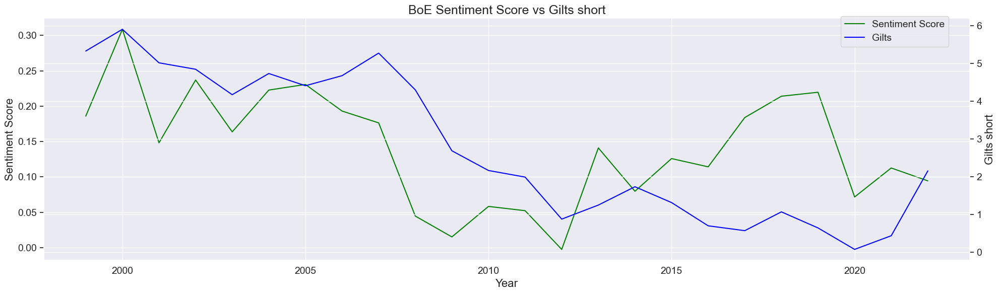

In [323]:
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(20, 6))

# Plot sentiment score on primary y-axis.
ax1.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly['sentiment_lexicon_weighted'], color='green', label='Sentiment Score')
ax1.set_xlabel('Year', fontsize=16)
ax1.set_ylabel('Sentiment Score', fontsize=16)
ax1.tick_params(axis='both', which='major', labelsize=14)

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot gilts on secondary y-axis
ax2.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly[['gilts_short ']], color='blue', label='Gilts')
ax2.set_ylabel('Gilts short', fontsize=16)
ax2.tick_params(axis='both', which='major', labelsize=14)

# Add title and legend
plt.title('BoE Sentiment Score vs Gilts short', fontsize=18)
fig.legend(loc='upper right', bbox_to_anchor=(0.95, 0.95), fontsize=14)

# Display the chart
plt.tight_layout()
plt.show()

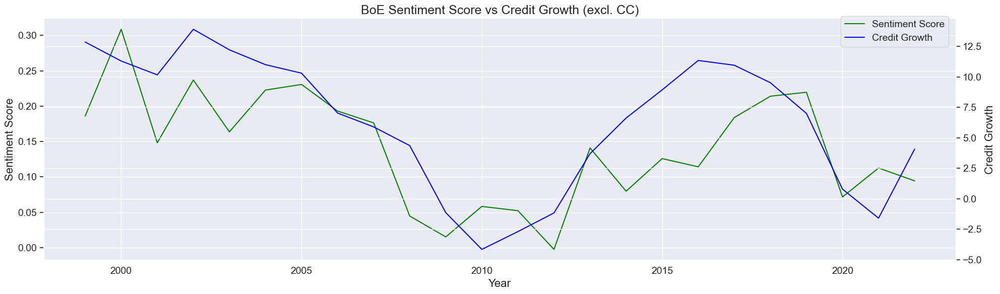

In [324]:
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(20, 6))

# Plot sentiment score on primary y-axis.
ax1.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly['sentiment_lexicon_weighted'], color='green', label='Sentiment Score')
ax1.set_xlabel('Year', fontsize=16)
ax1.set_ylabel('Sentiment Score', fontsize=16)
ax1.tick_params(axis='both', which='major', labelsize=14)

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot credit growth on secondary y-axis
ax2.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly[['uk_credit_growth_no_cc']], color='blue', label='Credit Growth')
ax2.set_ylabel('Credit Growth', fontsize=16)
ax2.tick_params(axis='both', which='major', labelsize=14)

# Add title and legend
plt.title('BoE Sentiment Score vs Credit Growth (excl. CC)', fontsize=18)
fig.legend(loc='upper right', bbox_to_anchor=(0.95, 0.95), fontsize=14)

# Display the chart
plt.tight_layout()
plt.show()

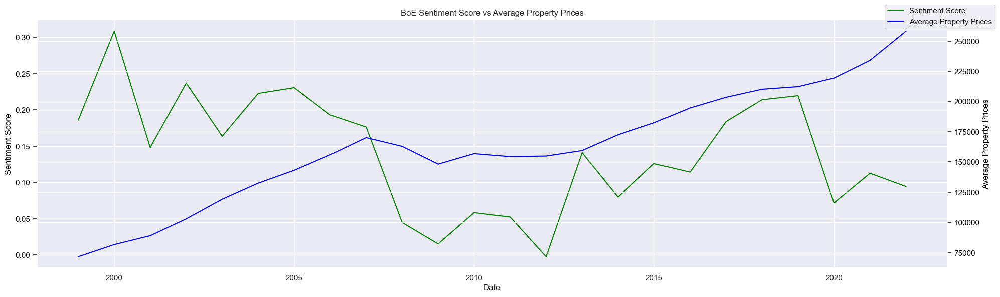

In [325]:
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(20, 6))

# Plot sentiment score on primary y-axis.
ax1.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly['sentiment_lexicon_weighted'], color='green', label='Sentiment Score')
ax1.set_xlabel('Date')
ax1.set_ylabel('Sentiment Score', color='black')
ax1.tick_params(axis='y', labelcolor='black')

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot Property Prices on secondary y-axis
ax2.plot(boe_speeches_1999_2022_yearly['year'], boe_speeches_1999_2022_yearly['avg_price_all_property_types'], color='blue', label='Average Property Prices')
ax2.set_ylabel('Average Property Prices', color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Add title and legend
plt.title('BoE Sentiment Score vs Average Property Prices')
fig.legend(loc='upper right', bbox_to_anchor=(1, 1))

# Display the chart
plt.tight_layout()
plt.show()

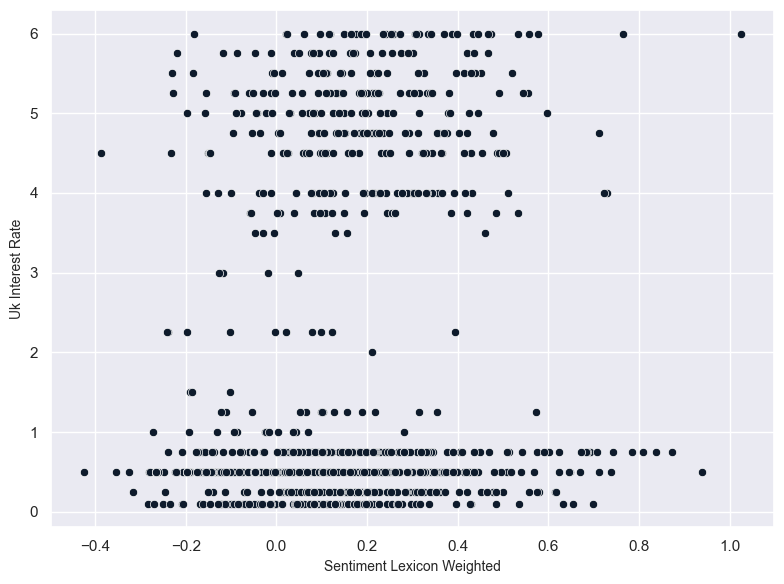

In [326]:
# Define function for scatterplot.
generate_scatterplot(boe_indicators_1999_2022, x_axis='sentiment_lexicon_weighted', \
                     y_axis='uk_interest_rate', title=None, hue=None, save_path=None)

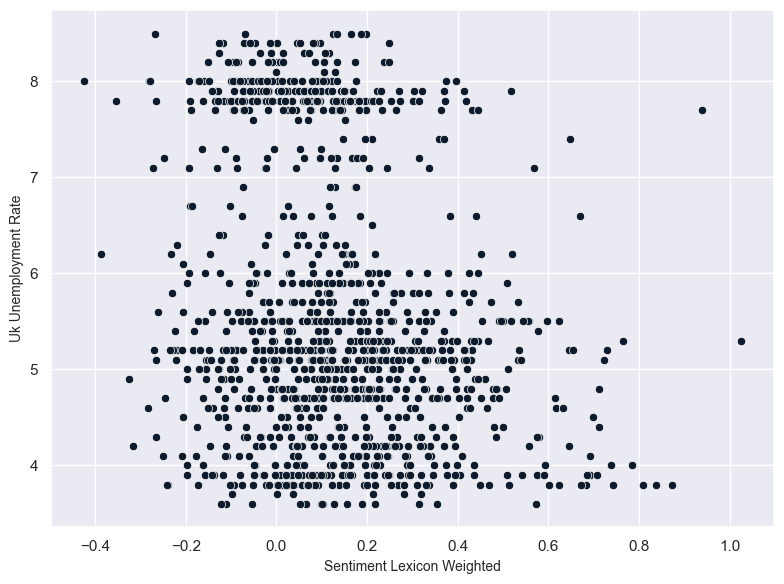

In [327]:
# Define function for scatterplot.
generate_scatterplot(boe_indicators_1999_2022, x_axis='sentiment_lexicon_weighted', \
                     y_axis='uk_unemployment_rate', title=None, hue=None, save_path=None)

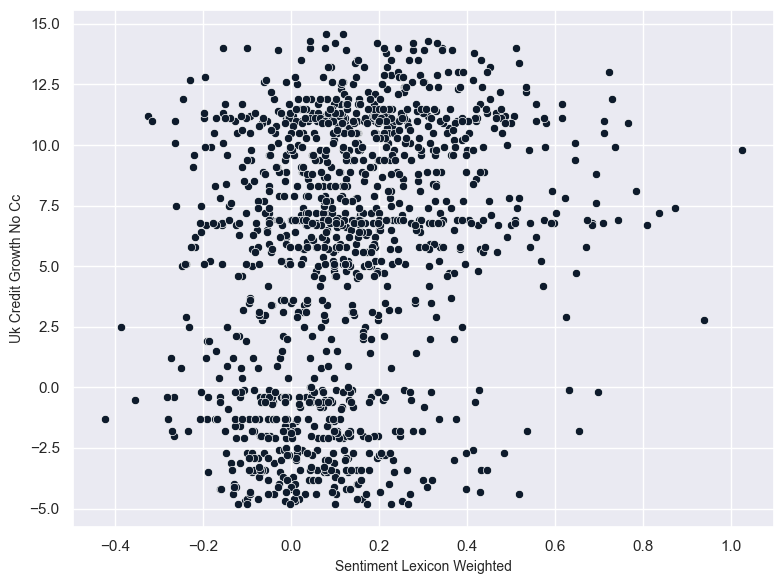

In [328]:
# Define function for scatterplot.
generate_scatterplot(boe_indicators_1999_2022, x_axis='sentiment_lexicon_weighted', \
                     y_axis='uk_credit_growth_no_cc', title=None, hue=None, save_path=None)

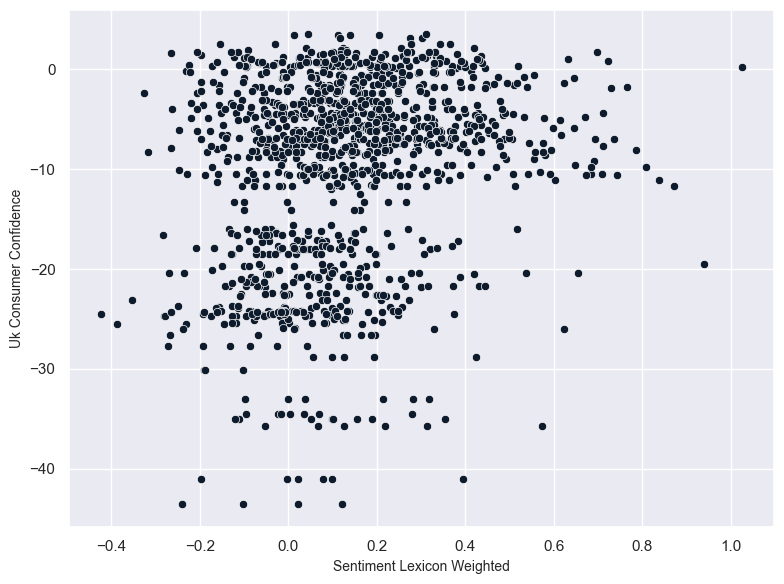

In [329]:
# Define function for scatterplot.
generate_scatterplot(boe_indicators_1999_2022, x_axis='sentiment_lexicon_weighted', \
                     y_axis='uk_consumer_confidence', title=None, hue=None, save_path=None)

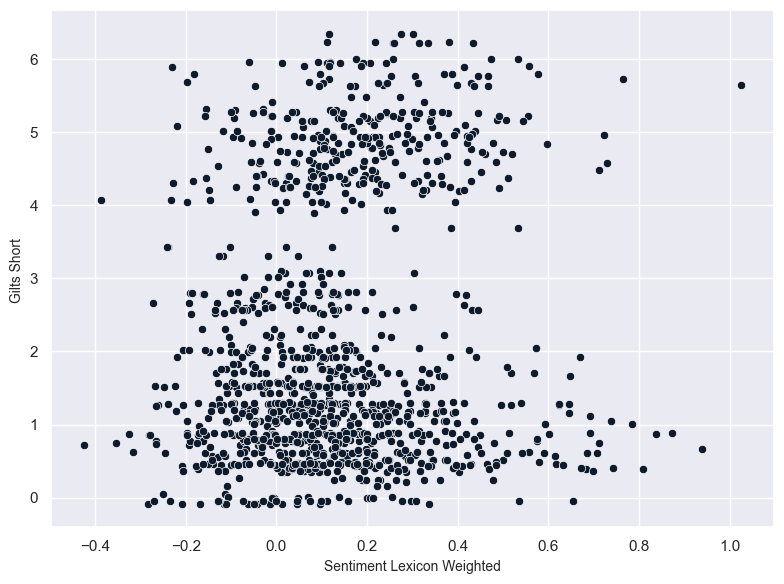

In [330]:
# Define function for scatterplot.
generate_scatterplot(boe_indicators_1999_2022, x_axis='sentiment_lexicon_weighted', \
                     y_axis='gilts_short ', title=None, hue=None, save_path=None)

### 4.3. Initial statistical analysis

In [332]:
boe_indicators_1999_2022.columns

Index(['index', 'reference', 'country', 'date_format', 'year_month', 'year',
       'year_month_dt', 'title', 'author', 'is_gov', 'text', 'text_lemmatised',
       'text_lemmatised_str', 'word_count_original', 'word_count_cleaned',
       'sentiment_lexicon_simple', 'sentiment_lexicon_simple_std',
       'sentiment_lexicon_weighted', 'sentiment_lexicon_weighted_std',
       'uk_inflation_rate_CPIH', 'uk_unemployment_rate', 'uk_gdp_growth',
       'uk_interest_rate', 'uk_consumer_confidence', 'gbp_usd_fx', 'ftse_250',
       'gilts_short ', 'gilts_medium ', 'gilts_long ',
       'uk_credit_growth_no_cc', 'uk_credit_growth_only_cc',
       'avg_price_all_property_types', 'gov_label', 'monetary policy',
       'interest rate', 'financial stability', 'inflation target',
       'financial crisis', 'exchange rate'],
      dtype='object')

**4.3.a. Simple Correlation**

In [350]:
# Create a pairplot for sentiment score and all economic indicators.
columns_sentiment = ['sentiment_lexicon_weighted', 'uk_inflation_rate_CPIH', 'uk_unemployment_rate', 'uk_gdp_growth',
                             'uk_interest_rate', 'uk_consumer_confidence', 'gbp_usd_fx', 'ftse_250', 'gilts_short ', 
                             'gilts_medium ', 'gilts_long ', 'uk_credit_growth_no_cc', 'uk_credit_growth_only_cc',
                             'avg_price_all_property_types']

# Correlation matrix for GPT sentiment score with all economic indicators
correlation_matrix = boe_indicators_1999_2022[columns_sentiment].corr()

# Display the correlation matrix
correlation_matrix

,sentiment_lexicon_weighted,uk_inflation_rate_CPIH,uk_unemployment_rate,uk_gdp_growth,uk_interest_rate,uk_consumer_confidence,gbp_usd_fx,ftse_250,gilts_short,gilts_medium,gilts_long,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types
sentiment_lexicon_weighted,1.000000,-0.104204,-0.225410,-0.004311,0.174087,0.227090,-0.016912,0.008450,0.130711,0.073204,-0.003406,0.268314,0.202940,-0.064152
uk_inflation_rate_CPIH,-0.104204,1.000000,0.068780,-0.055230,-0.068382,-0.751667,-0.116537,0.082065,0.007991,0.058791,0.094493,-0.351269,0.027402,0.312572
uk_unemployment_rate,-0.225410,0.068780,1.000000,-0.022817,-0.132020,-0.328989,0.432897,-0.476529,0.059011,0.269274,0.501543,-0.598028,-0.166134,-0.457715
uk_gdp_growth,-0.004311,-0.055230,-0.022817,1.000000,-0.036445,0.134087,-0.026668,0.100771,-0.058929,-0.075988,-0.095096,-0.058439,-0.108145,0.072084
uk_interest_rate,0.174087,-0.068382,-0.132020,-0.036445,1.000000,0.272763,0.558141,-0.701929,0.933504,0.844068,0.680241,0.431416,0.623204,-0.655460
uk_consumer_confidence,0.227090,-0.751667,-0.328989,0.134087,0.272763,1.000000,0.117861,-0.035879,0.226003,0.139276,0.023216,0.624583,0.304241,-0.302006
gbp_usd_fx,-0.016912,-0.116537,0.432897,-0.026668,0.558141,0.117861,1.000000,-0.618209,0.623467,0.692880,0.719304,-0.044872,0.158042,-0.525244
ftse_250,0.008450,0.082065,-0.476529,0.100771,-0.701929,-0.035879,-0.618209,1.000000,-0.803435,-0.874136,-0.901670,-0.076615,-0.554166,0.901359
gilts_short,0.130711,0.007991,0.059011,-0.058929,0.933504,0.226003,0.623467,-0.803435,1.000000,0.967419,0.852183,0.324770,0.655139,-0.738138
gilts_medium,0.073204,0.058791,0.269274,-0.075988,0.844068,0.139276,0.692880,-0.874136,0.967419,1.000000,0.952780,0.198521,0.628655,-0.791667


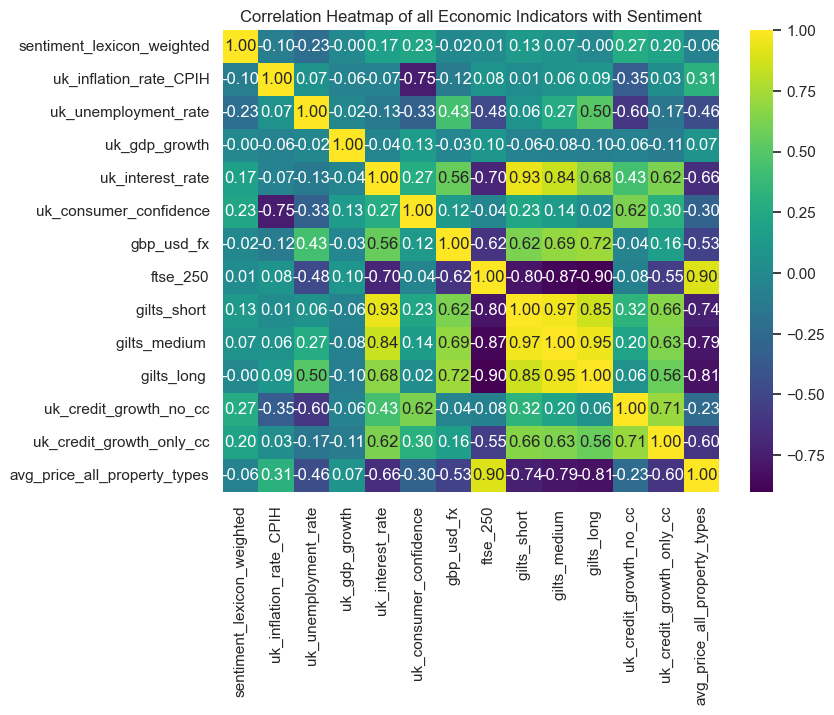

In [351]:
# Heatmap of the correlation matrix for GPT sentiment score with all economic indicators
plt.figure(figsize=(8, 6)) 
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='viridis', cbar=True)

# Customize title and labels
plt.title('Correlation Heatmap of all Economic Indicators with Sentiment')
plt.show()

In [352]:
# Create a pairplot for GPT sentiment score and price/ inflation indicators
columns_sentiment_price = ['sentiment_lexicon_weighted', 'uk_inflation_rate_CPIH', 'uk_interest_rate',
                             'avg_price_all_property_types']

# Correlation matrix for GPT sentiment score with price/ inflation indicators
correlation_matrix_price = boe_indicators_1999_2022[columns_sentiment_price].corr()

# Display the correlation matrix
correlation_matrix_price

,sentiment_lexicon_weighted,uk_inflation_rate_CPIH,uk_interest_rate,avg_price_all_property_types
sentiment_lexicon_weighted,1.000000,-0.104204,0.174087,-0.064152
uk_inflation_rate_CPIH,-0.104204,1.000000,-0.068382,0.312572
uk_interest_rate,0.174087,-0.068382,1.000000,-0.655460
avg_price_all_property_types,-0.064152,0.312572,-0.655460,1.000000


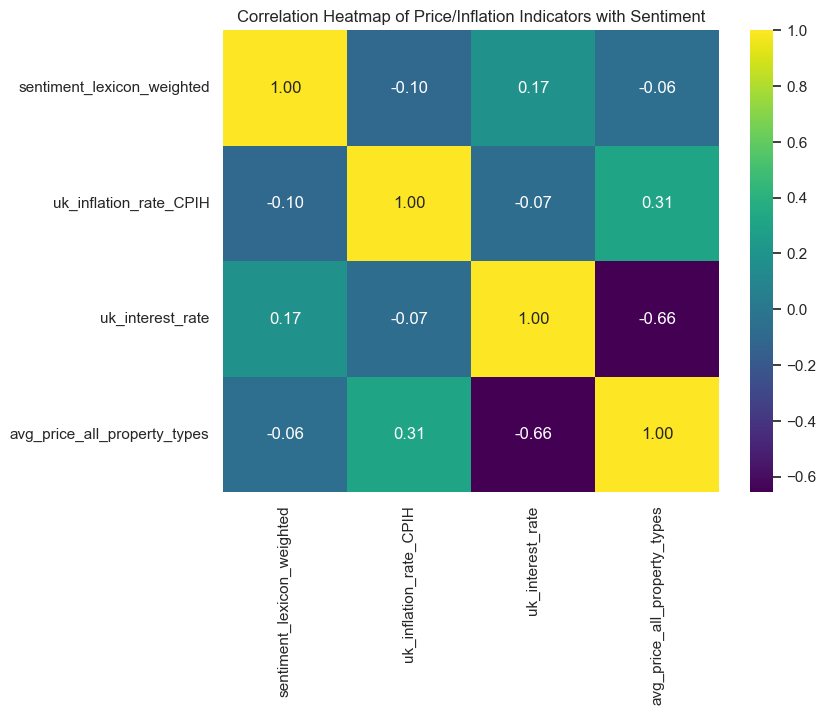

In [353]:
# Heatmap of the correlation matrix with price/ inflation indicators
plt.figure(figsize=(8, 6)) 
sns.heatmap(correlation_matrix_price, annot=True, fmt=".2f", cmap='viridis', cbar=True)

# Customize title and labels
plt.title('Correlation Heatmap of Price/Inflation Indicators with Sentiment')
plt.show()

In [354]:
# Create a pairplot for GPT sentiment score and macroeconnomic indicators
columns_sentiment_macro = ['sentiment_lexicon_weighted', 'uk_gdp_growth', 'uk_unemployment_rate', 
                            'uk_credit_growth_no_cc', 'uk_consumer_confidence']

# Correlation matrix for GPT sentiment score with macroeconomic indicators
correlation_matrix_macro = boe_indicators_1999_2022[columns_sentiment_macro].corr()

# Display the correlation matrix
correlation_matrix_macro

,sentiment_lexicon_weighted,uk_gdp_growth,uk_unemployment_rate,uk_credit_growth_no_cc,uk_consumer_confidence
sentiment_lexicon_weighted,1.000000,-0.004311,-0.225410,0.268314,0.227090
uk_gdp_growth,-0.004311,1.000000,-0.022817,-0.058439,0.134087
uk_unemployment_rate,-0.225410,-0.022817,1.000000,-0.598028,-0.328989
uk_credit_growth_no_cc,0.268314,-0.058439,-0.598028,1.000000,0.624583
uk_consumer_confidence,0.227090,0.134087,-0.328989,0.624583,1.000000


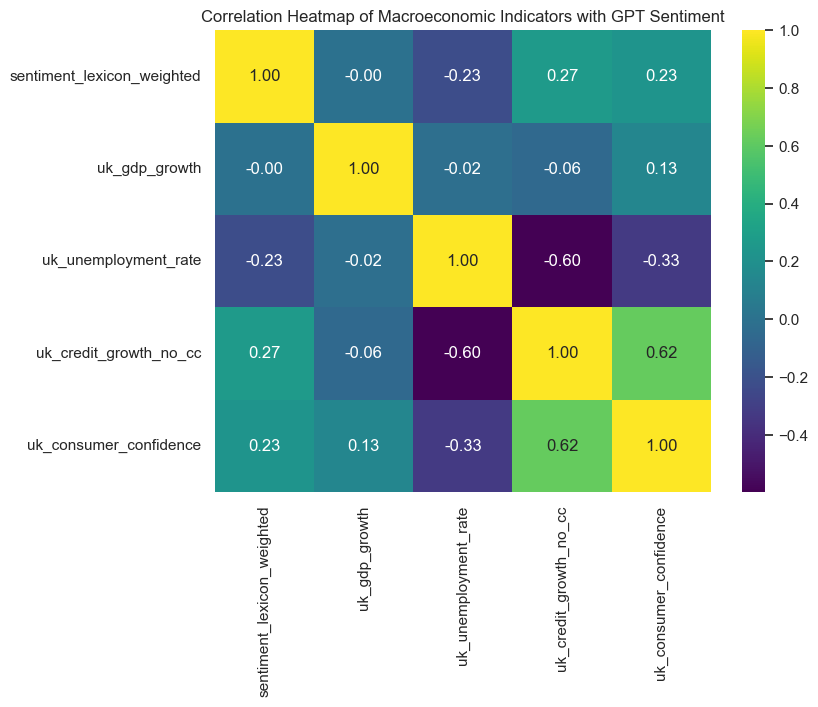

In [355]:
# Heatmap of the correlation matrix with macroeconomic indicators
plt.figure(figsize=(8, 6)) 
sns.heatmap(correlation_matrix_macro, annot=True, fmt=".2f", cmap='viridis', cbar=True)

# Customize title and labels
plt.title('Correlation Heatmap of Macroeconomic Indicators with GPT Sentiment')
plt.show()

In [356]:
# Create a pairplot for GPT sentiment score and financial indicators
columns_sentiment_finance = ['sentiment_lexicon_weighted', 'gbp_usd_fx', 'ftse_250', 'gilts_short ', 
                             'gilts_medium ', 'gilts_long ']

# Correlation matrix for GPT sentiment score with financial indicators
correlation_matrix_finance = boe_indicators_1999_2022[columns_sentiment_finance].corr()

# Display the correlation matrix
correlation_matrix_finance

,sentiment_lexicon_weighted,gbp_usd_fx,ftse_250,gilts_short,gilts_medium,gilts_long
sentiment_lexicon_weighted,1.000000,-0.016912,0.008450,0.130711,0.073204,-0.003406
gbp_usd_fx,-0.016912,1.000000,-0.618209,0.623467,0.692880,0.719304
ftse_250,0.008450,-0.618209,1.000000,-0.803435,-0.874136,-0.901670
gilts_short,0.130711,0.623467,-0.803435,1.000000,0.967419,0.852183
gilts_medium,0.073204,0.692880,-0.874136,0.967419,1.000000,0.952780
gilts_long,-0.003406,0.719304,-0.901670,0.852183,0.952780,1.000000


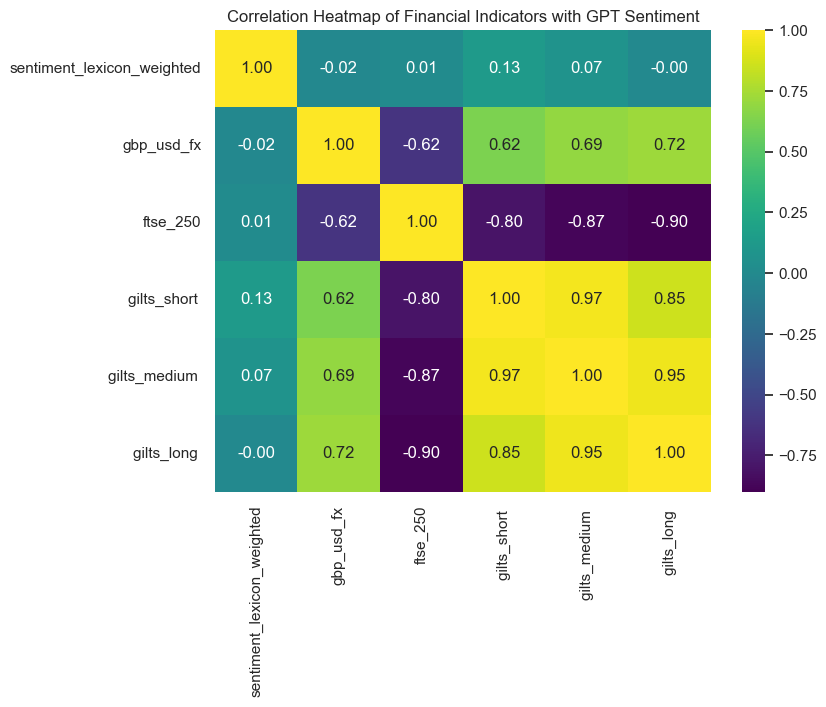

In [357]:
# Heatmap of the correlation matrix with finance indicators
plt.figure(figsize=(8, 6)) 
sns.heatmap(correlation_matrix_finance, annot=True, fmt=".2f", cmap='viridis', cbar=True)

# Customize title and labels
plt.title('Correlation Heatmap of Financial Indicators with GPT Sentiment')
plt.show()

In [358]:
# Create a pairplot for sentiment score and most impactful indicators
columns_sentiment_top = ['sentiment_lexicon_weighted', 'uk_interest_rate', 'uk_unemployment_rate', 
                            'uk_credit_growth_no_cc', 'uk_consumer_confidence', 'gilts_short ']

# Correlation matrix for sentiment score and most impactful indicators
correlation_matrix_top = boe_indicators_1999_2022[columns_sentiment_top].corr()

# Display the correlation matrix
correlation_matrix_top

,sentiment_lexicon_weighted,uk_interest_rate,uk_unemployment_rate,uk_credit_growth_no_cc,uk_consumer_confidence,gilts_short
sentiment_lexicon_weighted,1.000000,0.174087,-0.225410,0.268314,0.227090,0.130711
uk_interest_rate,0.174087,1.000000,-0.132020,0.431416,0.272763,0.933504
uk_unemployment_rate,-0.225410,-0.132020,1.000000,-0.598028,-0.328989,0.059011
uk_credit_growth_no_cc,0.268314,0.431416,-0.598028,1.000000,0.624583,0.324770
uk_consumer_confidence,0.227090,0.272763,-0.328989,0.624583,1.000000,0.226003
gilts_short,0.130711,0.933504,0.059011,0.324770,0.226003,1.000000


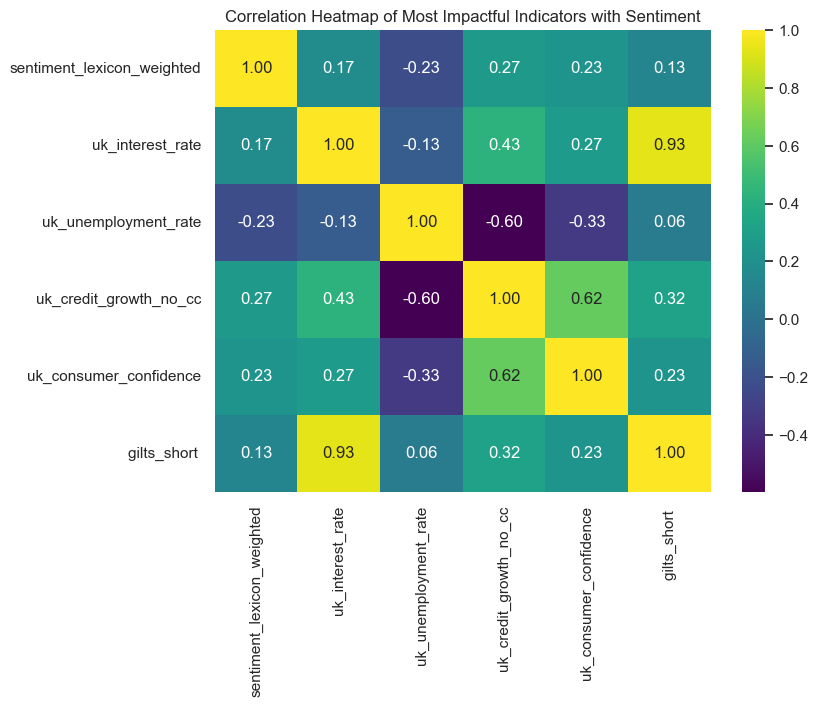

In [359]:
# Heatmap of the correlation matrix with most impactful indicators
plt.figure(figsize=(8, 6)) 
sns.heatmap(correlation_matrix_top, annot=True, fmt=".2f", cmap='viridis', cbar=True)

# Customize title and labels
plt.title('Correlation Heatmap of Most Impactful Indicators with Sentiment')
plt.show()

## 5. Non-linear Correlation Analysis

In [371]:
# Copy the DataFranme for further manipulation
boe_rf = boe_indicators_1999_2022.copy()

In [373]:
boe_rf.head()

,index,reference,country,date_format,year_month,year,year_month_dt,title,author,is_gov,...,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types,gov_label,monetary policy,interest rate,financial stability,inflation target,financial crisis,exchange rate
0,8,r990112a_BOE,united kingdom,1999-01-12,1999-01,1999,1999-01-01,Speech,george,1,...,13.5,26.1,67157,Governor,7,1,0,1,0,7
1,9,r990118a_BOE,united kingdom,1999-01-18,1999-01,1999,1999-01-01,Speech,george,1,...,13.5,26.1,67157,Governor,8,4,0,2,0,5
2,10,r990201a_BOE,united kingdom,1999-02-01,1999-02,1999,1999-02-01,Speech,george,1,...,13.2,26.1,67157,Governor,8,1,0,0,0,4
3,11,r990210a_BOE,united kingdom,1999-02-10,1999-02,1999,1999-02-01,Speech,george,1,...,13.2,26.1,67157,Governor,2,1,0,0,0,3
4,12,r990218a_BOE,united kingdom,1999-02-18,1999-02,1999,1999-02-01,The Chancellor's Lecture,george,1,...,13.2,26.1,67157,Governor,21,8,0,9,0,7


In [374]:
boe_rf.dtypes

index                                      int64
reference                                 object
country                                   object
date_format                       datetime64[ns]
year_month                             period[M]
year                                       int32
year_month_dt                     datetime64[ns]
title                                     object
author                                    object
is_gov                                     int64
text                                      object
text_lemmatised                           object
text_lemmatised_str                       object
word_count_original                        int64
word_count_cleaned                         int64
sentiment_lexicon_simple                 float64
sentiment_lexicon_simple_std             float64
sentiment_lexicon_weighted               float64
sentiment_lexicon_weighted_std           float64
uk_inflation_rate_CPIH                   float64
uk_unemployment_rate

In [375]:
# Set 'date' as index for resampling
boe_rf.set_index('date_format', inplace=True)

In [376]:
# View the DataFrame
boe_rf.head()

,index,reference,country,year_month,year,year_month_dt,title,author,is_gov,text,...,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types,gov_label,monetary policy,interest rate,financial stability,inflation target,financial crisis,exchange rate
date_format,,,,,,,,,,,,,,,,,,,,,
1999-01-12,8,r990112a_BOE,united kingdom,1999-01,1999,1999-01-01,Speech,george,1,I am only too well aware of the pressure curre...,...,13.5,26.1,67157,Governor,7,1,0,1,0,7
1999-01-18,9,r990118a_BOE,united kingdom,1999-01,1999,1999-01-01,Speech,george,1,It would be a masterly understatement to descr...,...,13.5,26.1,67157,Governor,8,4,0,2,0,5
1999-02-01,10,r990201a_BOE,united kingdom,1999-02,1999,1999-02-01,Speech,george,1,I should like to add my personal thanks to you...,...,13.2,26.1,67157,Governor,8,1,0,0,0,4
1999-02-10,11,r990210a_BOE,united kingdom,1999-02,1999,1999-02-01,Speech,george,1,"Thank you, Padraic. I wasn't quite sure what y...",...,13.2,26.1,67157,Governor,2,1,0,0,0,3
1999-02-18,12,r990218a_BOE,united kingdom,1999-02,1999,1999-02-01,The Chancellor's Lecture,george,1,As you would expect of a central banker I will...,...,13.2,26.1,67157,Governor,21,8,0,9,0,7


### 5.1. Random Forst - Monthly Analysis with BoE Wordlist Sentiment Score

**Does sentiment predict economic indicators?**

In [379]:
# Aggregate sentiment scores and consumer confidence monthly
boe_rf_monthly = boe_rf.resample('M').agg({
            'sentiment_lexicon_weighted': 'mean',
            'uk_consumer_confidence': 'mean',
            'uk_inflation_rate_CPIH': 'mean',
            'uk_unemployment_rate': 'mean',
            'uk_gdp_growth': 'mean',
            'uk_interest_rate': 'mean',
            'uk_consumer_confidence': 'mean', 
            'gbp_usd_fx': 'mean',
            'ftse_250': 'mean',
            'gilts_short ': 'mean',
            'gilts_medium ': 'mean', 
            'gilts_long ': 'mean', 
            'uk_credit_growth_no_cc': 'mean',
            'uk_credit_growth_only_cc': 'mean',
            'avg_price_all_property_types': 'mean'
})

# Reset index to turn 'date' back into a column
boe_rf_monthly.reset_index(inplace=True)

In [380]:
# View the DataFrame
boe_rf_monthly.head()

,date_format,sentiment_lexicon_weighted,uk_consumer_confidence,uk_inflation_rate_CPIH,uk_unemployment_rate,uk_gdp_growth,uk_interest_rate,gbp_usd_fx,ftse_250,gilts_short,gilts_medium,gilts_long,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types
0,1999-01-31,0.085728,-3.6,1.584,6.2,0.7,6.00,1.650910,4904.934033,4.30,4.24,4.32,13.5,26.1,67157.0
1,1999-02-28,0.231430,-1.6,1.406,6.2,0.7,5.50,1.627565,5192.548511,4.45,4.39,4.42,13.2,26.1,67157.0
2,1999-03-31,0.332402,0.3,1.669,6.2,0.7,5.50,1.621970,5430.787407,4.70,4.60,4.55,13.4,25.7,67157.0
3,1999-04-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1999-05-31,0.271080,-0.4,1.306,6.0,0.5,5.25,1.615400,5760.785259,4.93,4.77,4.71,12.9,24.7,70005.0


In [381]:
# Create date-related features
boe_rf_monthly['month'] = boe_rf_monthly['date_format'].dt.month
boe_rf_monthly['quarter'] = boe_rf_monthly['date_format'].dt.quarter
boe_rf_monthly['year'] = boe_rf_monthly['date_format'].dt.year

In [382]:

# View the DataFrame
boe_rf_monthly.head()

,date_format,sentiment_lexicon_weighted,uk_consumer_confidence,uk_inflation_rate_CPIH,uk_unemployment_rate,uk_gdp_growth,uk_interest_rate,gbp_usd_fx,ftse_250,gilts_short,gilts_medium,gilts_long,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types,month,quarter,year
0,1999-01-31,0.085728,-3.6,1.584,6.2,0.7,6.00,1.650910,4904.934033,4.30,4.24,4.32,13.5,26.1,67157.0,1,1,1999
1,1999-02-28,0.231430,-1.6,1.406,6.2,0.7,5.50,1.627565,5192.548511,4.45,4.39,4.42,13.2,26.1,67157.0,2,1,1999
2,1999-03-31,0.332402,0.3,1.669,6.2,0.7,5.50,1.621970,5430.787407,4.70,4.60,4.55,13.4,25.7,67157.0,3,1,1999
3,1999-04-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,2,1999
4,1999-05-31,0.271080,-0.4,1.306,6.0,0.5,5.25,1.615400,5760.785259,4.93,4.77,4.71,12.9,24.7,70005.0,5,2,1999


In [387]:
# Create lagged feature for sentiment score with 1 month lag
boe_rf_monthly['sentiment_lexicon_weighted_lag_1m'] = boe_rf_monthly['sentiment_lexicon_weighted'].shift(1)

In [388]:
# Create lagged feature for sentiment score with 1 month lag
boe_rf_monthly['sentiment_lexicon_weighted_lag_2m'] = boe_rf_monthly['sentiment_lexicon_weighted'].shift(2)

In [389]:
# Create lagged feature for sentiment score with 1 month lag
boe_rf_monthly['sentiment_lexicon_weighted_lag_3m'] = boe_rf_monthly['sentiment_lexicon_weighted'].shift(3)

In [390]:
# View the DataFrame
boe_rf_monthly.head()

,date_format,sentiment_lexicon_weighted,uk_consumer_confidence,uk_inflation_rate_CPIH,uk_unemployment_rate,uk_gdp_growth,uk_interest_rate,gbp_usd_fx,ftse_250,gilts_short,...,gilts_long,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types,month,quarter,year,sentiment_lexicon_weighted_lag_1m,sentiment_lexicon_weighted_lag_2m,sentiment_lexicon_weighted_lag_3m
0,1999-01-31,0.085728,-3.6,1.584,6.2,0.7,6.00,1.650910,4904.934033,4.30,...,4.32,13.5,26.1,67157.0,1,1,1999,NaN,NaN,NaN
1,1999-02-28,0.231430,-1.6,1.406,6.2,0.7,5.50,1.627565,5192.548511,4.45,...,4.42,13.2,26.1,67157.0,2,1,1999,0.085728,NaN,NaN
2,1999-03-31,0.332402,0.3,1.669,6.2,0.7,5.50,1.621970,5430.787407,4.70,...,4.55,13.4,25.7,67157.0,3,1,1999,0.231430,0.085728,NaN
3,1999-04-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,4,2,1999,0.332402,0.231430,0.085728
4,1999-05-31,0.271080,-0.4,1.306,6.0,0.5,5.25,1.615400,5760.785259,4.93,...,4.71,12.9,24.7,70005.0,5,2,1999,NaN,0.332402,0.231430


In [391]:
# Drop first row(s) with NaN values due to lagging
boe_rf_monthly.dropna(inplace=True)

**training and evaluating a distinct model for each indicator**

In [392]:
# List of targets
targets = [
    'uk_consumer_confidence',
    'uk_inflation_rate_CPIH',
    'uk_unemployment_rate',
    'uk_gdp_growth',
    'uk_interest_rate',
    'gbp_usd_fx',
    'ftse_250',
    'gilts_short ',
    'gilts_medium ', 
    'gilts_long ', 
    'uk_credit_growth_no_cc',
    'uk_credit_growth_only_cc',
    'avg_price_all_property_types'
]

# Features
feature_cols = [
    'sentiment_lexicon_weighted',
    'sentiment_lexicon_weighted_lag_1m',
    'sentiment_lexicon_weighted_lag_2m',
    'sentiment_lexicon_weighted_lag_3m',
    'month', 'quarter', 'year'
]

# Loop through each target
for target in targets:
    print(f"\nTraining model for: {target}")
    y = boe_rf_monthly[target]
    X = boe_rf_monthly[feature_cols]

    # Time-series aware split without shuffling
    split_idx = int(len(boe_rf_monthly) * 0.8)
    X_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]
    y_train, y_test = y.iloc[:split_idx], y.iloc[split_idx:]

    # Initialize and train the model
    rf = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
    rf.fit(X_train, y_train)

    # Make predictions
    y_pred = rf.predict(X_test)

    # Evaluate
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    print(f"RMSE: {rmse:.3f}")
    print(f"R^2: {r2:.3f}")


Training model for: uk_consumer_confidence
RMSE: 11.694
R^2: -0.561

Training model for: uk_inflation_rate_CPIH
RMSE: 2.561
R^2: 0.011

Training model for: uk_unemployment_rate
RMSE: 0.522
R^2: -0.147

Training model for: uk_gdp_growth
RMSE: 7.186
R^2: -0.006

Training model for: uk_interest_rate
RMSE: 0.395
R^2: -0.307

Training model for: gbp_usd_fx
RMSE: 0.073
R^2: -0.792

Training model for: ftse_250
RMSE: 1871.267
R^2: -0.068

Training model for: gilts_short 
RMSE: 0.568
R^2: -0.118

Training model for: gilts_medium 
RMSE: 0.658
R^2: -0.356

Training model for: gilts_long 
RMSE: 0.785
R^2: -1.424

Training model for: uk_credit_growth_no_cc
RMSE: 8.122
R^2: -2.254

Training model for: uk_credit_growth_only_cc
RMSE: 12.870
R^2: -0.623

Training model for: avg_price_all_property_types
RMSE: 25856.817
R^2: -1.765


In [393]:
# List of targets
targets = [
    'uk_consumer_confidence',
    'uk_inflation_rate_CPIH',
    'uk_unemployment_rate',
    'uk_gdp_growth',
    'uk_interest_rate',
    'gbp_usd_fx',
    'ftse_250',
    'gilts_short ',
    'gilts_medium ', 
    'gilts_long ', 
    'uk_credit_growth_no_cc',
    'uk_credit_growth_only_cc',
    'avg_price_all_property_types'
]

# Features
feature_cols = [
    'sentiment_lexicon_weighted_lag_2m',
]

# Loop through each target
for target in targets:
    print(f"\nTraining model for: {target}")
    y = boe_rf_monthly[target]
    X = boe_rf_monthly[feature_cols]

    # Time-series aware split without shuffling
    split_idx = int(len(boe_rf_monthly) * 0.8)
    X_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]
    y_train, y_test = y.iloc[:split_idx], y.iloc[split_idx:]

    # Initialize and train the model
    rf = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
    rf.fit(X_train, y_train)

    # Make predictions
    y_pred = rf.predict(X_test)

    # Evaluate
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    print(f"RMSE: {rmse:.3f}")
    print(f"R^2: {r2:.3f}")


Training model for: uk_consumer_confidence
RMSE: 11.989
R^2: -0.641

Training model for: uk_inflation_rate_CPIH
RMSE: 2.708
R^2: -0.106

Training model for: uk_unemployment_rate
RMSE: 2.163
R^2: -18.659

Training model for: uk_gdp_growth
RMSE: 7.289
R^2: -0.035

Training model for: uk_interest_rate
RMSE: 2.523
R^2: -52.275

Training model for: gbp_usd_fx
RMSE: 0.288
R^2: -26.910

Training model for: ftse_250
RMSE: 9464.124
R^2: -26.319

Training model for: gilts_short 
RMSE: 2.697
R^2: -24.191

Training model for: gilts_medium 
RMSE: 2.706
R^2: -21.913

Training model for: gilts_long 
RMSE: 2.493
R^2: -23.442

Training model for: uk_credit_growth_no_cc
RMSE: 5.196
R^2: -0.332

Training model for: uk_credit_growth_only_cc
RMSE: 13.768
R^2: -0.858

Training model for: avg_price_all_property_types
RMSE: 84644.137
R^2: -28.632


**Do economic indicators predict sentiment?**

In [395]:
# List of targets
targets = [
    'sentiment_lexicon_weighted',
]

# Features
feature_cols = [
    'uk_consumer_confidence',
    'uk_inflation_rate_CPIH',
    'uk_unemployment_rate',
    'uk_gdp_growth',
    'uk_interest_rate',
    'gbp_usd_fx',
    'ftse_250',
    'gilts_short ',
    'gilts_medium ', 
    'gilts_long ', 
    'uk_credit_growth_no_cc',
    'uk_credit_growth_only_cc',
    'avg_price_all_property_types'
]

# Loop through each target
for target in targets:
    print(f"\nTraining model for: {target}")
    y = boe_rf_monthly[target]
    X = boe_rf_monthly[feature_cols]

    # Time-series aware split without shuffling
    split_idx = int(len(boe_rf_monthly) * 0.8)
    X_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]
    y_train, y_test = y.iloc[:split_idx], y.iloc[split_idx:]

    # Initialize and train the model
    rf = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
    rf.fit(X_train, y_train)

    # Make predictions
    y_pred = rf.predict(X_test)

    # Evaluate
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    print(f"RMSE: {rmse:.3f}")
    print(f"R^2: {r2:.3f}")


Training model for: sentiment_lexicon_weighted
RMSE: 0.133
R^2: -0.435


**Conclusion**: negative R2 suggest model performs worse than simply predicting the mean of the target variable for all observations.

### 5.2.Random Forest Quarterly Analysis woth BoE Wordlist Sentiment Score

**Does sentiment predict economic indicators?**

In [403]:
# Aggregate sentiment scores and consumer confidence monthly
boe_rf_quarterly = boe_rf.resample('Q').agg({
            'sentiment_lexicon_weighted': 'mean',
            'uk_consumer_confidence': 'mean',
            'uk_inflation_rate_CPIH': 'mean',
            'uk_unemployment_rate': 'mean',
            'uk_gdp_growth': 'mean',
            'uk_interest_rate': 'mean',
            'uk_consumer_confidence': 'mean', 
            'gbp_usd_fx': 'mean',
            'ftse_250': 'mean',
            'gilts_short ': 'mean',
            'gilts_medium ': 'mean', 
            'gilts_long ': 'mean', 
            'uk_credit_growth_no_cc': 'mean',
            'uk_credit_growth_only_cc': 'mean',
            'avg_price_all_property_types': 'mean'
})

# Reset index to turn 'date' back into a column
boe_rf_quarterly.reset_index(inplace=True)

In [404]:
# Create date-related features
boe_rf_quarterly['month'] = boe_rf_quarterly['date_format'].dt.month
boe_rf_quarterly['quarter'] = boe_rf_quarterly['date_format'].dt.quarter
boe_rf_quarterly['year'] = boe_rf_quarterly['date_format'].dt.year

In [405]:
# Create lagged features (3 months lag is now 1 quarter lag)
boe_rf_quarterly['sentiment_lexicon_weighted_lag_1q'] = boe_rf_quarterly['sentiment_lexicon_weighted'].shift(1)

In [406]:
# View the DataFrame
boe_rf_quarterly.head()

,date_format,sentiment_lexicon_weighted,uk_consumer_confidence,uk_inflation_rate_CPIH,uk_unemployment_rate,uk_gdp_growth,uk_interest_rate,gbp_usd_fx,ftse_250,gilts_short,gilts_medium,gilts_long,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types,month,quarter,year,sentiment_lexicon_weighted_lag_1q
0,1999-03-31,0.220248,-1.625000,1.516250,6.200000,0.7,5.625000,1.632002,5180.204615,4.475000,4.405000,4.427500,13.325000,26.000000,67157.0,3,1,1999,NaN
1,1999-06-30,0.303026,-0.212500,1.322500,6.000000,0.5,5.156250,1.607735,5786.393428,5.053750,4.867500,4.807500,12.937500,24.325000,70005.0,6,2,1999,0.220248
2,1999-09-30,0.004935,0.260000,1.186200,5.840000,1.6,5.150000,1.617488,5943.963606,5.852000,5.412000,4.714000,12.680000,22.340000,74102.0,9,3,1999,0.303026
3,1999-12-31,0.151916,2.011111,1.132778,5.844444,1.4,5.416667,1.629650,6005.650028,6.033333,5.393333,4.480000,12.477778,20.788889,76001.0,12,4,1999,0.004935
4,2000-03-31,0.311193,1.075000,0.802000,5.766667,1.2,5.937500,1.603376,6416.488272,6.179167,5.504167,4.543333,12.383333,20.316667,77950.0,3,1,2000,0.151916


In [407]:
# Drop NaNs due to lag
boe_rf_quarterly.dropna(inplace=True)

In [408]:
# List of targets
targets = [
    'uk_consumer_confidence',
    'uk_inflation_rate_CPIH',
    'uk_unemployment_rate',
    'uk_gdp_growth',
    'uk_interest_rate',
    'uk_consumer_confidence', 
    'gbp_usd_fx',
    'ftse_250',
    'gilts_short ',
    'gilts_medium ', 
    'gilts_long ', 
    'uk_credit_growth_no_cc',
    'uk_credit_growth_only_cc',
    'avg_price_all_property_types'
]

# Features
feature_cols = [
    'sentiment_lexicon_weighted', 
    'sentiment_lexicon_weighted_lag_1q',
    'month', 'quarter', 'year'
]

# Loop through each target
for target in targets:
    print(f"\nTraining model for: {target}")
    y = boe_rf_quarterly[target]
    X = boe_rf_quarterly[feature_cols]

    # Time-series aware split without shuffling
    split_idx = int(len(boe_rf_quarterly) * 0.8)
    X_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]
    y_train, y_test = y.iloc[:split_idx], y.iloc[split_idx:]

    # Initialize and train the model
    rf = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
    rf.fit(X_train, y_train)

    # Make predictions
    y_pred = rf.predict(X_test)

    # Evaluate
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    print(f"RMSE: {rmse:.3f}")
    print(f"R^2: {r2:.3f}")


Training model for: uk_consumer_confidence
RMSE: 15.147
R^2: -0.684

Training model for: uk_inflation_rate_CPIH
RMSE: 3.506
R^2: -0.176

Training model for: uk_unemployment_rate
RMSE: 0.826
R^2: -2.471

Training model for: uk_gdp_growth
RMSE: 6.460
R^2: -0.042

Training model for: uk_interest_rate
RMSE: 0.598
R^2: -0.166

Training model for: uk_consumer_confidence
RMSE: 15.147
R^2: -0.684

Training model for: gbp_usd_fx
RMSE: 0.103
R^2: -1.338

Training model for: ftse_250
RMSE: 1924.473
R^2: -0.189

Training model for: gilts_short 
RMSE: 0.968
R^2: -0.041

Training model for: gilts_medium 
RMSE: 0.916
R^2: -0.037

Training model for: gilts_long 
RMSE: 0.909
R^2: -0.252

Training model for: uk_credit_growth_no_cc
RMSE: 7.316
R^2: -2.144

Training model for: uk_credit_growth_only_cc
RMSE: 11.692
R^2: -0.503

Training model for: avg_price_all_property_types
RMSE: 34596.370
R^2: -2.516


**Conclusion**: negative R2 suggest model performs worse than simply predicting the mean of the target variable for all observations.

**Do economic indicators predict sentiment?**

In [411]:
# List of targets
targets = [
    'sentiment_lexicon_weighted',
]

# Features
feature_cols = [
    'uk_consumer_confidence',
    'uk_inflation_rate_CPIH',
    'uk_unemployment_rate',
    'uk_gdp_growth',
    'uk_interest_rate',
    'gbp_usd_fx',
    'ftse_250',
    'gilts_short ',
    'gilts_medium ', 
    'gilts_long ', 
    'uk_credit_growth_no_cc',
    'uk_credit_growth_only_cc',
    'avg_price_all_property_types'
]

# Loop through each target
for target in targets:
    print(f"\nTraining model for: {target}")
    y = boe_rf_quarterly[target]
    X = boe_rf_quarterly[feature_cols]

    # Time-series aware split without shuffling
    split_idx = int(len(boe_rf_quarterly) * 0.8)
    X_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]
    y_train, y_test = y.iloc[:split_idx], y.iloc[split_idx:]

    # Initialize and train the model
    rf = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
    rf.fit(X_train, y_train)

    # Make predictions
    y_pred = rf.predict(X_test)

    # Evaluate
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    print(f"RMSE: {rmse:.3f}")
    print(f"R^2: {r2:.3f}")


Training model for: sentiment_lexicon_weighted
RMSE: 0.061
R^2: 0.391


**Observations**: model explains roughly 32.6% of the variance in the data. moderate level of explanatory power.

### 5.3.Random Forest with BoE Wordlist Sentiment Score after checking whether series are stationary

Check for stationarity to ensure analysis or modeling is valid, and transform the data if it is not stationary

In [415]:
# List of variables you want to test
variables = ['sentiment_lexicon_weighted',
             'uk_consumer_confidence',
             'uk_inflation_rate_CPIH',
             'uk_unemployment_rate',
             'uk_gdp_growth',
             'uk_interest_rate',
             'gbp_usd_fx',
             'ftse_250',
             'gilts_short ',
             'gilts_medium ',
             'gilts_long ',
             'uk_credit_growth_no_cc',
             'uk_credit_growth_only_cc',
             'avg_price_all_property_types']

# Loop over each variable
for var in variables:
    series = boe_rf[var]
    result = adfuller(series.dropna())  # drop NaNs if any
    print(f"{var}: p-value = {result[1]:.4f}")

sentiment_lexicon_weighted: p-value = 0.0042
uk_consumer_confidence: p-value = 0.6762
uk_inflation_rate_CPIH: p-value = 0.9101
uk_unemployment_rate: p-value = 0.6788
uk_gdp_growth: p-value = 0.0000
uk_interest_rate: p-value = 0.3117
gbp_usd_fx: p-value = 0.4019
ftse_250: p-value = 0.5079
gilts_short : p-value = 0.2794
gilts_medium : p-value = 0.6901
gilts_long : p-value = 0.7010
uk_credit_growth_no_cc: p-value = 0.4252
uk_credit_growth_only_cc: p-value = 0.0916
avg_price_all_property_types: p-value = 0.8011


**Observation**: the following variables are not stationary and need to be transformed (p>0.05):
- uk_consumer_confidence: p-value = 0.6762
- uk_inflation_rate_CPIH: p-value = 0.9101
- uk_unemployment_rate: p-value = 0.6788
- uk_interest_rate: p-value = 0.3117
- gbp_usd_fx: p-value = 0.4019
- ftse_250: p-value = 0.5079
- gilts_short : p-value = 0.2794
- gilts_medium : p-value = 0.6901
- gilts_long : p-value = 0.7010
- uk_credit_growth_no_cc: p-value = 0.4252
- uk_credit_growth_only_cc: p-value = 0.0916
- avg_price_all_property_types: p-value = 0.8011

In [432]:
# Create a new dataframe to transform the data
boe_rf_diff = boe_rf.copy()

In [433]:
# transform original series into a change series, highlighting how much it increases or decreases from one period to the next
variables = [
    'sentiment_lexicon_weighted', 'uk_consumer_confidence', 'uk_inflation_rate_CPIH', 'uk_unemployment_rate',
    'uk_gdp_growth', 'uk_interest_rate', 'gbp_usd_fx', 'ftse_250',
    'gilts_short ', 'gilts_medium ', 'gilts_long ',
    'uk_credit_growth_no_cc', 'uk_credit_growth_only_cc',
    'avg_price_all_property_types'
]

# For example, create differenced versions of all variables
for var in variables:
    boe_rf_diff[f'{var}_diff'] = boe_rf_diff[var].diff()

In [434]:
# View the DataFrame
boe_rf_diff.head()

,index,reference,country,year_month,year,year_month_dt,title,author,is_gov,text,...,uk_gdp_growth_diff,uk_interest_rate_diff,gbp_usd_fx_diff,ftse_250_diff,gilts_short _diff,gilts_medium _diff,gilts_long _diff,uk_credit_growth_no_cc_diff,uk_credit_growth_only_cc_diff,avg_price_all_property_types_diff
date_format,,,,,,,,,,,,,,,,,,,,,
1999-01-12,8,r990112a_BOE,united kingdom,1999-01,1999,1999-01-01,Speech,george,1,I am only too well aware of the pressure curre...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1999-01-18,9,r990118a_BOE,united kingdom,1999-01,1999,1999-01-01,Speech,george,1,It would be a masterly understatement to descr...,...,0.0,0.0,0.000000,0.000000,0.00,0.00,0.0,0.0,0.0,0.0
1999-02-01,10,r990201a_BOE,united kingdom,1999-02,1999,1999-02-01,Speech,george,1,I should like to add my personal thanks to you...,...,0.0,-0.5,-0.023345,287.614478,0.15,0.15,0.1,-0.3,0.0,0.0
1999-02-10,11,r990210a_BOE,united kingdom,1999-02,1999,1999-02-01,Speech,george,1,"Thank you, Padraic. I wasn't quite sure what y...",...,0.0,0.0,0.000000,0.000000,0.00,0.00,0.0,0.0,0.0,0.0
1999-02-18,12,r990218a_BOE,united kingdom,1999-02,1999,1999-02-01,The Chancellor's Lecture,george,1,As you would expect of a central banker I will...,...,0.0,0.0,0.000000,0.000000,0.00,0.00,0.0,0.0,0.0,0.0


In [435]:
# Drop NaNs due to lag
boe_rf_diff.dropna(inplace=True)

In [440]:
# List of targets
targets = [
    'uk_consumer_confidence_diff',
    'uk_inflation_rate_CPIH_diff',
    'uk_unemployment_rate_diff',
    'uk_gdp_growth',
    'uk_interest_rate_diff',
    'gbp_usd_fx_diff',
    'ftse_250_diff',
    'gilts_short _diff',
    'gilts_medium _diff', 
    'gilts_long _diff', 
    'uk_credit_growth_no_cc_diff',
    'uk_credit_growth_only_cc_diff',
    'avg_price_all_property_types_diff'
]

# Features
feature_cols = [
    'sentiment_lexicon_weighted',
    'sentiment_lexicon_weighted_lag_1m',
    'sentiment_lexicon_weighted_lag_2m',
    'sentiment_lexicon_weighted_lag_3m',
    'month', 'quarter', 'year'
]

# Features
feature_cols = [
    'sentiment_lexicon_weighted']

# Loop through each target
for target in targets:
    print(f"\nTraining model for: {target}")
    y = boe_rf_diff[target]
    X = boe_rf_diff[feature_cols]

    # Time-series aware split without shuffling
    split_idx = int(len(boe_rf_diff) * 0.8)
    X_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]
    y_train, y_test = y.iloc[:split_idx], y.iloc[split_idx:]

    # Initialize and train the model
    rf = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
    rf.fit(X_train, y_train)

    # Make predictions
    y_pred = rf.predict(X_test)

    # Evaluate
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    print(f"RMSE: {rmse:.3f}")
    print(f"R^2: {r2:.3f}")


Training model for: uk_consumer_confidence_diff
RMSE: 1.857
R^2: -0.034

Training model for: uk_inflation_rate_CPIH_diff
RMSE: 0.248
R^2: -0.087

Training model for: uk_unemployment_rate_diff
RMSE: 0.060
R^2: -0.167

Training model for: uk_gdp_growth
RMSE: 6.299
R^2: -0.028

Training model for: uk_interest_rate_diff
RMSE: 0.109
R^2: -0.685

Training model for: gbp_usd_fx_diff
RMSE: 0.015
R^2: -1.133

Training model for: ftse_250_diff
RMSE: 467.959
R^2: -0.125

Training model for: gilts_short _diff
RMSE: 0.145
R^2: -0.176

Training model for: gilts_medium _diff
RMSE: 0.125
R^2: -0.141

Training model for: gilts_long _diff
RMSE: 0.107
R^2: -0.073

Training model for: uk_credit_growth_no_cc_diff
RMSE: 0.358
R^2: -0.115

Training model for: uk_credit_growth_only_cc_diff
RMSE: 0.987
R^2: -0.032

Training model for: avg_price_all_property_types_diff
RMSE: 1718.000
R^2: -0.054


**Observation**: R2 is still negative.

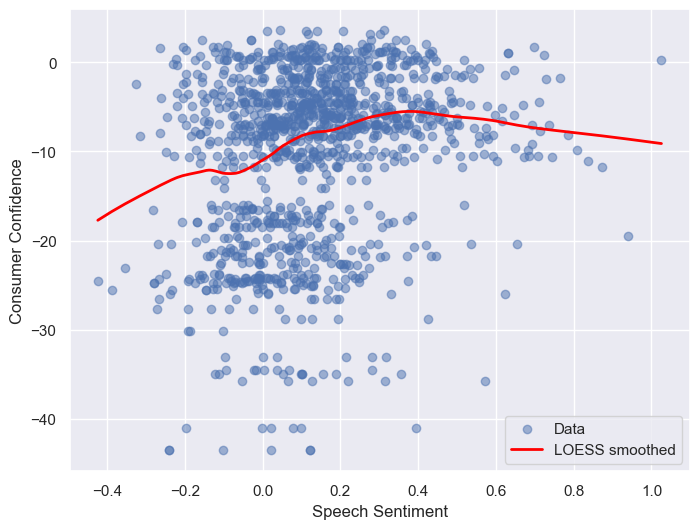

In [442]:
# Correlation between sentiment score and consumer confidene
x = boe_rf['sentiment_lexicon_weighted']
y = boe_rf['uk_consumer_confidence']

# Apply LOWESS smoothing
smoothed = lowess(y, x, frac=0.3)  # frac is smoothing span

# Plot original data
plt.scatter(x, y, alpha=0.5, label='Data')
# Plot smoothed line
plt.plot(smoothed[:, 0], smoothed[:, 1], color='red', linewidth=2, label='LOESS smoothed')
plt.xlabel('Speech Sentiment')
plt.ylabel('Consumer Confidence')
plt.legend()
plt.show()

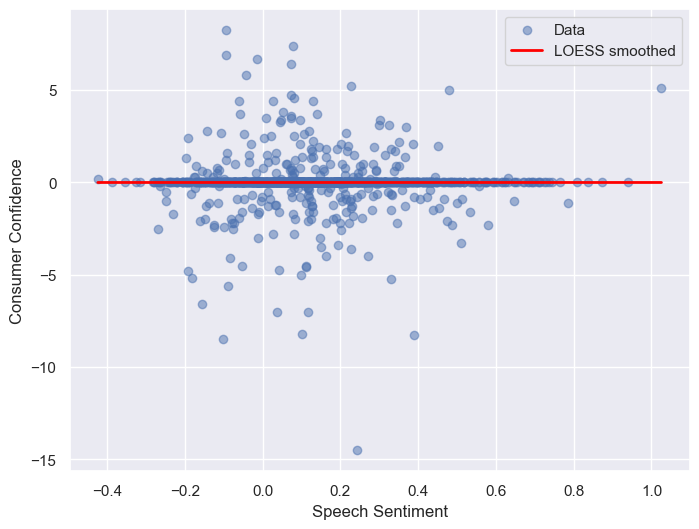

In [443]:
# Correlation between sentiment score and consumer confidene
x = boe_rf_diff['sentiment_lexicon_weighted']
y = boe_rf_diff['uk_consumer_confidence_diff']

# Apply LOWESS smoothing
smoothed = lowess(y, x, frac=0.3)  # frac is smoothing span

# Plot original data
plt.scatter(x, y, alpha=0.5, label='Data')
# Plot smoothed line
plt.plot(smoothed[:, 0], smoothed[:, 1], color='red', linewidth=2, label='LOESS smoothed')
plt.xlabel('Speech Sentiment')
plt.ylabel('Consumer Confidence')
plt.legend()
plt.show()

In [444]:
# List of targets
targets = ['sentiment_lexicon_weighted']

# Features
feature_cols = [
    'uk_consumer_confidence_diff',
    'uk_inflation_rate_CPIH_diff',
    'uk_unemployment_rate_diff',
    'uk_gdp_growth',
    'uk_interest_rate_diff',
    'gbp_usd_fx_diff',
    'ftse_250_diff',
    'gilts_short _diff',
    'gilts_medium _diff', 
    'gilts_long _diff', 
    'uk_credit_growth_no_cc_diff',
    'uk_credit_growth_only_cc_diff',
    'avg_price_all_property_types_diff'
]

# Loop through each target
for target in targets:
    print(f"\nTraining model for: {target}")
    y = boe_rf_diff[target]
    X = boe_rf_diff[feature_cols]

    # Time-series aware split without shuffling
    split_idx = int(len(boe_rf_diff) * 0.8)
    X_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]
    y_train, y_test = y.iloc[:split_idx], y.iloc[split_idx:]

    # Initialize and train the model
    rf = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
    rf.fit(X_train, y_train)

    # Make predictions
    y_pred = rf.predict(X_test)

    # Evaluate
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    print(f"RMSE: {rmse:.3f}")
    print(f"R^2: {r2:.3f}")


Training model for: sentiment_lexicon_weighted
RMSE: 0.238
R^2: -0.109


**Observation**: R2 still negative

### 5.4. Cross Correlation between two time series at different lags

- Positive lags: sentiment leads indicator
- Negative lags: variable leads sentiment

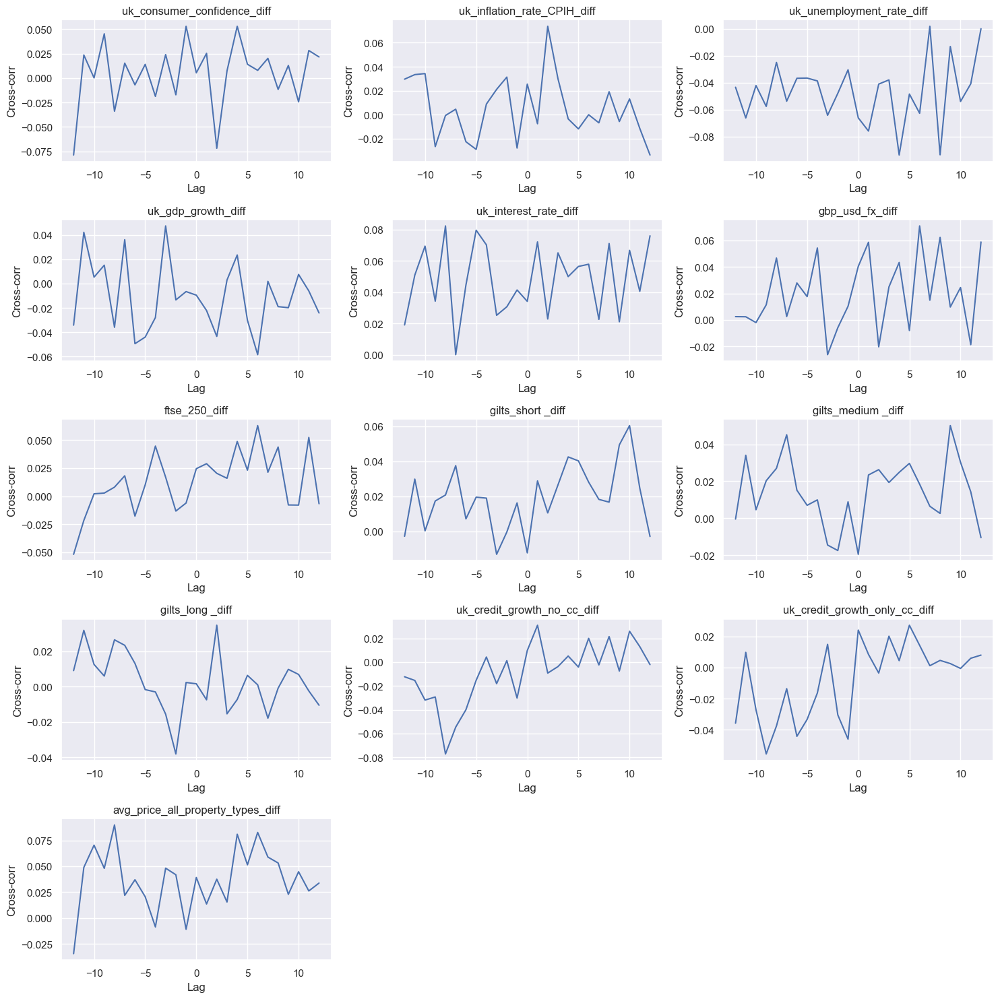

In [448]:
indicators_diff = ['uk_consumer_confidence_diff', 'uk_inflation_rate_CPIH_diff', 'uk_unemployment_rate_diff',
              'uk_gdp_growth_diff', 'uk_interest_rate_diff', 'gbp_usd_fx_diff', 'ftse_250_diff',
              'gilts_short _diff', 'gilts_medium _diff', 'gilts_long _diff',
              'uk_credit_growth_no_cc_diff', 'uk_credit_growth_only_cc_diff',
              'avg_price_all_property_types_diff']
lags = range(-12, 13)

n_vars = len(indicators_diff)
ncols = 3
nrows = (n_vars + ncols - 1) // ncols  # Calculate number of rows needed

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, nrows*3))  # Adjust size as needed

# Flatten axes array for easy looping if multiple rows
axes = axes.flatten()

for i, var in enumerate(indicators_diff):
    cc = [boe_rf_diff['sentiment_lexicon_weighted'].corr(boe_rf_diff[var].shift(lag)) for lag in lags]
    ax = axes[i]
    ax.plot(lags, cc)
    ax.set_title(f'{var}')
    ax.set_xlabel('Lag')
    ax.set_ylabel('Cross-corr')
    ax.grid(True)

# Remove any unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [449]:
for i, var in enumerate(indicators_diff):
    p_values = []
    cc = []
    for lag in lags:
        x = boe_rf_diff['sentiment_lexicon_weighted']
        y = boe_rf_diff[var].shift(lag)
        # Drop NaNs
        valid_idx = x.dropna().index.intersection(y.dropna().index)
        x_valid = x.loc[valid_idx]
        y_valid = y.loc[valid_idx]
        r = x_valid.corr(y_valid)
        cc.append(r)
        # Convert r to t-statistic
        n = len(valid_idx)
        if n > 2:
            t_stat = r * np.sqrt((n - 2) / (1 - r**2))
            # two-sided p-value
            p = 2 * (1 - stats.t.cdf(abs(t_stat), df=n - 2))
        else:
            p = np.nan  # Not enough data
        p_values.append(p)
    
    # Now, plot CC + mark significance with stars or different color if p<0.05
    ax = axes[i]
    ax.plot(lags, cc)
    # Mark significant points
    for j, p in enumerate(p_values):
        if p < 0.05:
            ax.scatter(lags[j], cc[j], color='red')  # or add a star marker
    ax.set_title(f'{var}')
    ax.set_xlabel('Lag')
    ax.set_ylabel('Cross-corr')
    ax.grid(True)

   # Print significant lags with both p-value and correlation coefficient
    print(f"\nSignificant lags for {var}:")
    for lag_idx, p in enumerate(p_values):
        if not np.isnan(p) and p < 0.05:
            corr_coeff = cc[lag_idx]
            print(f"Lag {lags[lag_idx]}: p-value={p:.4f}, correlation={corr_coeff:.3f}")


Significant lags for uk_consumer_confidence_diff:
Lag -12: p-value=0.0098, correlation=-0.079
Lag 2: p-value=0.0180, correlation=-0.072

Significant lags for uk_inflation_rate_CPIH_diff:
Lag 2: p-value=0.0150, correlation=0.074

Significant lags for uk_unemployment_rate_diff:
Lag -11: p-value=0.0297, correlation=-0.066
Lag -3: p-value=0.0343, correlation=-0.064
Lag 0: p-value=0.0292, correlation=-0.066
Lag 1: p-value=0.0122, correlation=-0.076
Lag 4: p-value=0.0020, correlation=-0.094
Lag 6: p-value=0.0391, correlation=-0.063
Lag 8: p-value=0.0021, correlation=-0.094

Significant lags for uk_gdp_growth_diff:

Significant lags for uk_interest_rate_diff:
Lag -10: p-value=0.0226, correlation=0.069
Lag -8: p-value=0.0068, correlation=0.082
Lag -5: p-value=0.0088, correlation=0.080
Lag -4: p-value=0.0207, correlation=0.070
Lag 1: p-value=0.0174, correlation=0.072
Lag 3: p-value=0.0319, correlation=0.065
Lag 8: p-value=0.0195, correlation=0.071
Lag 10: p-value=0.0284, correlation=0.067
Lag 

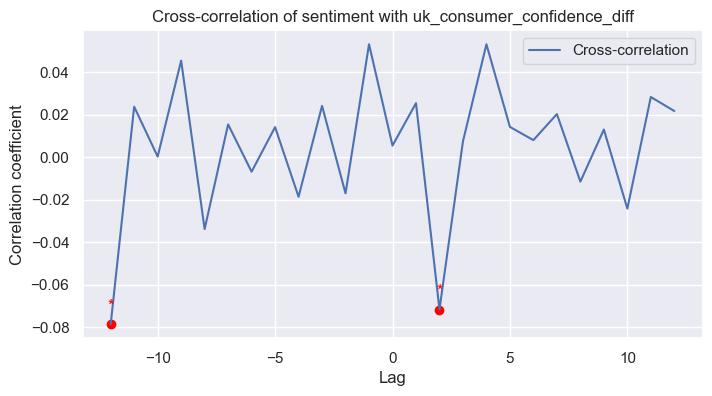


Significant lags for uk_consumer_confidence_diff:
Lag -12: p-value=0.0098, correlation=-0.079
Lag 2: p-value=0.0180, correlation=-0.072


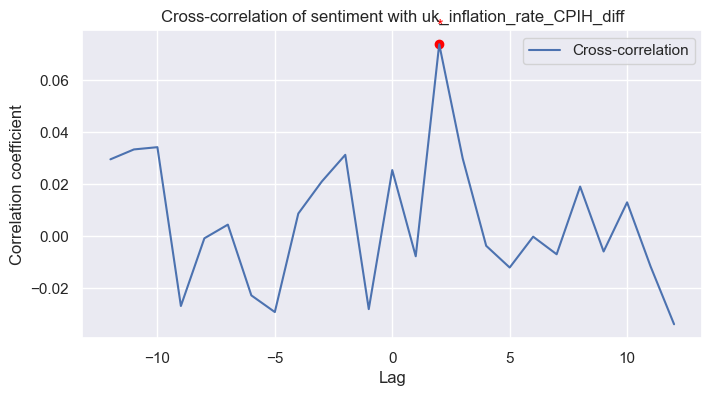


Significant lags for uk_inflation_rate_CPIH_diff:
Lag 2: p-value=0.0150, correlation=0.074


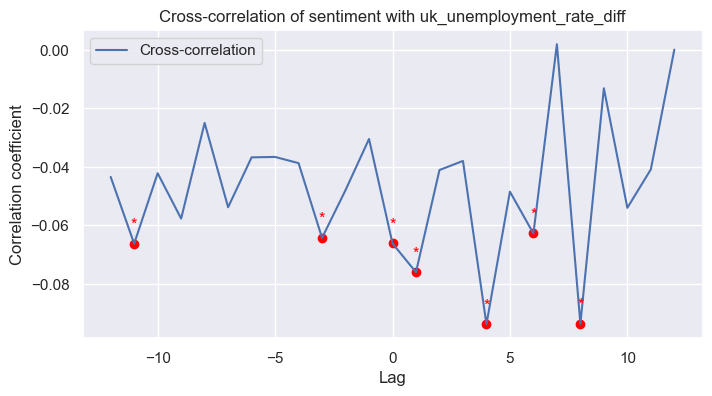


Significant lags for uk_unemployment_rate_diff:
Lag -11: p-value=0.0297, correlation=-0.066
Lag -3: p-value=0.0343, correlation=-0.064
Lag 0: p-value=0.0292, correlation=-0.066
Lag 1: p-value=0.0122, correlation=-0.076
Lag 4: p-value=0.0020, correlation=-0.094
Lag 6: p-value=0.0391, correlation=-0.063
Lag 8: p-value=0.0021, correlation=-0.094


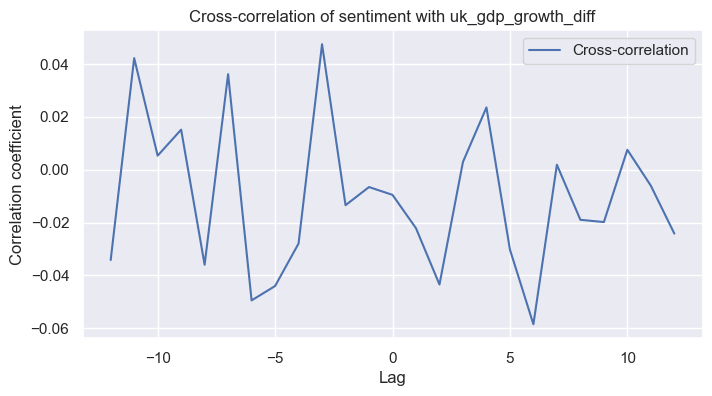


Significant lags for uk_gdp_growth_diff:


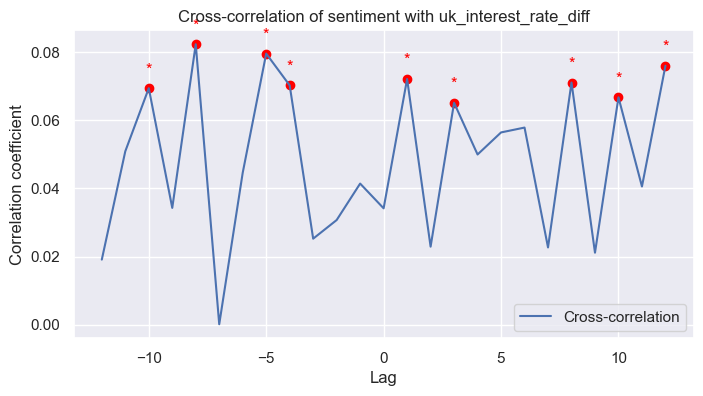


Significant lags for uk_interest_rate_diff:
Lag -10: p-value=0.0226, correlation=0.069
Lag -8: p-value=0.0068, correlation=0.082
Lag -5: p-value=0.0088, correlation=0.080
Lag -4: p-value=0.0207, correlation=0.070
Lag 1: p-value=0.0174, correlation=0.072
Lag 3: p-value=0.0319, correlation=0.065
Lag 8: p-value=0.0195, correlation=0.071
Lag 10: p-value=0.0284, correlation=0.067
Lag 12: p-value=0.0126, correlation=0.076


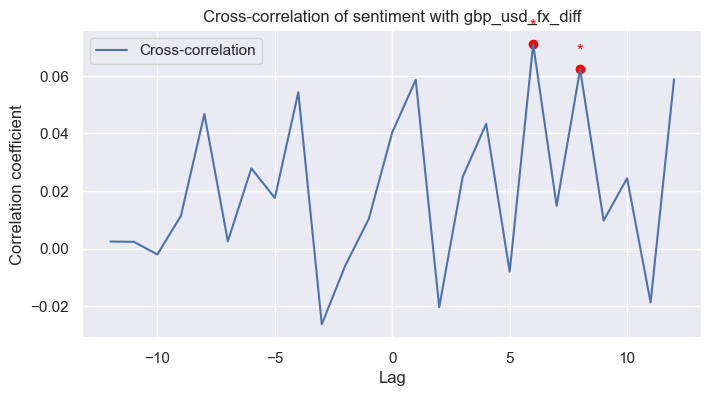


Significant lags for gbp_usd_fx_diff:
Lag 6: p-value=0.0195, correlation=0.071
Lag 8: p-value=0.0407, correlation=0.062


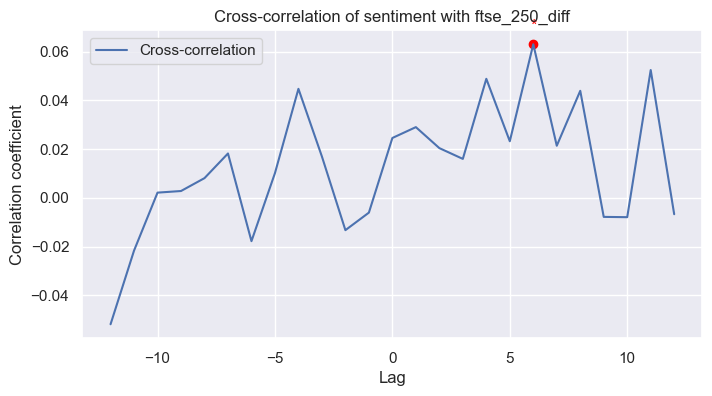


Significant lags for ftse_250_diff:
Lag 6: p-value=0.0384, correlation=0.063


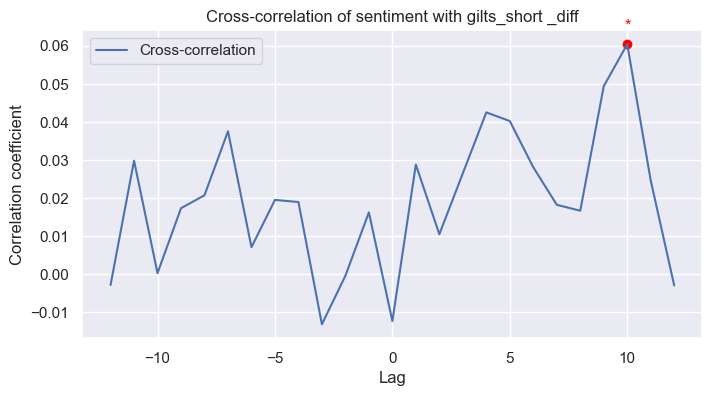


Significant lags for gilts_short _diff:
Lag 10: p-value=0.0475, correlation=0.060


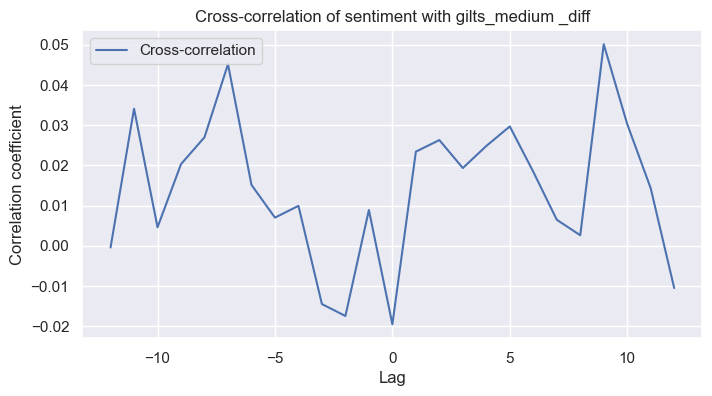


Significant lags for gilts_medium _diff:


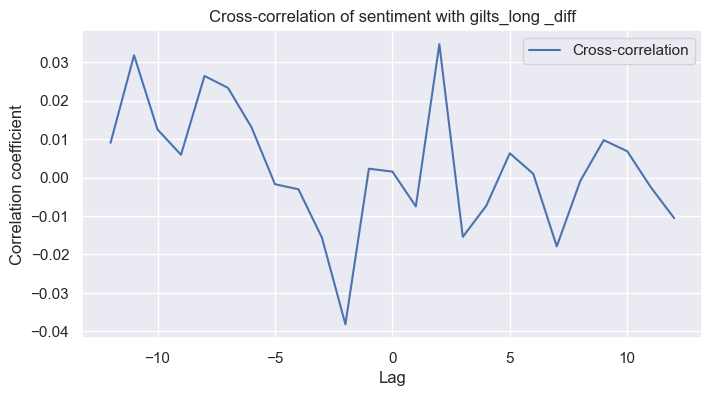


Significant lags for gilts_long _diff:


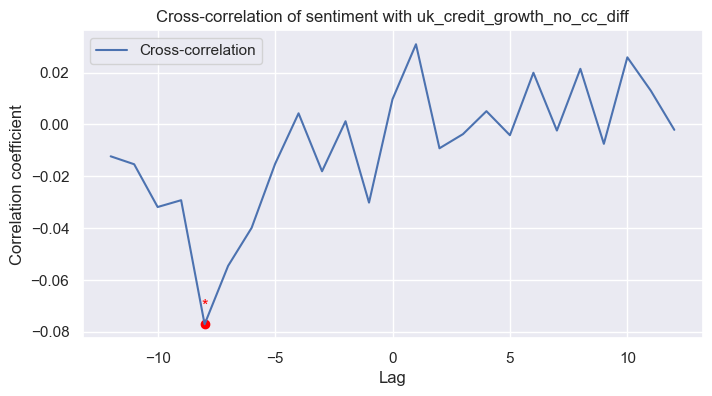


Significant lags for uk_credit_growth_no_cc_diff:
Lag -8: p-value=0.0112, correlation=-0.077


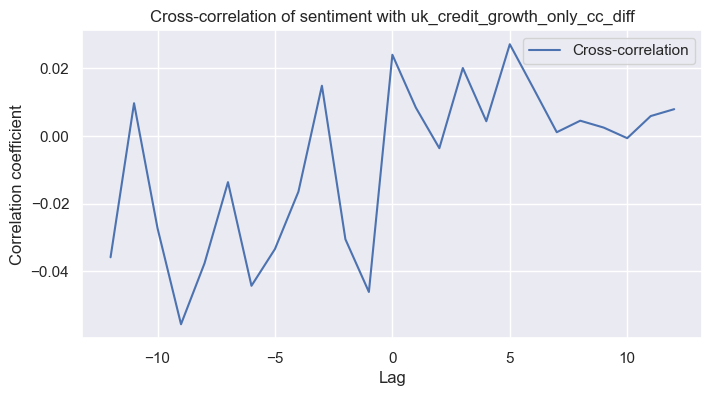


Significant lags for uk_credit_growth_only_cc_diff:


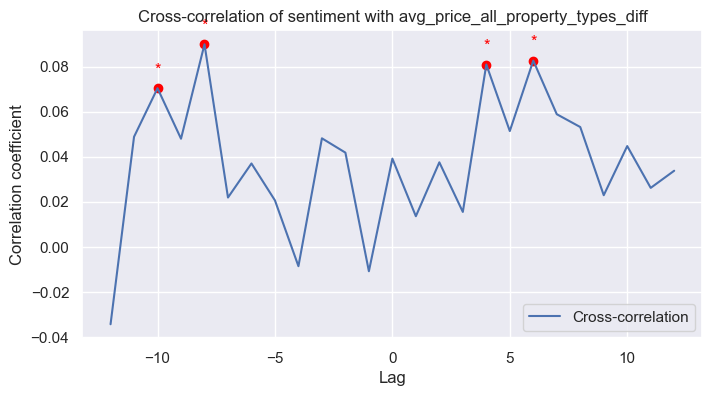


Significant lags for avg_price_all_property_types_diff:
Lag -10: p-value=0.0208, correlation=0.070
Lag -8: p-value=0.0031, correlation=0.090
Lag 4: p-value=0.0077, correlation=0.081
Lag 6: p-value=0.0066, correlation=0.083


In [450]:
for i, var in enumerate(indicators_diff):
    cc = []
    p_values = []

    for lag in lags:
        x = boe_rf_diff['sentiment_lexicon_weighted']
        y = boe_rf_diff[var].shift(lag)

        # Drop NaNs that might be introduced after shift
        valid_idx = x.dropna().index.intersection(y.dropna().index)
        n = len(valid_idx)

        if n > 2:
            x_valid = x.loc[valid_idx]
            y_valid = y.loc[valid_idx]
            r = x_valid.corr(y_valid)
            cc.append(r)
            # Convert r to t-stat and p-value
            t_stat = r * np.sqrt((n - 2) / (1 - r**2))
            p = 2 * (1 - stats.t.cdf(abs(t_stat), df=n - 2))
        else:
            cc.append(np.nan)
            p = np.nan
        p_values.append(p)

    # Plotting the correlation over lags
    plt.figure(figsize=(8, 4))
    plt.plot(lags, cc, label='Cross-correlation')
    for j, p in enumerate(p_values):
        if not np.isnan(p) and p < 0.05:
            plt.scatter(lags[j], cc[j], color='red', marker='o')
            plt.annotate('*', (lags[j], cc[j]), textcoords="offset points", xytext=(0,10), ha='center', color='red')

    plt.title(f'Cross-correlation of sentiment with {var}')
    plt.xlabel('Lag')
    plt.ylabel('Correlation coefficient')
    plt.grid(True)
    plt.legend()
    plt.show()

    # Print significant lags with both p-value and correlation coefficient
    print(f"\nSignificant lags for {var}:")
    for lag_idx, p in enumerate(p_values):
        if not np.isnan(p) and p < 0.05:
            corr_coeff = cc[lag_idx]
            print(f"Lag {lags[lag_idx]}: p-value={p:.4f}, correlation={corr_coeff:.3f}")

In [ ]:
for var in indicators_diff:
    for lag in lags:
        shifted_sentiment = boe_rf_diff['sentiment_lexicon_weighted'].shift(lag)
        
        fig, ax1 = plt.subplots(figsize=(12, 4))
        
        color1 = 'blue'
        color2 = 'orange'

        # Plot indicator on primary axis
        ax1.plot(boe_rf_diff.index, boe_rf_diff[var], color=color1, label='Indicator')
        ax1.set_xlabel('Time')
        ax1.set_ylabel(var, color=color1)
        ax1.tick_params(axis='y', labelcolor=color1)

        # Plot sentiment on secondary axis
        ax2 = ax1.twinx()
        ax2.plot(boe_rf_diff.index, shifted_sentiment, color=color2, label='Sentiment shifted')
        ax2.set_ylabel('Sentiment', color=color2)
        ax2.tick_params(axis='y', labelcolor=color2)

        plt.title(f'{var} with sentiment shifted by {lag}')
        plt.legend(loc='upper left')
        ax1.legend(loc='upper right')
        plt.grid(True)
        plt.tight_layout()
        plt.show()

In [ ]:
for var in indicators_diff:
    for lag in lags:
        sentiment = boe_rf_diff['sentiment_lexicon_weighted']
        shifted_sentiment = sentiment.shift(lag)
        indicator_series = boe_rf_diff[var]

        # Normalize all three series
        sentiment_norm = (sentiment - sentiment.mean()) / sentiment.std()
        shifted_sentiment_norm = (shifted_sentiment - shifted_sentiment.mean()) / shifted_sentiment.std()
        indicator_norm = (indicator_series - indicator_series.mean()) / indicator_series.std()

        # Plot
        plt.figure(figsize=(12, 4))
        plt.plot(boe_rf_diff.index, indicator_norm, label='Indicator (normalized)', color='blue')
        plt.plot(boe_rf_diff.index, shifted_sentiment_norm, label='Sentiment shifted (normalized)', color='orange')

        plt.title(f'{var} with sentiment shifted by {lag} (normalized)')
        plt.xlabel('Time')
        plt.ylabel('Normalized value')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

In [ ]:
# Define your window size for smoothing (e.g., 7 periods)
window_size = 7

for var in indicators_diff:
    for lag in lags:
        sentiment = boe_rf_diff['sentiment_lexicon_weighted']
        shifted_sentiment = sentiment.shift(lag)
        indicator_series = boe_rf_diff[var]
        
        # Calculate moving averages
        sentiment_ma = sentiment.rolling(window=window_size, min_periods=1).mean()
        shifted_sent_ma = shifted_sentiment.rolling(window=window_size, min_periods=1).mean()
        indicator_ma = indicator_series.rolling(window=window_size, min_periods=1).mean()
        
        # Plot smoothed series
        plt.figure(figsize=(12, 4))
        plt.plot(boe_rf_diff.index, indicator_ma, label='Indicator (smoothed)', color='blue')
        plt.plot(boe_rf_diff.index, shifted_sent_ma, label='Sentiment shift (smoothed)', color='orange')

        plt.title(f'{var} with sentiment shifted by {lag} (smoothed)')
        plt.xlabel('Time')
        plt.ylabel('Smoothed and normalized value')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

In [ ]:
# Define your window size for smoothing
window_size = 7

for var in indicators_diff:
    for lag in lags:
        sentiment = boe_rf_diff['sentiment_lexicon_weighted']
        shifted_sentiment = sentiment.shift(lag)
        indicator_series = boe_rf_diff[var]
        
        # Calculate moving averages
        sentiment_ma = sentiment.rolling(window=window_size, min_periods=1).mean()
        shifted_sent_ma = shifted_sentiment.rolling(window=window_size, min_periods=1).mean()
        indicator_ma = indicator_series.rolling(window=window_size, min_periods=1).mean()
        
        # Normalize (standardize) after smoothing
        sentiment_norm = (sentiment_ma - sentiment_ma.mean()) / sentiment_ma.std()
        shifted_sent_norm = (shifted_sent_ma - shifted_sent_ma.mean()) / shifted_sent_ma.std()
        indicator_norm = (indicator_ma - indicator_ma.mean()) / indicator_ma.std()
        
        # Plot normalized and smoothed series
        plt.figure(figsize=(12, 4))
        plt.plot(boe_rf_diff.index, indicator_norm, label='Indicator (smoothed & normalized)', color='blue')
        plt.plot(boe_rf_diff.index, shifted_sent_norm, label='Sentiment shifted (smoothed & normalized)', color='orange')
        
        plt.title(f'{var} with sentiment shifted by {lag} (smoothed & normalized)')
        plt.xlabel('Time')
        plt.ylabel('Normalized & Smoothed Value')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

In [ ]:
# Filter out Brexit period
start_date = '2016-01-01'
end_date = '2016-12-31'

# Filter the data to this period
period_df = boe_rf_diff.loc[start_date:end_date]

# Then apply your smoothing/normalization and plot
# For example, with smoothing + normalization:
window_size = 7
for var in indicators_diff:
    for lag in lags:
        sentiment = period_df['sentiment_lexicon_weighted']
        shifted_sentiment = sentiment.shift(lag)
        indicator_series = period_df[var]
        
        # Smooth
        sentiment_ma = sentiment.rolling(window=window_size, min_periods=1).mean()
        shifted_sent_ma = shifted_sentiment.rolling(window=window_size, min_periods=1).mean()
        indicator_ma = indicator_series.rolling(window=window_size, min_periods=1).mean()
        
        # Normalize
        sentiment_norm = (sentiment_ma - sentiment_ma.mean()) / sentiment_ma.std()
        shifted_sent_norm = (shifted_sent_ma - shifted_sent_ma.mean()) / shifted_sent_ma.std()
        indicator_norm = (indicator_ma - indicator_ma.mean()) / indicator_ma.std()
        
        # Plot
        plt.figure(figsize=(12, 4))
        plt.plot(period_df.index, indicator_norm, label='Indicator')
        plt.plot(period_df.index, shifted_sent_norm, label='Sentiment shifted')
        plt.title(f'{var} with sentiment shift at lag {lag} (filtered period)')
        plt.legend()
        plt.grid(True)
        plt.show()


In [461]:
# List of target variables to test against sentiment
targets = [
    'uk_consumer_confidence_diff', 'uk_inflation_rate_CPIH_diff', 'uk_unemployment_rate_diff',
    'uk_gdp_growth', 'uk_interest_rate_diff', 'gbp_usd_fx_diff', 'ftse_250_diff',
    'gilts_short _diff', 'gilts_medium _diff', 'gilts_long _diff',
    'uk_credit_growth_no_cc_diff', 'uk_credit_growth_only_cc_diff',
    'avg_price_all_property_types_diff'
]

max_lag = 4  # or whatever lag range you prefer

results_dict = {}

for target in targets:
    # Prepare data: stationarize if needed
    data = boe_rf_diff[[target, 'sentiment_lexicon_weighted']].dropna()
    # Optionally difference if non-stationary
    # data = data.diff().dropna()
    
    print(f"\nTesting if sentiment Granger-causes {target}")
    # Run test
    results = grangercausalitytests(data, maxlag=max_lag, verbose=False)
    # Store or process results
    results_dict[target] = results
    # Optionally, print or interpret results
    for lag in range(1, max_lag+1):
        p_value = results[lag][0]['ssr_ftest'][1]  # or other tests
        print(f"Lag {lag}: p-value = {p_value:.4f}")


Testing if sentiment Granger-causes uk_consumer_confidence_diff
Lag 1: p-value = 0.0661
Lag 2: p-value = 0.1292
Lag 3: p-value = 0.2065
Lag 4: p-value = 0.2818

Testing if sentiment Granger-causes uk_inflation_rate_CPIH_diff
Lag 1: p-value = 0.3355
Lag 2: p-value = 0.3200
Lag 3: p-value = 0.3478
Lag 4: p-value = 0.5285

Testing if sentiment Granger-causes uk_unemployment_rate_diff
Lag 1: p-value = 0.3317
Lag 2: p-value = 0.2413
Lag 3: p-value = 0.1211
Lag 4: p-value = 0.2419

Testing if sentiment Granger-causes uk_gdp_growth
Lag 1: p-value = 0.7878
Lag 2: p-value = 0.8523
Lag 3: p-value = 0.3641
Lag 4: p-value = 0.3794

Testing if sentiment Granger-causes uk_interest_rate_diff
Lag 1: p-value = 0.1736
Lag 2: p-value = 0.2567
Lag 3: p-value = 0.4623
Lag 4: p-value = 0.2915

Testing if sentiment Granger-causes gbp_usd_fx_diff
Lag 1: p-value = 0.7197
Lag 2: p-value = 0.9213
Lag 3: p-value = 0.8026
Lag 4: p-value = 0.2965

Testing if sentiment Granger-causes ftse_250_diff
Lag 1: p-value = 

**Computing the correlation** between:
- the economic indicator at time t,
- and the speech sentiment at time t + lag

In [ ]:
indicators_diff = ['uk_consumer_confidence_diff', 'uk_inflation_rate_CPIH_diff', 'uk_unemployment_rate_diff',
              'uk_gdp_growth_diff', 'uk_interest_rate_diff', 'gbp_usd_fx_diff', 'ftse_250_diff',
              'gilts_short _diff', 'gilts_medium _diff', 'gilts_long _diff',
              'uk_credit_growth_no_cc_diff', 'uk_credit_growth_only_cc_diff',
              'avg_price_all_property_types_diff']

In [471]:
sentiment_cross = ['sentiment_lexicon_weighted']

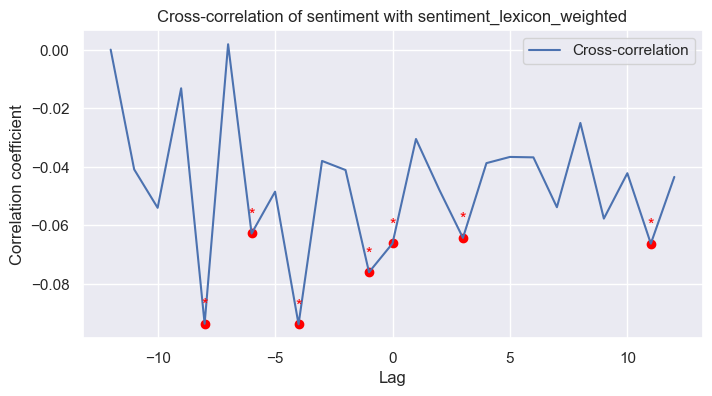


Significant lags for sentiment_lexicon_weighted:
Lag -8: p-value=0.0021, correlation=-0.094
Lag -6: p-value=0.0391, correlation=-0.063
Lag -4: p-value=0.0020, correlation=-0.094
Lag -1: p-value=0.0122, correlation=-0.076
Lag 0: p-value=0.0292, correlation=-0.066
Lag 3: p-value=0.0343, correlation=-0.064
Lag 11: p-value=0.0298, correlation=-0.066


In [473]:
for i, var in enumerate(sentiment_cross):
    cc = []
    p_values = []

    for lag in lags:
        x = boe_rf_diff['uk_unemployment_rate_diff']
        y = boe_rf_diff[var].shift(lag)

        # Drop NaNs that might be introduced after shift
        valid_idx = x.dropna().index.intersection(y.dropna().index)
        n = len(valid_idx)

        if n > 2:
            x_valid = x.loc[valid_idx]
            y_valid = y.loc[valid_idx]
            r = x_valid.corr(y_valid)
            cc.append(r)
            # Convert r to t-stat and p-value
            t_stat = r * np.sqrt((n - 2) / (1 - r**2))
            p = 2 * (1 - stats.t.cdf(abs(t_stat), df=n - 2))
        else:
            cc.append(np.nan)
            p = np.nan
        p_values.append(p)

    # Plotting the correlation over lags
    plt.figure(figsize=(8, 4))
    plt.plot(lags, cc, label='Cross-correlation')
    for j, p in enumerate(p_values):
        if not np.isnan(p) and p < 0.05:
            plt.scatter(lags[j], cc[j], color='red', marker='o')
            plt.annotate('*', (lags[j], cc[j]), textcoords="offset points", xytext=(0,10), ha='center', color='red')

    plt.title(f'Cross-correlation of unemployment with {var}')
    plt.xlabel('Lag')
    plt.ylabel('Correlation coefficient')
    plt.grid(True)
    plt.legend()
    plt.show()

    # Print significant lags with both p-value and correlation coefficient
    print(f"\nSignificant lags for {var}:")
    for lag_idx, p in enumerate(p_values):
        if not np.isnan(p) and p < 0.05:
            corr_coeff = cc[lag_idx]
            print(f"Lag {lags[lag_idx]}: p-value={p:.4f}, correlation={corr_coeff:.3f}")

                            indicator  lag  correlation   p_value
0         uk_consumer_confidence_diff   12    -0.078710  0.006836
1           uk_unemployment_rate_diff    3    -0.064275  0.026539
2           uk_unemployment_rate_diff    9    -0.057670  0.047070
3           uk_unemployment_rate_diff   11    -0.066243  0.022708
4               uk_interest_rate_diff    4     0.070291  0.015336
5               uk_interest_rate_diff    5     0.079636  0.006059
6               uk_interest_rate_diff    8     0.082380  0.004580
7               uk_interest_rate_diff   10     0.069466  0.016852
8                       ftse_250_diff   15    -0.090654  0.001873
9         uk_credit_growth_no_cc_diff    8    -0.077128  0.007931
10      uk_credit_growth_only_cc_diff   18    -0.062793  0.031277
11  avg_price_all_property_types_diff    8     0.089911  0.001979
12  avg_price_all_property_types_diff   10     0.070395  0.015444
13  avg_price_all_property_types_diff   14     0.059052  0.042469
14  avg_pr

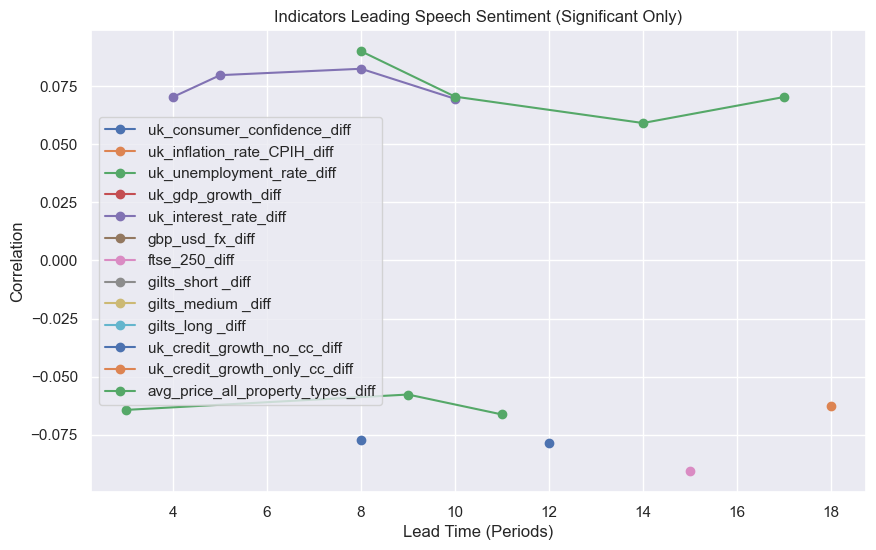

In [463]:
max_lag = 20  # maximum lead periods to check
results_all = []

for indicator in indicators_diff:
    results = []
    for lag in range(1, max_lag + 1):
        # Create a shifted version of the indicator: indicator at time t predicts speech at t + lag
        boe_rf_diff[f'{indicator}_lead_{lag}'] = boe_rf_diff[indicator].shift(-lag)
        temp_df = boe_rf_diff[['sentiment_lexicon_weighted', f'{indicator}_lead_{lag}']].dropna()

        # Compute correlation
        corr = temp_df['sentiment_lexicon_weighted'].corr(temp_df[f'{indicator}_lead_{lag}'])

        # Calculate p-value for significance
        n = len(temp_df)
        se = 1 / np.sqrt(n - 3)
        t_stat = corr / se
        p_value = 2 * t.sf(np.abs(t_stat), n - 2)

        results.append({'indicator': indicator, 'lag': lag, 'correlation': corr, 'p_value': p_value})

    # Convert this indicator's results to DataFrame and filter significant
    results_df = pd.DataFrame(results)
    sig_results = results_df[results_df['p_value'] < 0.05]
    results_all.append(sig_results)

# Concatenate all significant results
all_significant = pd.concat(results_all, ignore_index=True)

# Print all significant relationships
print(all_significant)

# Optional: plot the correlations for all indicators
import seaborn as sns
plt.figure(figsize=(10, 6))
for indicator in indicators_diff:
    subset = all_significant[all_significant['indicator'] == indicator]
    plt.plot(subset['lag'], subset['correlation'], marker='o', label=indicator)
plt.xlabel('Lead Time (Periods)')
plt.ylabel('Correlation')
plt.title('Indicators Leading Speech Sentiment (Significant Only)')
plt.legend()
plt.show()

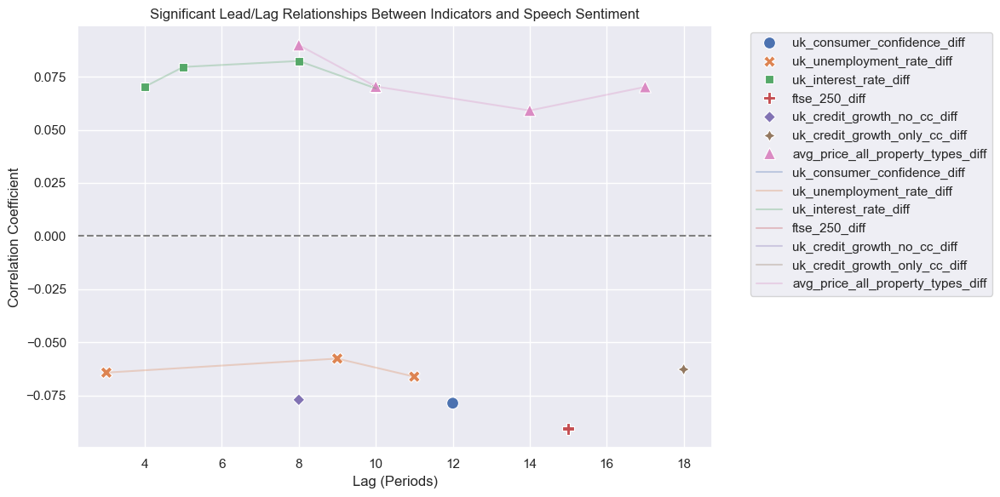

In [465]:
# Your results as a list of dicts
results = [
    {'indicator': 'uk_consumer_confidence_diff', 'lag': 12, 'correlation': -0.0787, 'p_value': 0.0068},
    {'indicator': 'uk_unemployment_rate_diff', 'lag': 3, 'correlation': -0.0643, 'p_value': 0.0265},
    {'indicator': 'uk_unemployment_rate_diff', 'lag': 9, 'correlation': -0.0577, 'p_value': 0.0471},
    {'indicator': 'uk_unemployment_rate_diff', 'lag': 11, 'correlation': -0.0662, 'p_value': 0.0227},
    {'indicator': 'uk_interest_rate_diff', 'lag': 4, 'correlation': 0.0703, 'p_value': 0.0153},
    {'indicator': 'uk_interest_rate_diff', 'lag': 5, 'correlation': 0.0796, 'p_value': 0.0061},
    {'indicator': 'uk_interest_rate_diff', 'lag': 8, 'correlation': 0.0824, 'p_value': 0.0046},
    {'indicator': 'uk_interest_rate_diff', 'lag': 10, 'correlation': 0.0695, 'p_value': 0.0169},
    {'indicator': 'ftse_250_diff', 'lag': 15, 'correlation': -0.0907, 'p_value': 0.0019},
    {'indicator': 'uk_credit_growth_no_cc_diff', 'lag': 8, 'correlation': -0.0771, 'p_value': 0.0079},
    {'indicator': 'uk_credit_growth_only_cc_diff', 'lag': 18, 'correlation': -0.0628, 'p_value': 0.0313},
    {'indicator': 'avg_price_all_property_types_diff', 'lag': 8, 'correlation': 0.0899, 'p_value': 0.0020},
    {'indicator': 'avg_price_all_property_types_diff', 'lag': 10, 'correlation': 0.0704, 'p_value': 0.0154},
    {'indicator': 'avg_price_all_property_types_diff', 'lag': 14, 'correlation': 0.0591, 'p_value': 0.0425},
    {'indicator': 'avg_price_all_property_types_diff', 'lag': 17, 'correlation': 0.0702, 'p_value': 0.0160},
    # add other results if needed
]

# Convert to DataFrame
df_results = pd.DataFrame(results)

# Filter only significant
signif = df_results[df_results['p_value'] < 0.05]

# Plot
plt.figure(figsize=(12, 6))
sns.scatterplot(data=signif, x='lag', y='correlation', hue='indicator', style='indicator', s=100)

# Add lines connecting points of the same indicator (optional)
for indicator in signif['indicator'].unique():
    subset = signif[signif['indicator'] == indicator]
    plt.plot(subset['lag'], subset['correlation'], label=indicator, alpha=0.3)

plt.axhline(0, color='gray', linestyle='--')
plt.xlabel('Lag (Periods)')
plt.ylabel('Correlation Coefficient')
plt.title('Significant Lead/Lag Relationships Between Indicators and Speech Sentiment')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


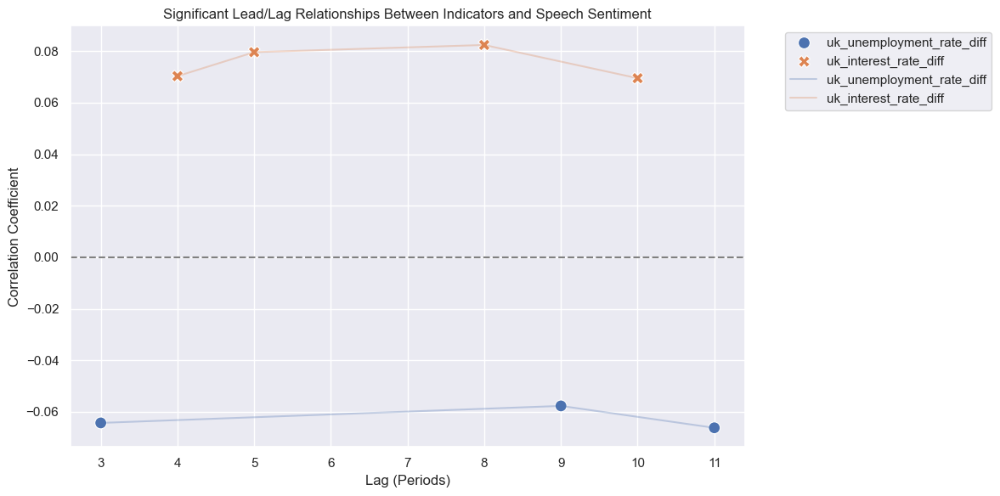

In [469]:
# Your results as a list of dicts
results_focus = [
    {'indicator': 'uk_unemployment_rate_diff', 'lag': 3, 'correlation': -0.0643, 'p_value': 0.0265},
    {'indicator': 'uk_unemployment_rate_diff', 'lag': 9, 'correlation': -0.0577, 'p_value': 0.0471},
    {'indicator': 'uk_unemployment_rate_diff', 'lag': 11, 'correlation': -0.0662, 'p_value': 0.0227},
    {'indicator': 'uk_interest_rate_diff', 'lag': 4, 'correlation': 0.0703, 'p_value': 0.0153},
    {'indicator': 'uk_interest_rate_diff', 'lag': 5, 'correlation': 0.0796, 'p_value': 0.0061},
    {'indicator': 'uk_interest_rate_diff', 'lag': 8, 'correlation': 0.0824, 'p_value': 0.0046},
    {'indicator': 'uk_interest_rate_diff', 'lag': 10, 'correlation': 0.0695, 'p_value': 0.0169},
]

# Convert to DataFrame
df_results = pd.DataFrame(results_focus)

# Filter only significant
signif = df_results[df_results['p_value'] < 0.05]

# Plot
plt.figure(figsize=(12, 6))
sns.scatterplot(data=signif, x='lag', y='correlation', hue='indicator', style='indicator', s=100)

# Add lines connecting points of the same indicator (optional)
for indicator in signif['indicator'].unique():
    subset = signif[signif['indicator'] == indicator]
    plt.plot(subset['lag'], subset['correlation'], label=indicator, alpha=0.3)

plt.axhline(0, color='gray', linestyle='--')
plt.xlabel('Lag (Periods)')
plt.ylabel('Correlation Coefficient')
plt.title('Significant Lead/Lag Relationships Between Indicators and Speech Sentiment')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

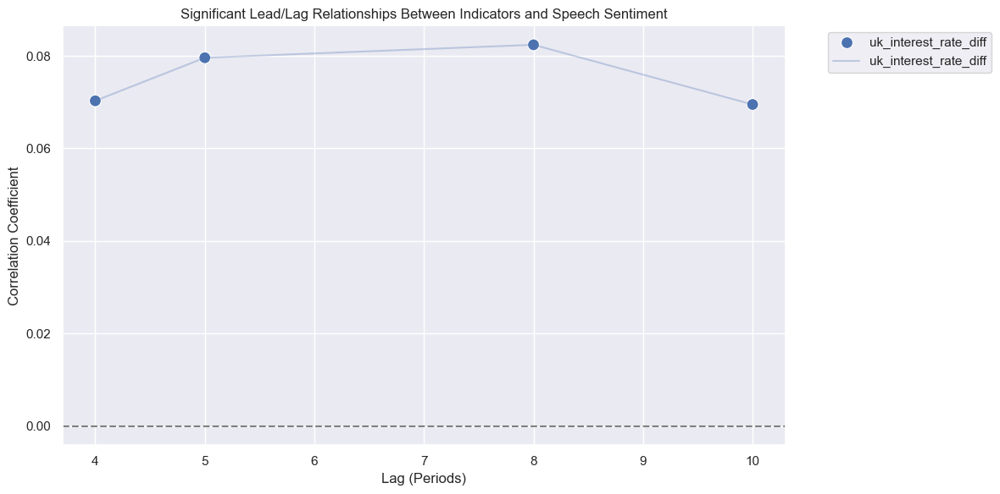

In [475]:
# Your results as a list of dicts
results_focus = [
    {'indicator': 'uk_interest_rate_diff', 'lag': 4, 'correlation': 0.0703, 'p_value': 0.0153},
    {'indicator': 'uk_interest_rate_diff', 'lag': 5, 'correlation': 0.0796, 'p_value': 0.0061},
    {'indicator': 'uk_interest_rate_diff', 'lag': 8, 'correlation': 0.0824, 'p_value': 0.0046},
    {'indicator': 'uk_interest_rate_diff', 'lag': 10, 'correlation': 0.0695, 'p_value': 0.0169},
]

# Convert to DataFrame
df_results = pd.DataFrame(results_focus)

# Filter only significant
signif = df_results[df_results['p_value'] < 0.05]

# Plot
plt.figure(figsize=(12, 6))
sns.scatterplot(data=signif, x='lag', y='correlation', hue='indicator', style='indicator', s=100)

# Add lines connecting points of the same indicator (optional)
for indicator in signif['indicator'].unique():
    subset = signif[signif['indicator'] == indicator]
    plt.plot(subset['lag'], subset['correlation'], label=indicator, alpha=0.3)

plt.axhline(0, color='gray', linestyle='--')
plt.xlabel('Lag (Periods)')
plt.ylabel('Correlation Coefficient')
plt.title('Significant Lead/Lag Relationships Between Indicators and Speech Sentiment')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

## 6. Insights and Recommendations